# Prédiction du Carbone Organique (C_orga) - Atelier prédiction spatiale

## Dataset
- **25k observations** de sols avec coordonnées géographiques
- **Variable cible :** C_orga (Carbone organique)
- **5 features autorisées :** LONGITUDE, LATITUDE, ALTITUDE, YEAR, SOIL

## Modèles utilisés
1. **Baseline :** Linear Regression, Random Forest
2. **Trees :** XGBoost, LightGBM, CatBoost
3. **Deep Learning :** TabPFN (Transformers), GNN (Graph Neural Network)
4. **Spatial :** Kriging Universel, GWR (Geographically Weighted Regression)
5. **Stacking :** Comparaison de 7 méta-learners (LinearRegression, RidgeCV, ElasticNetCV, NNLS, HuberRegressor, RandomForest, GradientBoosting)

## Optimisation
- **Optuna** pour tous les modèles (sauf Linear, GNN et spatial) et pour les metalearners.


### Author
beurier@cirad.fr

## Phase 1 : Environment Prepration & Data Loading

In [57]:
# Import des bibliothèques essentielles
import contextily as ctx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Import d'Optuna pour l'optimisation des hyperparamètres
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Import pour la sauvegarde/chargement des modèles
import pickle
import joblib
import os
from pathlib import Path

# Import des nouveaux modèles
try:
    import catboost as cb
    catboost_available = True
except ImportError:
    catboost_available = False
    print("! CatBoost non disponible")

try:
    from tabpfn import TabPFNRegressor
    tabpfn_available = True
except ImportError:
    tabpfn_available = False
    print("! TabPFN non disponible")

try:
    import torch
    import torch_geometric
    from torch_geometric.data import Data
    from torch_geometric.nn import GCNConv, global_mean_pool
    torch_available = True
except ImportError:
    torch_available = False
    print("! PyTorch Geometric non disponible")

try:
    import xgboost as xgb
    xgb_available = True
except ImportError:
    print("! XGBoost non disponible")
    xgb_available = False


try:
    import lightgbm as lgb
    lgbm_available = True
except ImportError:
    print("! LightGBM non disponible")
    lgbm_available = False


# Configuration de l'affichage
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

print(f"Versions : pandas {pd.__version__}, numpy {np.__version__}, optuna {optuna.__version__}")
print(f"XGBoost disponible : {xgb_available}")
print(f"CatBoost disponible : {catboost_available}")
print(f"TabPFN disponible : {tabpfn_available}")
print(f"PyTorch Geometric disponible : {torch_available}")
print(f"LGBM disponible : {lgbm_available}")


Versions : pandas 2.3.3, numpy 2.3.3, optuna 4.5.0
XGBoost disponible : True
CatBoost disponible : True
TabPFN disponible : True
PyTorch Geometric disponible : True
LGBM disponible : True


In [58]:
QUICK_TEST_MODE = False  # Mettre à True pour exécuter le notebook rapidement avec des paramètres minimaux pour test
STOP_AFTER_DATA_PREPARATION = False

if QUICK_TEST_MODE:
    print("=" * 80)
    print("MODE TEST RAPIDE ACTIVÉ")
    print("=" * 80)

    # Paramètres pour mode rapide
    N_TRIALS_OPTUNA = 2          # Nombre d'essais Optuna (production: 150)
    LGB_N_TRIALS_OPTUNA = 2     # Nombre d'essais Optuna (production: 80)
    TABPFN_N_TRIALS_OPTUNA = 2   # Nombre d'essais Optuna (production: 30)
    CATBOOST_N_TRIALS_OPTUNA = 2 # Nombre d'essais Optuna pour CatBoost (production: 50)
    N_TRIALS_META_LEARNERS = 2   # Nombre d'essais Optuna pour meta-learners (production: 100)
    MAX_POINTS_GWR = 50          # Points pour GWR (production: 1500)
    MAX_POINTS_KRIGING = 30      # Points pour Kriging (production: 800)
    RF_N_ESTIMATORS_MIN = 2      # in arbres RF (production: 500)
    RF_N_ESTIMATORS_MAX = 10     # Max arbres RF (production: 500)
    XGB_N_ESTIMATORS_MIN = 2    # Min arbres XGB (production: 50)
    XGB_N_ESTIMATORS_MAX = 10    # Max arbres XGB (production: 500)
    CATBOOST_ITERATIONS_MIN = 2  # Min itérations CatBoost (production: 200)
    CATBOOST_ITERATIONS_MAX = 10 # Max itérations CatBoost (production: 1000)
    TABPFN_N_ESTIMATORS_MIN = 1     # Min estimators TabPFN (production: 4)
    TABPFN_N_ESTIMATORS_MAX = 2    # Max  estimators TabPFN (production: 32)
    GNN_EPOCHS = 2              # Max number of epoch (production: 1500)
    CV_FOLDS = 2                  # Folds pour validation croisée (production: 3-5)
    META_CV_FOLDS = 2            # CV folds pour meta-learners (production: 5)

else:
    print("=" * 80)
    print("MODE PRODUCTION ACTIVÉ")
    print("=" * 80)

    # Paramètres pour production (optimaux)
    N_TRIALS_OPTUNA = 150
    LGB_N_TRIALS_OPTUNA = 80
    TABPFN_N_TRIALS_OPTUNA = 40
    CATBOOST_N_TRIALS_OPTUNA = 50
    N_TRIALS_META_LEARNERS = 50
    MAX_POINTS_GWR = 12000
    MAX_POINTS_KRIGING = 8000
    RF_N_ESTIMATORS_MIN = 100
    RF_N_ESTIMATORS_MAX = 500
    XGB_N_ESTIMATORS_MIN = 50
    XGB_N_ESTIMATORS_MAX = 500
    CATBOOST_ITERATIONS_MIN = 100
    CATBOOST_ITERATIONS_MAX = 1000
    TABPFN_N_ESTIMATORS_MIN = 2
    TABPFN_N_ESTIMATORS_MAX = 16
    GNN_EPOCHS = 1500
    CV_FOLDS = 3
    META_CV_FOLDS = 3

MODE PRODUCTION ACTIVÉ


In [66]:
# Setup checkpoint directory for saving/loading models
CHECKPOINT_DIR = Path('./checkpoints')
CHECKPOINT_DIR.mkdir(exist_ok=True)

print("=" * 80)
print("CHECKPOINT SYSTEM SETUP")
print("=" * 80)
print(f"Checkpoint directory: {CHECKPOINT_DIR.absolute()}")
print("=" * 80)


CHECKPOINT SYSTEM SETUP
Checkpoint directory: /home/dunkean/spatial/checkpoints


**Resume Training After Kernel Restart:**

All models and their intermediate results are saved to `./checkpoints/` directory. This allows you to resume training after a kernel restart without retraining models that have already been computed.


In [60]:
# Chargement du dataset
df = pd.read_csv('data_atelier_11_2025.csv')

# Informations générales
print("=" * 80)
print("> INFORMATIONS GÉNÉRALES DU DATASET")
print("=" * 80)
print(f"Dimensions : {df.shape[0]} lignes × {df.shape[1]} colonnes")
print(f"\nPremières lignes :")
display(df.head())

print("\n" + "=" * 80)
print("> TYPES DE DONNÉES")
print("=" * 80)
print(df.dtypes)

print("\n" + "=" * 80)
print("> STATISTIQUES DESCRIPTIVES")
print("=" * 80)
display(df.describe())

> INFORMATIONS GÉNÉRALES DU DATASET
Dimensions : 24442 lignes × 29 colonnes

Premières lignes :


,ID,LONGITUDE,LATITUDE,ALTITUDE,DATE,YEAR,SOIL,Residual dry matter,Dry matter,pH H2O,pH KCl,N tot.,N-NO3 KCl,N-NH4 KCl,C_orga,P ass.,CEC,Ca ex.,Mg ex.,K ex.,Na ex.,Fe DTPA,Mn DTPA,Zn DTPA,Cu DTPA,pF 1.8,pF 2.0,pF 2.5,pF4.2
0,91372,370357,7637704,117,03/11/2008,2008,Hydric Andosols,0.654,NaN,6.28,4.80,3.413,NaN,NaN,3.631,151.327,8.149,3.588,2.550,0.154,0.159,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,91373,359346,7637463,186,03/11/2008,2008,Hydric Andosols,0.649,NaN,5.16,4.70,4.608,NaN,NaN,5.305,180.764,5.745,0.938,0.715,0.130,0.098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,91374,348486,7637451,55,03/11/2008,2008,Nitisols and Ferralsols,0.809,NaN,5.14,4.03,2.321,NaN,NaN,2.525,219.401,8.075,3.736,1.762,1.314,0.131,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,91375,365297,7636790,275,03/11/2008,2008,Andic Cambisols,0.623,NaN,5.91,5.03,4.185,NaN,NaN,4.829,131.645,11.509,4.608,4.549,0.353,0.249,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,91376,367301,7637572,198,03/11/2008,2008,Hydric Andosols,0.738,NaN,5.97,4.99,5.327,NaN,NaN,6.530,223.187,8.819,3.808,3.337,0.255,0.216,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



> TYPES DE DONNÉES
ID                       int64
LONGITUDE                int64
LATITUDE                 int64
ALTITUDE                 int64
DATE                    object
YEAR                     int64
SOIL                    object
Residual dry matter    float64
Dry matter             float64
pH H2O                 float64
pH KCl                 float64
N tot.                 float64
N-NO3 KCl              float64
N-NH4 KCl              float64
C_orga                 float64
P ass.                 float64
CEC                    float64
Ca ex.                 float64
Mg ex.                 float64
K ex.                  float64
Na ex.                 float64
Fe DTPA                float64
Mn DTPA                float64
Zn DTPA                float64
Cu DTPA                float64
pF 1.8                 float64
pF 2.0                 float64
pF 2.5                 float64
pF4.2                  float64
dtype: object

> STATISTIQUES DESCRIPTIVES


,ID,LONGITUDE,LATITUDE,ALTITUDE,YEAR,Residual dry matter,Dry matter,pH H2O,pH KCl,N tot.,N-NO3 KCl,N-NH4 KCl,C_orga,P ass.,CEC,Ca ex.,Mg ex.,K ex.,Na ex.,Fe DTPA,Mn DTPA,Zn DTPA,Cu DTPA,pF 1.8,pF 2.0,pF 2.5,pF4.2
count,24442.000000,24442.00000,2.444200e+04,24442.000000,24442.000000,23704.000000,1927.000000,22777.000000,22493.000000,23518.000000,1959.000000,1968.000000,23518.000000,22277.000000,22278.000000,22231.000000,22231.000000,22232.000000,22231.000000,1399.000000,1371.000000,1406.000000,1406.000000,54.000000,202.000000,162.000000,354.000000
mean,140521.402340,346284.34093,7.661730e+06,379.380902,2017.043082,0.842453,74.841878,5.889419,4.998100,3.814323,20.295871,5.900131,4.583230,226.192682,11.579048,6.171599,3.358703,0.623682,0.239286,42.625412,34.531115,4.315818,2.735077,41.066204,44.255723,45.122247,25.448435
std,27722.379987,14056.61078,1.746991e+04,405.427129,4.668915,0.087218,7.046304,0.773575,0.649918,3.078037,74.202877,11.802673,3.800426,290.748526,7.612424,5.276903,3.103417,0.722801,0.323441,39.516302,42.005529,7.783528,4.193786,7.690691,12.149535,17.475707,8.980075
min,91372.000000,315270.00000,7.634551e+06,0.000000,2008.000000,0.370000,0.000000,3.700000,2.890000,0.095000,0.000000,0.001000,0.012000,0.000000,0.853000,0.000000,0.010000,0.000000,0.002000,0.026000,0.000000,0.001000,0.003000,20.147000,20.940000,27.410000,6.647000
25%,114393.250000,335454.25000,7.646514e+06,71.000000,2013.000000,0.809000,73.661500,5.330000,4.550000,1.869250,1.289500,1.058750,2.160000,70.325000,6.483000,2.332000,1.299000,0.146000,0.094000,23.198500,3.407500,0.646250,0.753250,37.538250,37.523250,35.186750,21.607750
50%,142829.500000,347185.00000,7.657786e+06,241.000000,2018.000000,0.861000,75.727000,5.890000,4.930000,2.556000,4.372000,2.654000,3.031000,132.262000,9.848000,5.146000,2.641000,0.390000,0.166000,35.793000,15.043000,1.496000,1.493500,40.111500,42.000000,39.175000,24.279500
75%,166114.750000,355355.75000,7.678738e+06,540.000000,2021.000000,0.902000,77.519000,6.410000,5.350000,4.774750,9.812000,6.220000,5.943000,262.183000,14.569000,8.287500,4.276500,0.872000,0.284000,50.035500,52.794500,4.216500,3.213500,44.566500,47.626250,45.337250,28.079250
max,183189.000000,378653.00000,7.691205e+06,2281.000000,2025.000000,0.995000,98.071000,9.610000,8.770000,27.703000,1185.914000,200.421000,54.248000,4419.300000,85.323000,55.928000,40.521000,14.256000,14.171000,575.937000,252.278000,89.632000,75.772000,68.261000,134.425000,121.710000,117.872000


> ANALYSE DE LA VARIABLE CIBLE : C_orga
Statistiques de C_orga :
count    23518.000000
mean         4.583230
std          3.800426
min          0.012000
25%          2.160000
50%          3.031000
75%          5.943000
max         54.248000
Name: C_orga, dtype: float64

Valeurs manquantes : 924 (3.78%)


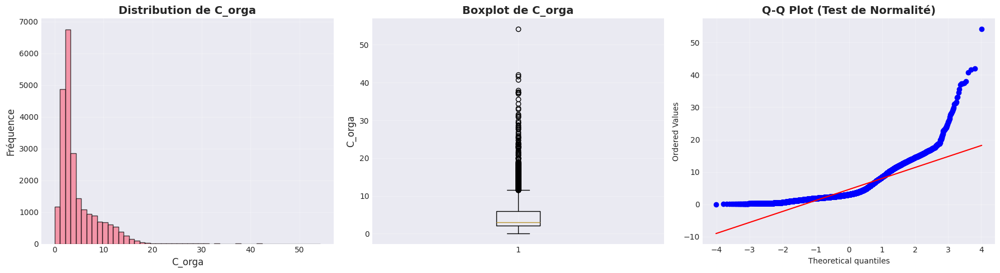

In [61]:
# Analyse de la variable cible : C_orga
print("=" * 80)
print("> ANALYSE DE LA VARIABLE CIBLE : C_orga")
print("=" * 80)

print(f"Statistiques de C_orga :")
print(df['C_orga'].describe())
print(f"\nValeurs manquantes : {df['C_orga'].isna().sum()} ({df['C_orga'].isna().sum()/len(df)*100:.2f}%)")

# Visualisation de la distribution de C_orga
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Histogramme
axes[0].hist(df['C_orga'].dropna(), bins=50, edgecolor='black', alpha=0.7)
axes[0].set_xlabel('C_orga', fontsize=12)
axes[0].set_ylabel('Fréquence', fontsize=12)
axes[0].set_title('Distribution de C_orga', fontsize=14, fontweight='bold')
axes[0].grid(alpha=0.3)

# Boxplot
axes[1].boxplot(df['C_orga'].dropna(), vert=True)
axes[1].set_ylabel('C_orga', fontsize=12)
axes[1].set_title('Boxplot de C_orga', fontsize=14, fontweight='bold')
axes[1].grid(alpha=0.3)

# Q-Q plot pour normalité
stats.probplot(df['C_orga'].dropna(), dist="norm", plot=axes[2])
axes[2].set_title('Q-Q Plot (Test de Normalité)', fontsize=14, fontweight='bold')
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

> ANALYSE DES VALEURS MANQUANTES


,Colonne,Valeurs manquantes,Pourcentage (%)
pF 1.8,pF 1.8,24388,99.78
pF 2.5,pF 2.5,24280,99.34
pF 2.0,pF 2.0,24240,99.17
pF4.2,pF4.2,24088,98.55
Mn DTPA,Mn DTPA,23071,94.39
Fe DTPA,Fe DTPA,23043,94.28
Zn DTPA,Zn DTPA,23036,94.25
Cu DTPA,Cu DTPA,23036,94.25
Dry matter,Dry matter,22515,92.12
N-NO3 KCl,N-NO3 KCl,22483,91.99


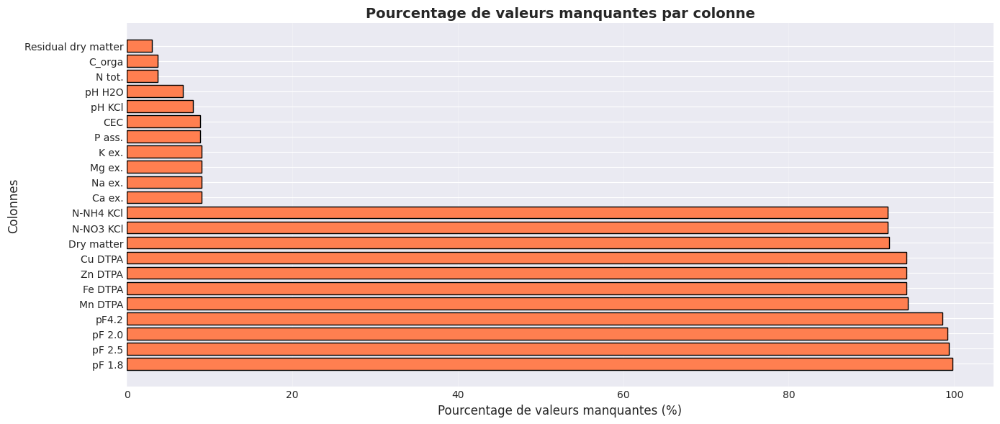

In [62]:
# Analyse des valeurs manquantes
print("=" * 80)
print("> ANALYSE DES VALEURS MANQUANTES")
print("=" * 80)

missing_data = pd.DataFrame({
    'Colonne': df.columns,
    'Valeurs manquantes': df.isna().sum(),
    'Pourcentage (%)': (df.isna().sum() / len(df) * 100).round(2)
})
missing_data = missing_data[missing_data['Valeurs manquantes'] > 0].sort_values('Pourcentage (%)', ascending=False)

if len(missing_data) > 0:
    display(missing_data)

    # Visualisation des valeurs manquantes
    plt.figure(figsize=(14, 6))
    plt.barh(missing_data['Colonne'], missing_data['Pourcentage (%)'], color='coral', edgecolor='black')
    plt.xlabel('Pourcentage de valeurs manquantes (%)', fontsize=12)
    plt.ylabel('Colonnes', fontsize=12)
    plt.title('Pourcentage de valeurs manquantes par colonne', fontsize=14, fontweight='bold')
    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("Aucune valeur manquante détectée")

> VISUALISATION SPATIALE AVEC FOND DE CARTE
> Coordonnées de La Réunion (UTM Zone 40S)


KeyboardInterrupt: 

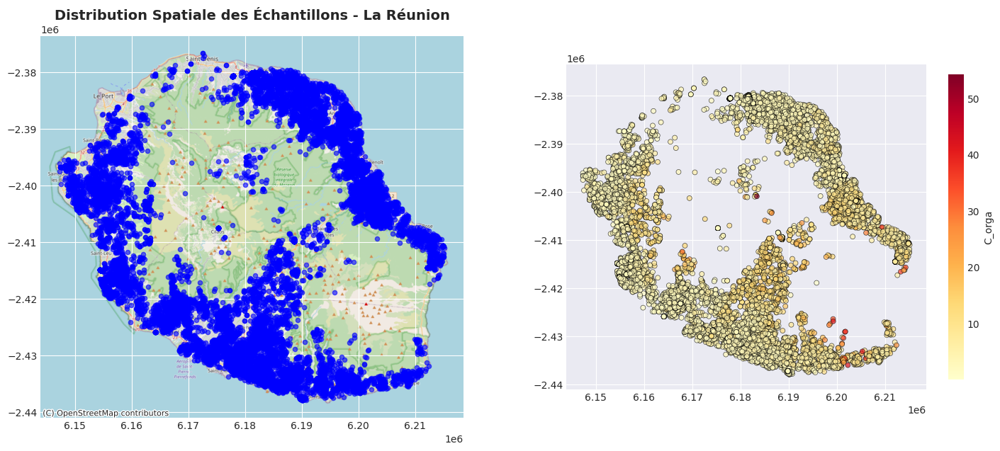

In [63]:
# Visualisation spatiale avec fond de carte géographique
print("=" * 80)
print("> VISUALISATION SPATIALE AVEC FOND DE CARTE")
print("=" * 80)

if all(col in df.columns for col in ['LONGITUDE', 'LATITUDE', 'C_orga']):
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    # Coordonnées de La Réunion - UTM Zone 40S (EPSG:32740)
    from geopandas import GeoDataFrame, points_from_xy

    print(f"> Coordonnées de La Réunion (UTM Zone 40S)")
    gdf_viz = GeoDataFrame(
        df,
        geometry=points_from_xy(df['LONGITUDE'], df['LATITUDE']),
        crs='EPSG:32740'  # UTM Zone 40S pour La Réunion
    )

    # Reprojeter en Web Mercator pour contextily
    gdf_viz = gdf_viz.to_crs(epsg=3857)

    # Carte 1 : Distribution spatiale des points avec fond de carte
    gdf_viz.plot(ax=axes[0], alpha=0.6, markersize=20, color='blue')
    ctx.add_basemap(axes[0], source=ctx.providers.OpenStreetMap.Mapnik)
    axes[0].set_title('Distribution Spatiale des Échantillons - La Réunion', fontsize=14, fontweight='bold')

    # Carte 2 : Distribution spatiale de C_orga avec fond de carte
    gdf_viz.plot(column='C_orga', ax=axes[1], cmap='YlOrRd',
                 markersize=25, alpha=0.7, edgecolor='black', linewidth=0.5,
                 legend=True, legend_kwds={'label': 'C_orga', 'shrink': 0.8})
    ctx.add_basemap(axes[1], source=ctx.providers.OpenStreetMap.Mapnik)
    axes[1].set_title('Distribution Spatiale de C_orga - La Réunion', fontsize=14, fontweight='bold')

    plt.tight_layout()
    plt.show()

    print(f"Plage X (UTM) : [{df['LONGITUDE'].min():.2f}, {df['LONGITUDE'].max():.2f}]")
    print(f"Plage Y (UTM) : [{df['LATITUDE'].min():.2f}, {df['LATITUDE'].max():.2f}]")
    print(f"CRS: UTM Zone 40S (EPSG:32740) - La Réunion")
else:
    print("! Colonnes LONGITUDE, LATITUDE ou C_orga manquantes")

## Phase 2 : Feature Selection and Curation

**Contrainte importante :** Seules 5 features sont autorisées pour la prédiction :
- LONGITUDE, LATITUDE, ALTITUDE (variables spatiales)
- YEAR (variable temporelle)
- SOIL (variable catégorielle)

In [ ]:
# Colonnes autorisées pour la prédiction (CONTRAINTE DU PROJET)
columns_to_keep = [
    'C_orga',      # Variable cible
    'LONGITUDE',   # Coordonnée X
    'LATITUDE',    # Coordonnée Y
    'ALTITUDE',    # Élévation
    'YEAR',        # Année
    'SOIL'         # Type de sol
]

print("=" * 80)
print("> NETTOYAGE DES DONNÉES")
print("=" * 80)
print(f"Colonnes initiales : {df.shape[1]}")

# Vérifier quelles colonnes existent vraiment dans le dataset
existing_cols_to_keep = [col for col in columns_to_keep if col in df.columns]

# Créer le dataframe nettoyé
df_clean = df[existing_cols_to_keep].copy()

print(f"\nColonnes après nettoyage : {df_clean.shape[1]}")
print(f"Dimensions finales : {df_clean.shape[0]} lignes × {df_clean.shape[1]} colonnes")
print(f"\nFeatures :")
for col in df_clean.columns:
    if col != 'C_orga':
        print(f"   - {col}")

> NETTOYAGE DES DONNÉES
Colonnes initiales : 29

Colonnes après nettoyage : 6
Dimensions finales : 24442 lignes × 6 colonnes

Features :
   - LONGITUDE
   - LATITUDE
   - ALTITUDE
   - YEAR
   - SOIL


In [ ]:
# Gestion des valeurs manquantes dans le dataset nettoyé
print("=" * 80)
print("> GESTION DES VALEURS MANQUANTES")
print("=" * 80)

# Analyse des valeurs manquantes
missing_summary = pd.DataFrame({
    'Colonne': df_clean.columns,
    'Valeurs manquantes': df_clean.isna().sum(),
    'Pourcentage (%)': (df_clean.isna().sum() / len(df_clean) * 100).round(2)
})
missing_summary = missing_summary[missing_summary['Valeurs manquantes'] > 0].sort_values('Pourcentage (%)', ascending=False)

if len(missing_summary) > 0:
    print("Valeurs manquantes détectées :")
    display(missing_summary)

    # Stratégie : Supprimer les lignes avec des valeurs manquantes dans C_orga (variable cible)
    if df_clean['C_orga'].isna().sum() > 0:
        rows_before = len(df_clean)
        df_clean = df_clean.dropna(subset=['C_orga'])
        print(f"\n> {rows_before - len(df_clean)} lignes supprimées (C_orga manquant)")

    # Pour les autres colonnes : imputation par la médiane (variables numériques)
    from sklearn.impute import SimpleImputer

    numeric_cols = df_clean.select_dtypes(include=[np.number]).columns.tolist()
    numeric_cols.remove('C_orga')  # Ne pas imputer la cible

    if len(numeric_cols) > 0 and df_clean[numeric_cols].isna().sum().sum() > 0:
        imputer = SimpleImputer(strategy='median')
        df_clean[numeric_cols] = imputer.fit_transform(df_clean[numeric_cols])
        print(f"Imputation par la médiane appliquée sur {len(numeric_cols)} colonnes numériques")

    # Pour la colonne catégorielle SOIL : imputation par le mode
    if 'SOIL' in df_clean.columns and df_clean['SOIL'].isna().sum() > 0:
        mode_value = df_clean['SOIL'].mode()[0]
        df_clean['SOIL'].fillna(mode_value, inplace=True)
        print(f"Imputation par le mode appliquée sur SOIL : '{mode_value}'")
else:
    print("Aucune valeur manquante détectée")

print(f"\n> Dimensions finales après gestion des NA : {df_clean.shape[0]} lignes × {df_clean.shape[1]} colonnes")

> GESTION DES VALEURS MANQUANTES
Valeurs manquantes détectées :


,Colonne,Valeurs manquantes,Pourcentage (%)
C_orga,C_orga,924,3.78



> 924 lignes supprimées (C_orga manquant)

> Dimensions finales après gestion des NA : 23518 lignes × 6 colonnes


> ENCODAGE DE LA VARIABLE CATÉGORIELLE : SOIL
Types de sols présents :


SOIL
Andosols                          6429
Nitisols and Ferralsols           4698
Andic Cambisols                   4203
Hydric Andosols                   4197
Cambisols                         3875
Vertisols and Vertic Cambisols     116
Name: count, dtype: int64

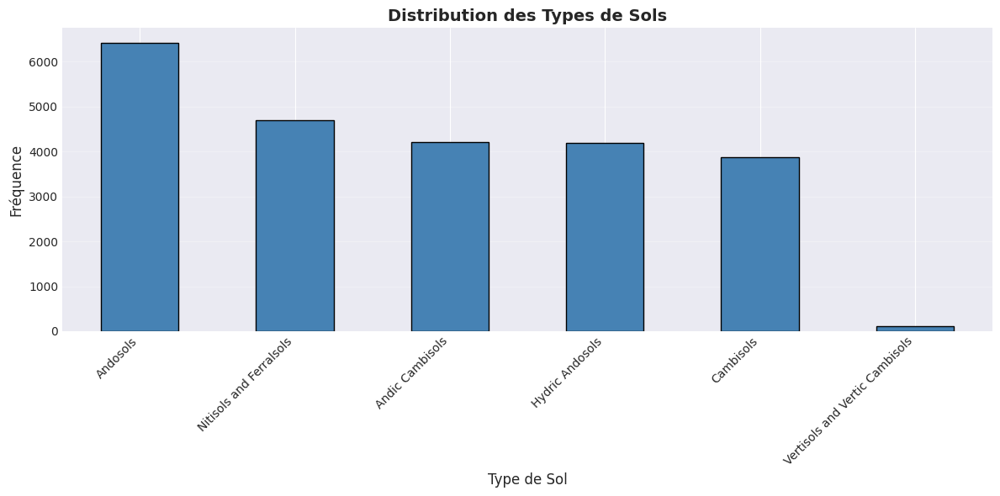


One-Hot Encoding appliqué
   Nombre de colonnes avant : 6
   Nombre de colonnes après : 11
   Colonnes SOIL créées : 6

> Dimensions finales : 23518 lignes × 11 colonnes


In [ ]:
# Encodage de la variable catégorielle SOIL
print("=" * 80)
print("> ENCODAGE DE LA VARIABLE CATÉGORIELLE : SOIL")
print("=" * 80)

if 'SOIL' in df_clean.columns:
    # Analyse de la variable SOIL
    print("Types de sols présents :")
    soil_counts = df_clean['SOIL'].value_counts()
    display(soil_counts)

    # Visualisation
    plt.figure(figsize=(12, 6))
    soil_counts.plot(kind='bar', color='steelblue', edgecolor='black')
    plt.xlabel('Type de Sol', fontsize=12)
    plt.ylabel('Fréquence', fontsize=12)
    plt.title('Distribution des Types de Sols', fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Encodage One-Hot (préféré pour les modèles linéaires et gradient boosting)
    df_encoded = pd.get_dummies(df_clean, columns=['SOIL'], prefix='SOIL', drop_first=False)

    print(f"\nOne-Hot Encoding appliqué")
    print(f"   Nombre de colonnes avant : {df_clean.shape[1]}")
    print(f"   Nombre de colonnes après : {df_encoded.shape[1]}")
    print(f"   Colonnes SOIL créées : {df_encoded.shape[1] - df_clean.shape[1] + 1}")

    # Sauvegarder le dataframe encodé
    df_processed = df_encoded.copy()
else:
    print("! Colonne SOIL non trouvée")
    df_processed = df_clean.copy()

print(f"\n> Dimensions finales : {df_processed.shape[0]} lignes × {df_processed.shape[1]} colonnes")

> MATRICE DE CORRÉLATION


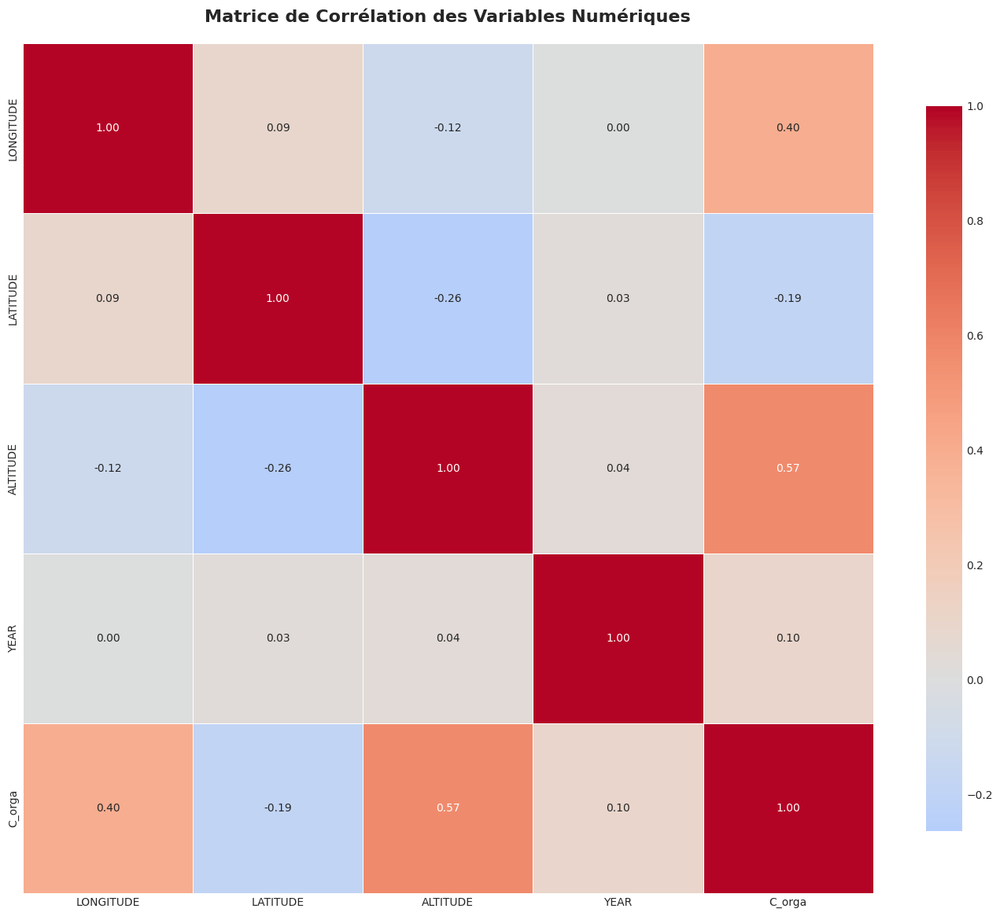


> Corrélations avec la variable cible (C_orga) :


C_orga       1.000000
ALTITUDE     0.572996
LONGITUDE    0.396047
YEAR         0.096877
LATITUDE    -0.185730
Name: C_orga, dtype: float64


> Variables les plus corrélées avec C_orga (|r| > 0.5) :
   ALTITUDE: 0.573


In [ ]:
# Matrice de corrélation
print("=" * 80)
print("> MATRICE DE CORRÉLATION")
print("=" * 80)

# Sélectionner uniquement les colonnes numériques (exclure les colonnes SOIL encodées pour la lisibilité)
numeric_features = ['LONGITUDE', 'LATITUDE', 'ALTITUDE', 'YEAR', 'C_orga']
numeric_features = [col for col in numeric_features if col in df_processed.columns]

# Calculer la corrélation
corr_matrix = df_processed[numeric_features].corr()

# Visualisation
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm',
            center=0, square=True, linewidths=0.5,
            cbar_kws={"shrink": 0.8})
plt.title('Matrice de Corrélation des Variables Numériques', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Corrélations avec C_orga
print("\n> Corrélations avec la variable cible (C_orga) :")
corr_with_target = corr_matrix['C_orga'].sort_values(ascending=False)
display(corr_with_target)

print("\n> Variables les plus corrélées avec C_orga (|r| > 0.5) :")
strong_corr = corr_with_target[abs(corr_with_target) > 0.5]
for var, corr in strong_corr.items():
    if var != 'C_orga':
        print(f"   {var}: {corr:.3f}")

## Phase 3 : Préparation pour la Modélisation

### Train-Test Split avec Considérations Spatiales

In [ ]:
# Séparation des features et de la cible
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler

print("=" * 80)
print("> TRAIN-TEST SPLIT ET CV SETUP")
print("=" * 80)

# Séparer X (features) et y (cible)
X = df_processed.drop('C_orga', axis=1)
y = df_processed['C_orga']

print(f"Dimensions de X : {X.shape}")
print(f"Dimensions de y : {y.shape}")

# Split 80/20 avec stratification spatiale (par quartiles de latitude)
# Cela permet d'assurer une distribution géographique équilibrée
if 'LATITUDE' in X.columns:
    # Créer des bins de latitude pour la stratification
    lat_bins = pd.qcut(X['LATITUDE'], q=5, labels=False, duplicates='drop')

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=lat_bins
    )
    print("Split avec stratification spatiale (quartiles de latitude)")
else:
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )
    print("Split aléatoire standard")

print(f"\nTrain set : {X_train.shape[0]} échantillons ({X_train.shape[0]/len(X)*100:.1f}%)")
print(f"Test set  : {X_test.shape[0]} échantillons ({X_test.shape[0]/len(X)*100:.1f}%)")

# Statistiques de la cible dans train/test
print(f"\nStatistiques de C_orga :")
print(f"  Train - Moyenne: {y_train.mean():.3f}, Std: {y_train.std():.3f}")
print(f"  Test  - Moyenne: {y_test.mean():.3f}, Std: {y_test.std():.3f}")

# Configuration de la validation croisée pour les prédictions out-of-fold (OOF)
print(f"\n{'='*80}")
print(f"> CONFIGURATION DU K-FOLD POUR LES PRÉDICTIONS OOF")
print(f"{'='*80}")
n_folds = 5
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)
print(f"K-Fold configuré : {n_folds} folds")
print(f"   Les modèles génèreront des prédictions out-of-fold pour le stacking")

# Initialiser les arrays pour stocker les prédictions out-of-fold
oof_preds_lr = np.zeros(len(X_train))
oof_preds_rf = np.zeros(len(X_train))
oof_preds_xgb = np.zeros(len(X_train))
oof_preds_lgb = np.zeros(len(X_train))
oof_preds_catboost = np.zeros(len(X_train))
oof_preds_tabpfn = np.zeros(len(X_train))
oof_preds_gnn = np.zeros(len(X_train))

# Arrays pour les prédictions test (moyenne des prédictions sur chaque fold)
test_preds_lr = np.zeros(len(X_test))
test_preds_rf = np.zeros(len(X_test))
test_preds_xgb = np.zeros(len(X_test))
test_preds_lgb = np.zeros(len(X_test))
test_preds_catboost = np.zeros(len(X_test))
test_preds_tabpfn = np.zeros(len(X_test))
test_preds_gnn = np.zeros(len(X_test))

print(f"\nArrays OOF initialisés pour 7 modèles de base")


> TRAIN-TEST SPLIT ET CV SETUP
Dimensions de X : (23518, 10)
Dimensions de y : (23518,)
Split avec stratification spatiale (quartiles de latitude)

Train set : 18814 échantillons (80.0%)
Test set  : 4704 échantillons (20.0%)

Statistiques de C_orga :
Dimensions de X : (23518, 10)
Dimensions de y : (23518,)
Split avec stratification spatiale (quartiles de latitude)

Train set : 18814 échantillons (80.0%)
Test set  : 4704 échantillons (20.0%)

Statistiques de C_orga :
  Train - Moyenne: 4.576, Std: 3.791
  Test  - Moyenne: 4.610, Std: 3.836

> CONFIGURATION DU K-FOLD POUR LES PRÉDICTIONS OOF
K-Fold configuré : 5 folds
   Les modèles génèreront des prédictions out-of-fold pour le stacking

Arrays OOF initialisés pour 7 modèles de base


### Approche de Stacking avec Out-of-Fold (OOF) Predictions

**Workflow:**
1. Split train/test (80/20)
2. Pour chaque modèle de base:
   - Entraîner avec 5-fold CV
   - Générer prédictions OOF (covering all train data)
   - Générer prédictions test (moyenne des 5 folds)
3. Meta-learner:
   - Utilise OOF predictions comme X_train_meta
   - Utilise test predictions comme X_test_meta
   - S'entraîne sur des prédictions jamais vues par les base models

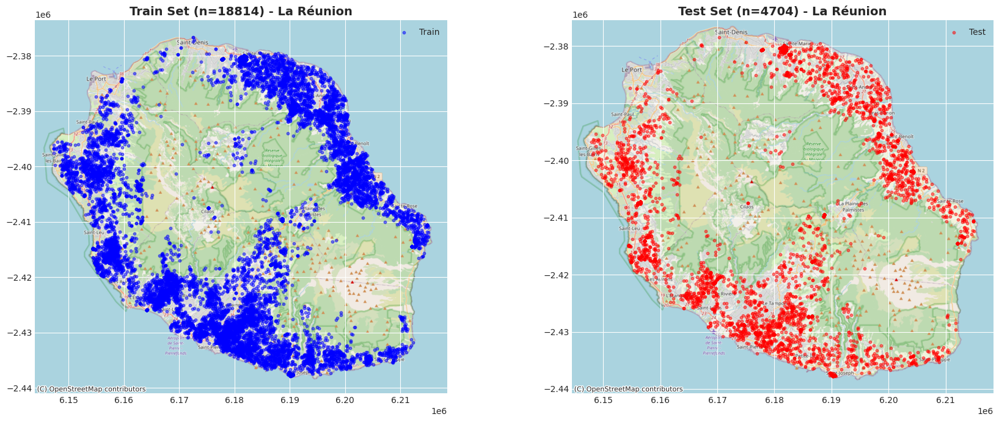

In [ ]:
# Visualisation de la distribution spatiale train/test avec fond de carte
if all(col in X.columns for col in ['LONGITUDE', 'LATITUDE']):
    from geopandas import GeoDataFrame, points_from_xy

    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    # Créer GeoDataFrames pour train et test
    gdf_train = GeoDataFrame(
        X_train,
        geometry=points_from_xy(X_train['LONGITUDE'], X_train['LATITUDE']),
        crs='EPSG:32740'  # UTM Zone 40S pour La Réunion
    ).to_crs(epsg=3857)

    gdf_test = GeoDataFrame(
        X_test,
        geometry=points_from_xy(X_test['LONGITUDE'], X_test['LATITUDE']),
        crs='EPSG:32740'  # UTM Zone 40S pour La Réunion
    ).to_crs(epsg=3857)

    # Train set
    gdf_train.plot(ax=axes[0], alpha=0.5, markersize=10, color='blue', label='Train')
    ctx.add_basemap(axes[0], source=ctx.providers.OpenStreetMap.Mapnik)
    axes[0].set_title(f'Train Set (n={len(X_train)}) - La Réunion', fontsize=14, fontweight='bold')
    axes[0].legend()

    # Test set
    gdf_test.plot(ax=axes[1], alpha=0.5, markersize=10, color='red', label='Test')
    ctx.add_basemap(axes[1], source=ctx.providers.OpenStreetMap.Mapnik)
    axes[1].set_title(f'Test Set (n={len(X_test)}) - La Réunion', fontsize=14, fontweight='bold')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

📏 NORMALISATION DES FEATURES
StandardScaler appliqué
   Moyenne des features (train) : 0.000000
   Écart-type des features (train) : 1.000027


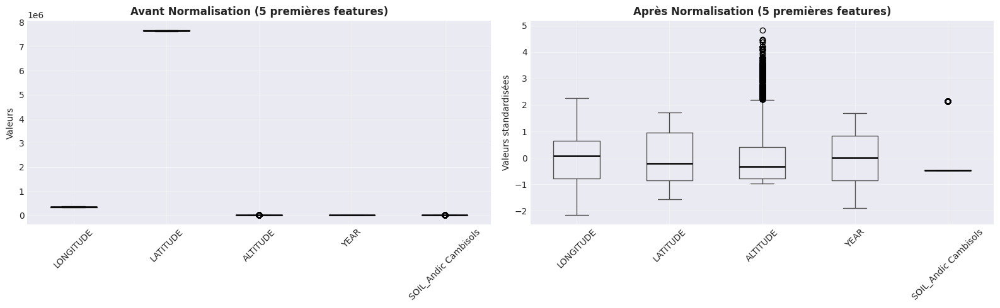


Données prêtes pour la modélisation !


In [ ]:
# Normalisation des features
print("=" * 80)
print("📏 NORMALISATION DES FEATURES")
print("=" * 80)

# Utiliser StandardScaler pour normaliser les features
scaler = StandardScaler()

# Fit sur train, transform sur train et test (éviter le data leakage)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reconvertir en DataFrame pour conserver les noms de colonnes
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)

print(f"StandardScaler appliqué")
print(f"   Moyenne des features (train) : {X_train_scaled.mean().mean():.6f}")
print(f"   Écart-type des features (train) : {X_train_scaled.std().mean():.6f}")

# Vérification visuelle de la normalisation
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Avant normalisation
X_train.iloc[:, :5].boxplot(ax=axes[0],
    medianprops=dict(color="black", linewidth=1.8),
    whiskerprops=dict(color="0.3"),
    capprops=dict(color="0.3"),
    boxprops=dict(color="0.3"),
)
axes[0].set_title('Avant Normalisation (5 premières features)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Valeurs')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(alpha=0.3)

# Après normalisation
X_train_scaled.iloc[:, :5].boxplot(ax=axes[1],
    medianprops=dict(color="black", linewidth=1.8),
    whiskerprops=dict(color="0.3"),
    capprops=dict(color="0.3"),
    boxprops=dict(color="0.3"),
)
axes[1].set_title('Après Normalisation (5 premières features)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Valeurs standardisées')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\nDonnées prêtes pour la modélisation !")

In [ ]:
if STOP_AFTER_DATA_PREPARATION:
    try:
        assert False
    except AssertionError:
        print("DATA PREPARATION DONE, DOING A PAUSE.")


## Phase 4 : Modèles de Baseline

### Modèle 1 : Régression Linéaire


In [ ]:
# Import des métriques et modèles
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
import time

# Fonction pour évaluer les modèles
def evaluate_model(y_true, y_pred, model_name):
    """
    Calcule et affiche les métriques de performance d'un modèle
    """
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100

    print(f"\n{'='*80}")
    print(f"> RÉSULTATS : {model_name}")
    print(f"{'='*80}")
    print(f"  RMSE : {rmse:.4f}")
    print(f"  MAE  : {mae:.4f}")
    print(f"  R²   : {r2:.4f}")
    print(f"  MAPE : {mape:.2f}%")

    return {'RMSE': rmse, 'MAE': mae, 'R²': r2, 'MAPE': mape}

# Dictionnaire pour stocker les résultats
results = {}

print("=" * 80)
print("MODÈLE 1 : RÉGRESSION LINÉAIRE (avec CV pour OOF)")
print("=" * 80)

# Define checkpoint paths
lr_checkpoint = CHECKPOINT_DIR / 'linear_regression.pkl'
lr_oof_checkpoint = CHECKPOINT_DIR / 'linear_regression_oof.npz'

# Try to load from checkpoint
if lr_checkpoint.exists() and lr_oof_checkpoint.exists():
    print("\n📁 Loading Linear Regression from checkpoint...")

    # Load model and scaler
    with open(lr_checkpoint, 'rb') as f:
        checkpoint_data = pickle.load(f)
    lr_model = checkpoint_data['model']
    scaler = checkpoint_data['scaler']
    train_time = checkpoint_data['train_time']

    # Load predictions
    oof_data = np.load(lr_oof_checkpoint)
    oof_preds_lr = oof_data['oof_preds']
    test_preds_lr = oof_data['test_preds']

    # Regenerate scaled data
    X_train_scaled = pd.DataFrame(
        scaler.transform(X_train),
        columns=X_train.columns,
        index=X_train.index
    )
    X_test_scaled = pd.DataFrame(
        scaler.transform(X_test),
        columns=X_test.columns,
        index=X_test.index
    )

    # Prédictions finales
    y_pred_train_lr = lr_model.predict(X_train_scaled)
    y_pred_test_lr = lr_model.predict(X_test_scaled)

    print("✓ Linear Regression loaded successfully from checkpoint")

else:
    print("\n🔨 Training Linear Regression from scratch...")

    # Entraînement avec K-Fold CV pour générer les prédictions out-of-fold
    start_time = time.time()

    for fold, (train_idx, val_idx) in enumerate(kf.split(X_train), 1):
        print(f"\n> Fold {fold}/{n_folds}")

        # Diviser les données
        X_fold_train = X_train.iloc[train_idx]
        X_fold_val = X_train.iloc[val_idx]
        y_fold_train = y_train.iloc[train_idx]
        y_fold_val = y_train.iloc[val_idx]

        # Normalisation sur le fold
        scaler_fold = StandardScaler()
        X_fold_train_scaled = pd.DataFrame(
            scaler_fold.fit_transform(X_fold_train),
            columns=X_fold_train.columns,
            index=X_fold_train.index
        )
        X_fold_val_scaled = pd.DataFrame(
            scaler_fold.transform(X_fold_val),
            columns=X_fold_val.columns,
            index=X_fold_val.index
        )

        # Entraîner sur le fold
        lr_fold = LinearRegression()
        lr_fold.fit(X_fold_train_scaled, y_fold_train)

        # Prédictions sur validation fold (out-of-fold)
        oof_preds_lr[val_idx] = lr_fold.predict(X_fold_val_scaled)

        # Normaliser test set avec ce fold et prédire
        X_test_fold_scaled = pd.DataFrame(
            scaler_fold.transform(X_test),
            columns=X_test.columns,
            index=X_test.index
        )
        test_preds_lr += lr_fold.predict(X_test_fold_scaled) / n_folds

    train_time = time.time() - start_time

    # Entraîner le modèle final sur tout le train set
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(
        scaler.fit_transform(X_train),
        columns=X_train.columns,
        index=X_train.index
    )
    X_test_scaled = pd.DataFrame(
        scaler.transform(X_test),
        columns=X_test.columns,
        index=X_test.index
    )

    lr_model = LinearRegression()
    lr_model.fit(X_train_scaled, y_train)

    # Prédictions finales
    y_pred_train_lr = lr_model.predict(X_train_scaled)
    y_pred_test_lr = lr_model.predict(X_test_scaled)

    # Save checkpoint
    print("\n> Saving Linear Regression checkpoint...")
    with open(lr_checkpoint, 'wb') as f:
        pickle.dump({
            'model': lr_model,
            'scaler': scaler,
            'train_time': train_time
        }, f)

    np.savez(lr_oof_checkpoint,
             oof_preds=oof_preds_lr,
             test_preds=test_preds_lr)

    print("✓ Checkpoint saved successfully")

# Évaluation
print(f"\n>Temps d'entraînement (CV + final) : {train_time:.2f} secondes")
print("\n> Performance sur le Train Set (OOF) :")
results['Linear Regression (OOF)'] = evaluate_model(y_train, oof_preds_lr, "Linear Regression - OOF")

print("\n> Performance sur le Train Set (full fit) :")
results['Linear Regression (Train)'] = evaluate_model(y_train, y_pred_train_lr, "Linear Regression - Train")

print("\n>Performance sur le Test Set :")
results['Linear Regression (Test)'] = evaluate_model(y_test, y_pred_test_lr, "Linear Regression - Test")

print(f"\nPrédictions OOF sauvegardées pour le stacking")


MODÈLE 1 : RÉGRESSION LINÉAIRE (avec CV pour OOF)

📁 Loading Linear Regression from checkpoint...
✓ Linear Regression loaded successfully from checkpoint

>Temps d'entraînement (CV + final) : 0.07 secondes

> Performance sur le Train Set (OOF) :

> RÉSULTATS : Linear Regression - OOF
  RMSE : 2.4339
  MAE  : 1.6154
  R²   : 0.5879
  MAPE : 53.18%

> Performance sur le Train Set (full fit) :

> RÉSULTATS : Linear Regression - Train
  RMSE : 2.4315
  MAE  : 1.6143
  R²   : 0.5887
  MAPE : 53.17%

>Performance sur le Test Set :

> RÉSULTATS : Linear Regression - Test
  RMSE : 2.4512
  MAE  : 1.6081
  R²   : 0.5917
  MAPE : 60.94%

Prédictions OOF sauvegardées pour le stacking


> ANALYSE DES COEFFICIENTS

Top 10 features les plus influentes :


,Feature,Coefficient,Abs_Coefficient
2,ALTITUDE,2.243673,2.243673
0,LONGITUDE,1.828199,1.828199
8,SOIL_Nitisols and Ferralsols,-0.517000,0.517000
6,SOIL_Cambisols,0.349124,0.349124
3,YEAR,0.241617,0.241617
5,SOIL_Andosols,0.188516,0.188516
9,SOIL_Vertisols and Vertic Cambisols,0.178462,0.178462
4,SOIL_Andic Cambisols,-0.161310,0.161310
1,LATITUDE,0.117733,0.117733
7,SOIL_Hydric Andosols,0.112234,0.112234


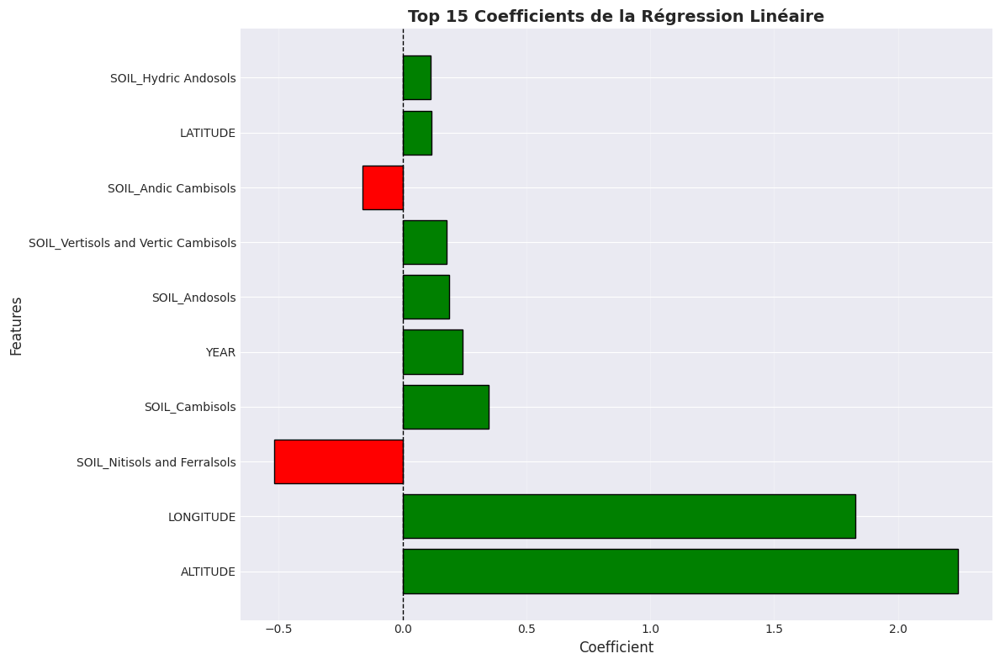


Intercept : 4.5765


In [ ]:
# Analyse des coefficients de la régression linéaire
print("=" * 80)
print("> ANALYSE DES COEFFICIENTS")
print("=" * 80)

# Créer un DataFrame avec les coefficients
coef_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': lr_model.coef_
})
coef_df['Abs_Coefficient'] = np.abs(coef_df['Coefficient'])
coef_df = coef_df.sort_values('Abs_Coefficient', ascending=False)

print("\nTop 10 features les plus influentes :")
display(coef_df.head(10))

# Visualisation
plt.figure(figsize=(12, 8))
top_features = coef_df.head(15)
colors = ['green' if x > 0 else 'red' for x in top_features['Coefficient']]
plt.barh(top_features['Feature'], top_features['Coefficient'], color=colors, edgecolor='black')
plt.xlabel('Coefficient', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.title('Top 15 Coefficients de la Régression Linéaire', fontsize=14, fontweight='bold')
plt.axvline(x=0, color='black', linestyle='--', linewidth=1)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\nIntercept : {lr_model.intercept_:.4f}")

### Modèle 2 : Random Forest

Modèle non-linéaire pour capturer des relations complexes.

In [ ]:
# Random Forest avec hyperparameter tuning via Optuna
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

print("=" * 80)
print("MODÈLE 2 : RANDOM FOREST (Optimisation avec Optuna + CV pour OOF)")
print("=" * 80)

# Define checkpoint paths
rf_checkpoint = CHECKPOINT_DIR / 'random_forest.pkl'
rf_oof_checkpoint = CHECKPOINT_DIR / 'random_forest_oof.npz'
rf_study_checkpoint = CHECKPOINT_DIR / 'random_forest_study.pkl'

# Try to load from checkpoint
if rf_checkpoint.exists() and rf_oof_checkpoint.exists():
    print("\n📁 Loading Random Forest from checkpoint...")

    # Load model and study
    with open(rf_checkpoint, 'rb') as f:
        checkpoint_data = pickle.load(f)
    rf_model = checkpoint_data['model']
    train_time = checkpoint_data['train_time']
    optim_time = checkpoint_data.get('optim_time', 0)

    # Load study if exists
    if rf_study_checkpoint.exists():
        with open(rf_study_checkpoint, 'rb') as f:
            study_rf = pickle.load(f)

    # Load predictions
    oof_data = np.load(rf_oof_checkpoint)
    oof_preds_rf = oof_data['oof_preds']
    test_preds_rf = oof_data['test_preds']

    # Prédictions finales
    y_pred_train_rf = rf_model.predict(X_train_scaled)
    y_pred_test_rf = rf_model.predict(X_test_scaled)

    print("✓ Random Forest loaded successfully from checkpoint")
    print(f"   Optim time: {optim_time:.2f}s, Train time: {train_time:.2f}s")

else:
    print("\n🔨 Training Random Forest from scratch...")

    # Fonction objectif pour Optuna
    def objective_rf(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', RF_N_ESTIMATORS_MIN, RF_N_ESTIMATORS_MAX),
            'max_depth': trial.suggest_int('max_depth', 5, 30),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
            'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
            'random_state': 42,
            'n_jobs': -1
        }

        rf = RandomForestRegressor(**params)
        score = cross_val_score(rf, X_train_scaled, y_train, cv=CV_FOLDS,
                               scoring='neg_root_mean_squared_error', n_jobs=-1)
        return score.mean()

    # Optimisation avec Optuna
    print("\n> Recherche des meilleurs hyperparamètres avec Optuna...")
    print(f"   Nombre d'essais: {N_TRIALS_OPTUNA}, CV folds: {CV_FOLDS}")
    start_time = time.time()
    study_rf = optuna.create_study(direction='maximize', study_name='random_forest')
    study_rf.optimize(objective_rf, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)
    optim_time = time.time() - start_time

    print(f"\n>Temps d'optimisation : {optim_time:.2f} secondes")
    print(f"\nMeilleurs hyperparamètres trouvés :")
    for param, value in study_rf.best_params.items():
        print(f"   {param}: {value}")
    print(f"\n> Meilleur score (RMSE négatif) : {study_rf.best_value:.4f}")

    # Entraînement avec K-Fold CV pour générer les prédictions out-of-fold
    print(f"\n> Génération des prédictions OOF avec K-Fold CV...")
    start_time = time.time()

    for fold, (train_idx, val_idx) in enumerate(kf.split(X_train), 1):
        print(f"   Fold {fold}/{n_folds}")

        # Entraîner sur le fold
        rf_fold = RandomForestRegressor(**study_rf.best_params, random_state=42, n_jobs=-1)
        rf_fold.fit(X_train_scaled.iloc[train_idx], y_train.iloc[train_idx])

        # Prédictions sur validation fold (out-of-fold)
        oof_preds_rf[val_idx] = rf_fold.predict(X_train_scaled.iloc[val_idx])

        # Prédire sur test set
        test_preds_rf += rf_fold.predict(X_test_scaled) / n_folds

    train_time = time.time() - start_time

    # Entraîner le modèle final sur tout le train set
    rf_model = RandomForestRegressor(**study_rf.best_params, random_state=42, n_jobs=-1)
    rf_model.fit(X_train_scaled, y_train)

    # Prédictions finales
    y_pred_train_rf = rf_model.predict(X_train_scaled)
    y_pred_test_rf = rf_model.predict(X_test_scaled)

    # Save checkpoint
    print("\n> Saving Random Forest checkpoint...")
    with open(rf_checkpoint, 'wb') as f:
        pickle.dump({
            'model': rf_model,
            'train_time': train_time,
            'optim_time': optim_time
        }, f)

    with open(rf_study_checkpoint, 'wb') as f:
        pickle.dump(study_rf, f)

    np.savez(rf_oof_checkpoint,
             oof_preds=oof_preds_rf,
             test_preds=test_preds_rf)

    print("✓ Checkpoint saved successfully")

# Évaluation
print(f"\n>Temps d'entraînement CV : {train_time:.2f} secondes")
print("\n> Performance sur le Train Set (OOF) :")
results['Random Forest (OOF)'] = evaluate_model(y_train, oof_preds_rf, "Random Forest - OOF")

print("\n> Performance sur le Train Set (full fit) :")
results['Random Forest (Train)'] = evaluate_model(y_train, y_pred_train_rf, "Random Forest - Train")

print("\n>Performance sur le Test Set :")
results['Random Forest (Test)'] = evaluate_model(y_test, y_pred_test_rf, "Random Forest - Test")

print(f"\nPrédictions OOF sauvegardées pour le stacking")


MODÈLE 2 : RANDOM FOREST (Optimisation avec Optuna + CV pour OOF)

📁 Loading Random Forest from checkpoint...
✓ Random Forest loaded successfully from checkpoint
   Optim time: 271.55s, Train time: 8.32s

>Temps d'entraînement CV : 8.32 secondes

> Performance sur le Train Set (OOF) :

> RÉSULTATS : Random Forest - OOF
  RMSE : 1.7157
  MAE  : 0.9993
  R²   : 0.7952
  MAPE : 31.17%

> Performance sur le Train Set (full fit) :

> RÉSULTATS : Random Forest - Train
  RMSE : 1.1746
  MAE  : 0.7236
  R²   : 0.9040
  MAPE : 23.93%

>Performance sur le Test Set :

> RÉSULTATS : Random Forest - Test
  RMSE : 1.7437
  MAE  : 0.9998
  R²   : 0.7934
  MAPE : 32.24%

Prédictions OOF sauvegardées pour le stacking


> FEATURE IMPORTANCE - RANDOM FOREST

Top 15 features les plus importantes :


,Feature,Importance
2,ALTITUDE,0.339427
0,LONGITUDE,0.292766
1,LATITUDE,0.170116
7,SOIL_Hydric Andosols,0.065633
3,YEAR,0.042597
5,SOIL_Andosols,0.039173
8,SOIL_Nitisols and Ferralsols,0.029203
6,SOIL_Cambisols,0.012916
4,SOIL_Andic Cambisols,0.008029
9,SOIL_Vertisols and Vertic Cambisols,0.000140


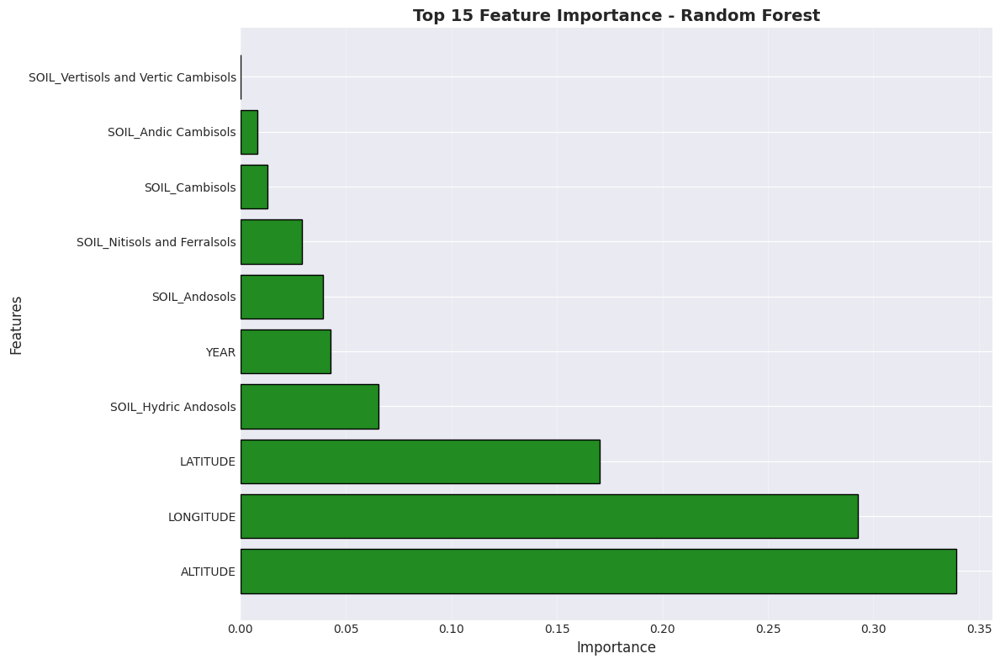

In [ ]:
# Feature Importance - Random Forest
print("=" * 80)
print("> FEATURE IMPORTANCE - RANDOM FOREST")
print("=" * 80)

# Extraire les importances
importances_rf = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': rf_model.feature_importances_
})
importances_rf = importances_rf.sort_values('Importance', ascending=False)

print("\nTop 15 features les plus importantes :")
display(importances_rf.head(15))

# Visualisation
plt.figure(figsize=(12, 8))
top_features_rf = importances_rf.head(15)
plt.barh(top_features_rf['Feature'], top_features_rf['Importance'],
         color='forestgreen', edgecolor='black')
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.title('Top 15 Feature Importance - Random Forest', fontsize=14, fontweight='bold')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

## Phase 5 : Modèles Avancés (Gradient Boosting)

### Modèle 3 : XGBoost

In [ ]:
# XGBoost avec hyperparameter tuning via Optuna
print("=" * 80)
print("MODÈLE 3 : XGBOOST (Optimisation avec Optuna + CV pour OOF)")
print("=" * 80)

# Define checkpoint paths
xgb_checkpoint = CHECKPOINT_DIR / 'xgboost.pkl'
xgb_oof_checkpoint = CHECKPOINT_DIR / 'xgboost_oof.npz'
xgb_study_checkpoint = CHECKPOINT_DIR / 'xgboost_study.pkl'

# Try to load from checkpoint
if xgb_checkpoint.exists() and xgb_oof_checkpoint.exists():
    print("\n📁 Loading XGBoost from checkpoint...")

    # Load model and study
    with open(xgb_checkpoint, 'rb') as f:
        checkpoint_data = pickle.load(f)
    xgb_model = checkpoint_data['model']
    train_time = checkpoint_data['train_time']
    optim_time = checkpoint_data.get('optim_time', 0)

    # Load study if exists
    if xgb_study_checkpoint.exists():
        with open(xgb_study_checkpoint, 'rb') as f:
            study_xgb = pickle.load(f)

    # Load predictions
    oof_data = np.load(xgb_oof_checkpoint)
    oof_preds_xgb = oof_data['oof_preds']
    test_preds_xgb = oof_data['test_preds']

    # Prédictions finales
    y_pred_train_xgb = xgb_model.predict(X_train_scaled)
    y_pred_test_xgb = xgb_model.predict(X_test_scaled)

    print("✓ XGBoost loaded successfully from checkpoint")
    print(f"   Optim time: {optim_time:.2f}s, Train time: {train_time:.2f}s")

else:
    print("\n🔨 Training XGBoost from scratch...")

    # Fonction objectif pour Optuna
    def objective_xgb(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', XGB_N_ESTIMATORS_MIN, XGB_N_ESTIMATORS_MAX),
            'max_depth': trial.suggest_int('max_depth', 3, 15),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
            'gamma': trial.suggest_float('gamma', 0, 0.5),
            'random_state': 42,
            'n_jobs': -1,
            'tree_method': 'hist'
        }

        xgb_model = xgb.XGBRegressor(**params)
        score = cross_val_score(xgb_model, X_train_scaled, y_train, cv=CV_FOLDS,
                                scoring='neg_root_mean_squared_error', n_jobs=-1)
        return score.mean()

    # Optimisation avec Optuna
    print("\n> Recherche des meilleurs hyperparamètres avec Optuna...")
    print(f"   Nombre d'essais: {N_TRIALS_OPTUNA}, CV folds: {CV_FOLDS}")
    start_time = time.time()
    study_xgb = optuna.create_study(direction='maximize', study_name='xgboost')
    study_xgb.optimize(objective_xgb, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)
    optim_time = time.time() - start_time

    print(f"\n>Temps d'optimisation : {optim_time:.2f} secondes")
    print(f"\nMeilleurs hyperparamètres trouvés :")
    for param, value in study_xgb.best_params.items():
        print(f"   {param}: {value}")
    print(f"\n> Meilleur score (RMSE négatif) : {study_xgb.best_value:.4f}")

    # Entraînement avec K-Fold CV pour générer les prédictions out-of-fold
    print(f"\n> Génération des prédictions OOF avec K-Fold CV...")
    start_time = time.time()

    for fold, (train_idx, val_idx) in enumerate(kf.split(X_train), 1):
        print(f"   Fold {fold}/{n_folds}")

        # Entraîner sur le fold
        xgb_fold = xgb.XGBRegressor(**study_xgb.best_params, random_state=42, n_jobs=-1, tree_method='hist')
        xgb_fold.fit(X_train_scaled.iloc[train_idx], y_train.iloc[train_idx])

        # Prédictions sur validation fold (out-of-fold)
        oof_preds_xgb[val_idx] = xgb_fold.predict(X_train_scaled.iloc[val_idx])

        # Prédire sur test set
        test_preds_xgb += xgb_fold.predict(X_test_scaled) / n_folds

    train_time = time.time() - start_time

    # Entraîner le modèle final sur tout le train set
    xgb_model = xgb.XGBRegressor(**study_xgb.best_params, random_state=42, n_jobs=-1, tree_method='hist')
    xgb_model.fit(X_train_scaled, y_train)

    # Prédictions finales
    y_pred_train_xgb = xgb_model.predict(X_train_scaled)
    y_pred_test_xgb = xgb_model.predict(X_test_scaled)

    # Save checkpoint
    print("\n> Saving XGBoost checkpoint...")
    with open(xgb_checkpoint, 'wb') as f:
        pickle.dump({
            'model': xgb_model,
            'train_time': train_time,
            'optim_time': optim_time
        }, f)

    with open(xgb_study_checkpoint, 'wb') as f:
        pickle.dump(study_xgb, f)

    np.savez(xgb_oof_checkpoint,
             oof_preds=oof_preds_xgb,
             test_preds=test_preds_xgb)

    print("✓ Checkpoint saved successfully")

# Évaluation
print(f"\n>Temps d'entraînement CV : {train_time:.2f} secondes")
print("\n> Performance sur le Train Set (OOF) :")
results['XGBoost (OOF)'] = evaluate_model(y_train, oof_preds_xgb, "XGBoost - OOF")

print("\n> Performance sur le Train Set (full fit) :")
results['XGBoost (Train)'] = evaluate_model(y_train, y_pred_train_xgb, "XGBoost - Train")

print("\n>Performance sur le Test Set :")
results['XGBoost (Test)'] = evaluate_model(y_test, y_pred_test_xgb, "XGBoost - Test")

print(f"\nPrédictions OOF sauvegardées pour le stacking")
xgb_available = True


MODÈLE 3 : XGBOOST (Optimisation avec Optuna + CV pour OOF)

📁 Loading XGBoost from checkpoint...
✓ XGBoost loaded successfully from checkpoint
   Optim time: 153.30s, Train time: 3.27s

>Temps d'entraînement CV : 3.27 secondes

> Performance sur le Train Set (OOF) :

> RÉSULTATS : XGBoost - OOF
  RMSE : 1.7141
  MAE  : 1.0046
  R²   : 0.7956
  MAPE : 32.09%

> Performance sur le Train Set (full fit) :

> RÉSULTATS : XGBoost - Train
  RMSE : 1.2925
  MAE  : 0.8020
  R²   : 0.8838
  MAPE : 27.16%

>Performance sur le Test Set :

> RÉSULTATS : XGBoost - Test
  RMSE : 1.7583
  MAE  : 1.0077
  R²   : 0.7899
  MAPE : 33.52%

Prédictions OOF sauvegardées pour le stacking


> FEATURE IMPORTANCE - XGBOOST

Top 15 features les plus importantes :


,Feature,Importance
7,SOIL_Hydric Andosols,0.259658
5,SOIL_Andosols,0.243709
2,ALTITUDE,0.127656
8,SOIL_Nitisols and Ferralsols,0.108581
6,SOIL_Cambisols,0.094685
0,LONGITUDE,0.084592
1,LATITUDE,0.038436
4,SOIL_Andic Cambisols,0.023090
3,YEAR,0.014387
9,SOIL_Vertisols and Vertic Cambisols,0.005207


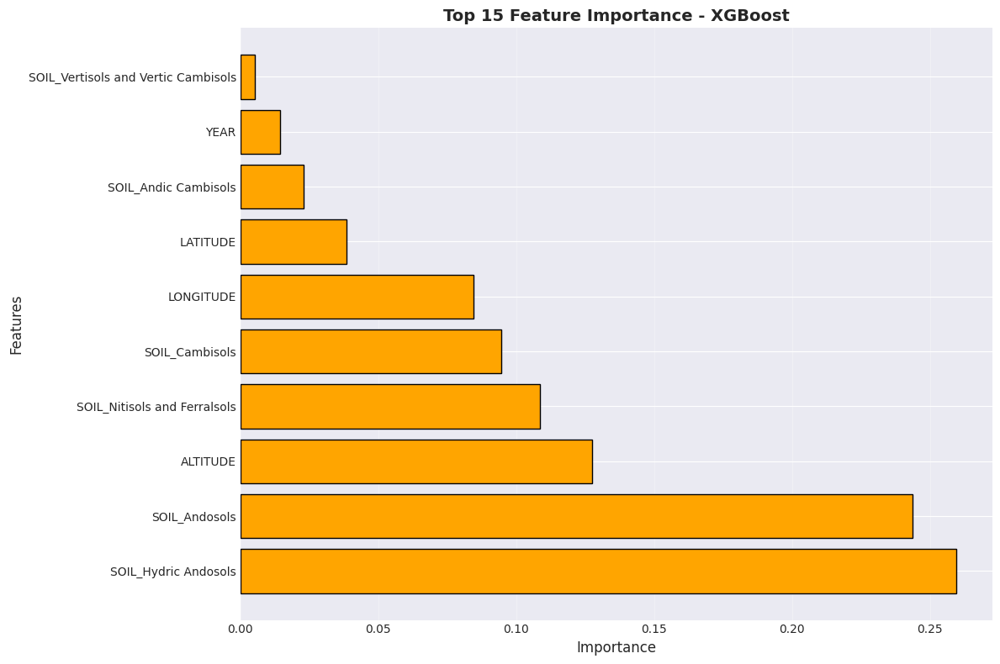

In [ ]:
# Feature Importance - XGBoost
if xgb_available:
    print("=" * 80)
    print("> FEATURE IMPORTANCE - XGBOOST")
    print("=" * 80)

    # Extraire les importances
    importances_xgb = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': xgb_model.feature_importances_
    })
    importances_xgb = importances_xgb.sort_values('Importance', ascending=False)

    print("\nTop 15 features les plus importantes :")
    display(importances_xgb.head(15))

    # Visualisation
    plt.figure(figsize=(12, 8))
    top_features_xgb = importances_xgb.head(15)
    plt.barh(top_features_xgb['Feature'], top_features_xgb['Importance'],
             color='orange', edgecolor='black')
    plt.xlabel('Importance', fontsize=12)
    plt.ylabel('Features', fontsize=12)
    plt.title('Top 15 Feature Importance - XGBoost', fontsize=14, fontweight='bold')
    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()

### Modèle 4 : LightGBM

Alternative à XGBoost, souvent plus rapide sur de gros datasets.

In [ ]:
# LightGBM avec hyperparameter tuning via Optuna
if lgbm_available:
    print("=" * 80)
    print("MODÈLE 4 : LIGHTGBM (Optimisation avec Optuna + CV pour OOF)")
    print("=" * 80)

    # Define checkpoint paths
    lgb_checkpoint = CHECKPOINT_DIR / 'lightgbm.pkl'
    lgb_oof_checkpoint = CHECKPOINT_DIR / 'lightgbm_oof.npz'
    lgb_study_checkpoint = CHECKPOINT_DIR / 'lightgbm_study.pkl'

    # Try to load from checkpoint
    if lgb_checkpoint.exists() and lgb_oof_checkpoint.exists():
        print("\n> Loading LightGBM from checkpoint...")

        # Load model and study
        with open(lgb_checkpoint, 'rb') as f:
            checkpoint_data = pickle.load(f)
        lgb_model = checkpoint_data['model']
        train_time = checkpoint_data['train_time']
        optim_time = checkpoint_data.get('optim_time', 0)

        # Load study if exists
        if lgb_study_checkpoint.exists():
            with open(lgb_study_checkpoint, 'rb') as f:
                study_lgb = pickle.load(f)

        # Load predictions
        oof_data = np.load(lgb_oof_checkpoint)
        oof_preds_lgb = oof_data['oof_preds']
        test_preds_lgb = oof_data['test_preds']

        # Prédictions finales
        y_pred_train_lgb = lgb_model.predict(X_train_scaled)
        y_pred_test_lgb = lgb_model.predict(X_test_scaled)

        print("✓ LightGBM loaded successfully from checkpoint")
        print(f"   Optim time: {optim_time:.2f}s, Train time: {train_time:.2f}s")

    else:
        print("\n> Training LightGBM from scratch...")

        # Fonction objectif pour Optuna
        def objective_lgb(trial):
            params = {
                'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
                'max_depth': trial.suggest_int('max_depth', 3, 15),
                'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
                'num_leaves': trial.suggest_int('num_leaves', 20, 150),
                'min_child_samples': trial.suggest_int('min_child_samples', 10, 100),
                'subsample': trial.suggest_float('subsample', 0.6, 1.0),
                'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
                'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
                'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
                'random_state': 42,
                'n_jobs': 1,
                'verbose': -1,
                'device': 'cpu'
            }

            lgb_model = lgb.LGBMRegressor(**params)
            score = cross_val_score(lgb_model, X_train_scaled, y_train, cv=CV_FOLDS,
                                   scoring='neg_root_mean_squared_error', n_jobs=-1)
            return score.mean()

        # Optimisation avec Optuna
        print("\n> Recherche des meilleurs hyperparamètres avec Optuna...")
        print(f"   Nombre d'essais: {LGB_N_TRIALS_OPTUNA}, CV folds: {CV_FOLDS}")
        start_time = time.time()
        study_lgb = optuna.create_study(direction='maximize', study_name='lightgbm')
        study_lgb.optimize(objective_lgb, n_trials=LGB_N_TRIALS_OPTUNA, show_progress_bar=True)
        optim_time = time.time() - start_time

        print(f"\n> Temps d'optimisation : {optim_time:.2f} secondes")
        print(f"\nMeilleurs hyperparamètres trouvés :")
        for param, value in study_lgb.best_params.items():
            print(f"   {param}: {value}")
        print(f"\n> Meilleur score (RMSE négatif) : {study_lgb.best_value:.4f}")

        # Entraînement avec K-Fold CV pour générer les prédictions out-of-fold
        print(f"\n> Génération des prédictions OOF avec K-Fold CV...")
        start_time = time.time()

        oof_preds_lgb = np.zeros(len(X_train))
        test_preds_lgb = np.zeros(len(X_test))

        for fold, (train_idx, val_idx) in enumerate(kf.split(X_train), 1):
            print(f"   Fold {fold}/{n_folds}")

            # Entraîner sur le fold - Add device='cpu' explicitly
            lgb_fold = lgb.LGBMRegressor(**study_lgb.best_params, random_state=42, n_jobs=1, verbose=-1, device='cpu')
            lgb_fold.fit(X_train_scaled.iloc[train_idx], y_train.iloc[train_idx])

            # Prédictions sur validation fold (out-of-fold)
            oof_preds_lgb[val_idx] = lgb_fold.predict(X_train_scaled.iloc[val_idx])

            # Prédire sur test set
            test_preds_lgb += lgb_fold.predict(X_test_scaled) / n_folds

        train_time = time.time() - start_time

        print(f"\n> Temps d'entraînement CV : {train_time:.2f} secondes")
        print(f"\nPrédictions OOF sauvegardées pour le stacking")

        # Entraîner le modèle final sur tout le train set - Add device='cpu' explicitly
        lgb_model = lgb.LGBMRegressor(**study_lgb.best_params, random_state=42, n_jobs=-1, verbose=-1, device='cpu')
        lgb_model.fit(X_train_scaled, y_train)

        # Prédictions finales
        y_pred_train_lgb = lgb_model.predict(X_train_scaled)
        y_pred_test_lgb = lgb_model.predict(X_test_scaled)

        # Save checkpoint
        print("\n> Saving LightGBM checkpoint...")
        with open(lgb_checkpoint, 'wb') as f:
            pickle.dump({
                'model': lgb_model,
                'train_time': train_time,
                'optim_time': optim_time
            }, f)

        with open(lgb_study_checkpoint, 'wb') as f:
            pickle.dump(study_lgb, f)

        np.savez(lgb_oof_checkpoint,
                 oof_preds=oof_preds_lgb,
                 test_preds=test_preds_lgb)

        print("✓ Checkpoint saved successfully")

    # Évaluation
    print("\n> Performance sur le Train Set (OOF) :")
    results['LightGBM (OOF)'] = evaluate_model(y_train, oof_preds_lgb, "LightGBM - OOF")

    print("\n> Performance sur le Train Set (full fit) :")
    results['LightGBM (Train)'] = evaluate_model(y_train, y_pred_train_lgb, "LightGBM - Train")

    print("\n> Performance sur le Test Set :")
    results['LightGBM (Test)'] = evaluate_model(y_test, y_pred_test_lgb, "LightGBM - Test")

else:
    print("! LightGBM n'est pas installé. Installez-le avec : pip install lightgbm")

MODÈLE 4 : LIGHTGBM (Optimisation avec Optuna + CV pour OOF)

> Loading LightGBM from checkpoint...
✓ LightGBM loaded successfully from checkpoint
   Optim time: 114.08s, Train time: 11.09s

> Performance sur le Train Set (OOF) :

> RÉSULTATS : LightGBM - OOF
  RMSE : 1.7551
  MAE  : 1.0335
  R²   : 0.7857
  MAPE : 32.26%

> Performance sur le Train Set (full fit) :

> RÉSULTATS : LightGBM - Train
  RMSE : 1.3827
  MAE  : 0.8614
  R²   : 0.8670
  MAPE : 28.09%

> Performance sur le Test Set :

> RÉSULTATS : LightGBM - Test
  RMSE : 1.7574
  MAE  : 1.0277
  R²   : 0.7901
  MAPE : 33.61%


> FEATURE IMPORTANCE - LIGHTGBM

Top 15 features les plus importantes :


,Feature,Importance
0,LONGITUDE,13569
1,LATITUDE,13327
2,ALTITUDE,13048
3,YEAR,10266
7,SOIL_Hydric Andosols,628
5,SOIL_Andosols,490
4,SOIL_Andic Cambisols,297
6,SOIL_Cambisols,285
8,SOIL_Nitisols and Ferralsols,92
9,SOIL_Vertisols and Vertic Cambisols,11


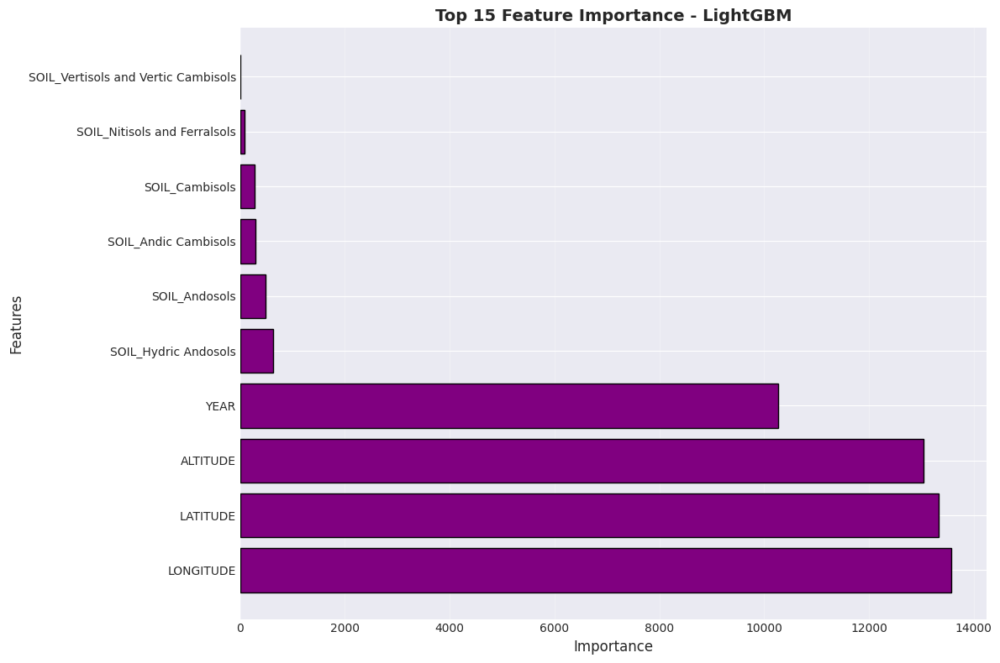

In [ ]:
# Feature Importance - LightGBM
if lgbm_available:
    print("=" * 80)
    print("> FEATURE IMPORTANCE - LIGHTGBM")
    print("=" * 80)

    # Extraire les importances
    importances_lgb = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': lgb_model.feature_importances_
    })
    importances_lgb = importances_lgb.sort_values('Importance', ascending=False)

    print("\nTop 15 features les plus importantes :")
    display(importances_lgb.head(15))

    # Visualisation
    plt.figure(figsize=(12, 8))
    top_features_lgb = importances_lgb.head(15)
    plt.barh(top_features_lgb['Feature'], top_features_lgb['Importance'],
             color='purple', edgecolor='black')
    plt.xlabel('Importance', fontsize=12)
    plt.ylabel('Features', fontsize=12)
    plt.title('Top 15 Feature Importance - LightGBM', fontsize=14, fontweight='bold')
    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()

### Modèle 5 : CatBoost

Gradient boosting spécialisé pour les variables catégorielles avec support natif des features catégorielles.

In [ ]:
# CatBoost avec hyperparameter tuning via Optuna
if catboost_available:
    print("=" * 80)
    print("MODÈLE 5 : CATBOOST (Optimisation avec Optuna + CV pour OOF)")
    print("=" * 80)

    # Define checkpoint paths
    cb_checkpoint = CHECKPOINT_DIR / 'catboost.pkl'
    cb_oof_checkpoint = CHECKPOINT_DIR / 'catboost_oof.npz'
    cb_study_checkpoint = CHECKPOINT_DIR / 'catboost_study.pkl'

    # Try to load from checkpoint
    if cb_checkpoint.exists() and cb_oof_checkpoint.exists():
        print("\n📁 Loading CatBoost from checkpoint...")

        # Load model and study
        with open(cb_checkpoint, 'rb') as f:
            checkpoint_data = pickle.load(f)
        catboost_model = checkpoint_data['model']
        train_time = checkpoint_data['train_time']
        optim_time = checkpoint_data.get('optim_time', 0)

        # Load study if exists
        if cb_study_checkpoint.exists():
            with open(cb_study_checkpoint, 'rb') as f:
                study_catboost = pickle.load(f)

        # Load predictions
        oof_data = np.load(cb_oof_checkpoint)
        oof_preds_catboost = oof_data['oof_preds']
        test_preds_catboost = oof_data['test_preds']

        # Prédictions finales
        y_pred_train_catboost = catboost_model.predict(X_train_scaled)
        y_pred_test_catboost = catboost_model.predict(X_test_scaled)

        print("✓ CatBoost loaded successfully from checkpoint")
        print(f"   Optim time: {optim_time:.2f}s, Train time: {train_time:.2f}s")

    else:
        print("\n🔨 Training CatBoost from scratch...")

        # Fonction objectif pour Optuna
        def objective_catboost(trial):
            params = {
                'iterations': trial.suggest_int('iterations', CATBOOST_ITERATIONS_MIN, CATBOOST_ITERATIONS_MAX),
                'depth': trial.suggest_int('depth', 3, 10),
                'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
                'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
                'border_count': trial.suggest_int('border_count', 32, 255),
                'random_state': 42,
                'verbose': False,
                'thread_count': -1,
                'task_type': 'CPU'
            }

            cb_model = cb.CatBoostRegressor(**params)
            score = cross_val_score(cb_model, X_train_scaled, y_train, cv=CV_FOLDS,
                                   scoring='neg_root_mean_squared_error', n_jobs=-1)
            return score.mean()

        # Optimisation avec Optuna
        print("\n> Recherche des meilleurs hyperparamètres avec Optuna...")
        print(f"   Nombre d'essais: {CATBOOST_N_TRIALS_OPTUNA}, CV folds: {CV_FOLDS}")
        start_time = time.time()
        study_catboost = optuna.create_study(direction='maximize', study_name='catboost')
        study_catboost.optimize(objective_catboost, n_trials=CATBOOST_N_TRIALS_OPTUNA, show_progress_bar=True)
        optim_time = time.time() - start_time

        print(f"\n> Temps d'optimisation : {optim_time:.2f} secondes")
        print(f"\nMeilleurs hyperparamètres trouvés :")
        for param, value in study_catboost.best_params.items():
            print(f"   {param}: {value}")
        print(f"\n> Meilleur score (RMSE négatif) : {study_catboost.best_value:.4f}")

        # Entraînement avec K-Fold CV pour générer les prédictions out-of-fold
        print(f"\n> Génération des prédictions OOF avec K-Fold CV...")
        start_time = time.time()

        oof_preds_catboost = np.zeros(len(X_train))
        test_preds_catboost = np.zeros(len(X_test))

        for fold, (train_idx, val_idx) in enumerate(kf.split(X_train), 1):
            print(f"   Fold {fold}/{n_folds}")

            # Entraîner sur le fold
            cb_fold = cb.CatBoostRegressor(**study_catboost.best_params, random_state=42, verbose=False, thread_count=1)
            cb_fold.fit(X_train_scaled.iloc[train_idx], y_train.iloc[train_idx])

            # Prédictions sur validation fold (out-of-fold)
            oof_preds_catboost[val_idx] = cb_fold.predict(X_train_scaled.iloc[val_idx])

            # Prédire sur test set
            test_preds_catboost += cb_fold.predict(X_test_scaled) / n_folds

        train_time = time.time() - start_time

        print(f"\n> Temps d'entraînement CV : {train_time:.2f} secondes")
        print(f"\nPrédictions OOF sauvegardées pour le stacking")

        # Entraîner le modèle final sur tout le train set
        catboost_model = cb.CatBoostRegressor(**study_catboost.best_params, random_state=42, verbose=False, thread_count=1)
        catboost_model.fit(X_train_scaled, y_train)

        # Prédictions finales
        y_pred_train_catboost = catboost_model.predict(X_train_scaled)
        y_pred_test_catboost = catboost_model.predict(X_test_scaled)

        # Save checkpoint
        print("\n> Saving CatBoost checkpoint...")
        with open(cb_checkpoint, 'wb') as f:
            pickle.dump({
                'model': catboost_model,
                'train_time': train_time,
                'optim_time': optim_time
            }, f)

        with open(cb_study_checkpoint, 'wb') as f:
            pickle.dump(study_catboost, f)

        np.savez(cb_oof_checkpoint,
                 oof_preds=oof_preds_catboost,
                 test_preds=test_preds_catboost)

        print("✓ Checkpoint saved successfully")

    # Évaluation
    print("\n> Performance sur le Train Set (OOF) :")
    results['CatBoost (OOF)'] = evaluate_model(y_train, oof_preds_catboost, "CatBoost - OOF")

    print("\n> Performance sur le Train Set (full fit) :")
    results['CatBoost (Train)'] = evaluate_model(y_train, y_pred_train_catboost, "CatBoost - Train")

    print("\n> Performance sur le Test Set :")
    results['CatBoost (Test)'] = evaluate_model(y_test, y_pred_test_catboost, "CatBoost - Test")

else:
    print("! CatBoost n'est pas installé. Installez-le avec : pip install catboost")


MODÈLE 5 : CATBOOST (Optimisation avec Optuna + CV pour OOF)

📁 Loading CatBoost from checkpoint...
✓ CatBoost loaded successfully from checkpoint
   Optim time: 399.23s, Train time: 25.81s

> Performance sur le Train Set (OOF) :

> RÉSULTATS : CatBoost - OOF
  RMSE : 1.7397
  MAE  : 1.0222
  R²   : 0.7895
  MAPE : 32.35%

> Performance sur le Train Set (full fit) :

> RÉSULTATS : CatBoost - Train
  RMSE : 1.3135
  MAE  : 0.8503
  R²   : 0.8800
  MAPE : 28.46%

> Performance sur le Test Set :

> RÉSULTATS : CatBoost - Test
  RMSE : 1.7338
  MAE  : 1.0086
  R²   : 0.7957
  MAPE : 33.34%


> FEATURE IMPORTANCE - CATBOOST

Top 15 features les plus importantes :


,Feature,Importance
2,ALTITUDE,31.312768
0,LONGITUDE,26.049057
1,LATITUDE,22.797828
3,YEAR,11.269885
7,SOIL_Hydric Andosols,3.595219
5,SOIL_Andosols,3.123276
6,SOIL_Cambisols,0.874851
4,SOIL_Andic Cambisols,0.654992
8,SOIL_Nitisols and Ferralsols,0.314918
9,SOIL_Vertisols and Vertic Cambisols,0.007205


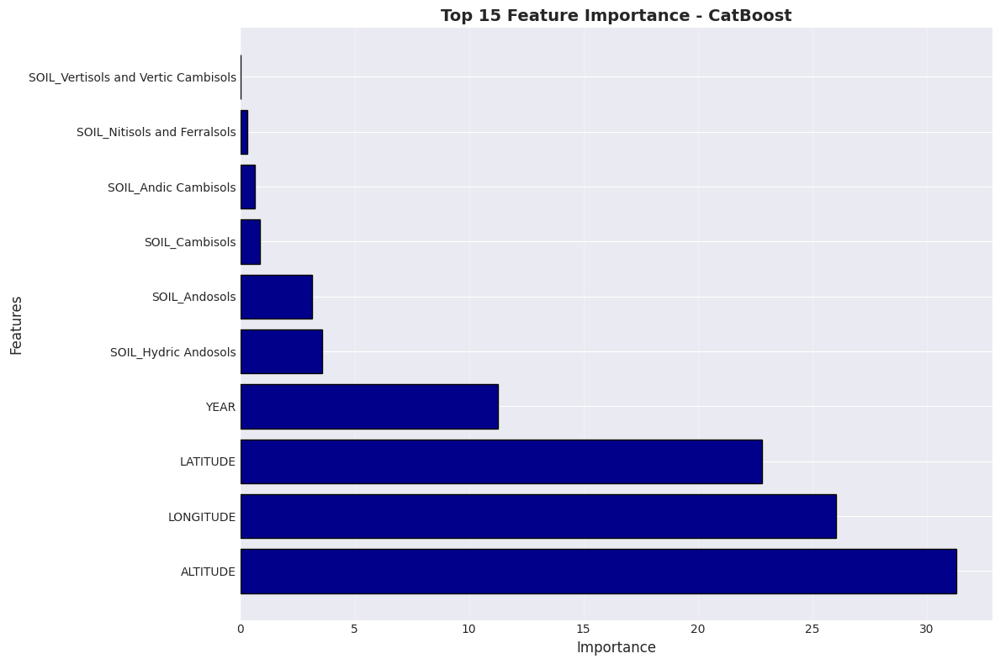

In [ ]:
# Feature Importance - CatBoost
if catboost_available:
    print("=" * 80)
    print("> FEATURE IMPORTANCE - CATBOOST")
    print("=" * 80)

    # Extraire les importances
    importances_catboost = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': catboost_model.feature_importances_
    })
    importances_catboost = importances_catboost.sort_values('Importance', ascending=False)

    print("\nTop 15 features les plus importantes :")
    display(importances_catboost.head(15))

    # Visualisation
    plt.figure(figsize=(12, 8))
    top_features_catboost = importances_catboost.head(15)
    plt.barh(top_features_catboost['Feature'], top_features_catboost['Importance'],
             color='darkblue', edgecolor='black')
    plt.xlabel('Importance', fontsize=12)
    plt.ylabel('Features', fontsize=12)
    plt.title('Top 15 Feature Importance - CatBoost', fontsize=14, fontweight='bold')
    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()

### Modèle 6 : TabPFN

TabPFN (Tabular Prior-data Fitted Network) est un modèle basé sur des transformers pré-entraînés sur des données tabulaires synthétiques.
**Note :** TabPFN a des limites sur la taille du dataset (max 10000 lignes, 100 features).

In [ ]:
# TabPFN avec hyperparameter tuning via Optuna + CV pour OOF
if tabpfn_available:
    from sklearn.metrics import mean_squared_error
    import torch

    print("=" * 80)
    print("MODÈLE 6 : TABPFN (Optimisation avec Optuna + CV pour OOF)")
    print("=" * 80)

    # Define checkpoint paths
    tabpfn_checkpoint = CHECKPOINT_DIR / 'tabpfn.pkl'
    tabpfn_oof_checkpoint = CHECKPOINT_DIR / 'tabpfn_oof.npz'
    tabpfn_study_checkpoint = CHECKPOINT_DIR / 'tabpfn_study.pkl'

    # TabPFN a des limites : max 10000 samples et 100 features
    max_samples_tabpfn = 3000  # can go up to 10000 but too slow for this demo
    max_features_tabpfn = 100

    # Déterminer le device (CPU par défaut pour éviter les problèmes de hang)
    tabpfn_device = 'cuda'
    # if torch.cuda.is_available():
        # print(f"   GPU disponible mais utilisation du CPU pour éviter les problèmes de threading")

    # Sélectionner les features les plus importantes si nécessaire
    if X_train_scaled.shape[1] > max_features_tabpfn:
        print(f"\n> Sélection des {max_features_tabpfn} features les plus importantes...")
        if 'importances_rf' in locals():
            top_features = importances_rf.head(max_features_tabpfn)['Feature'].tolist()
            X_train_tabpfn_full = X_train_scaled[top_features]
            X_test_tabpfn = X_test_scaled[top_features]
        else:
            X_train_tabpfn_full = X_train_scaled.iloc[:, :max_features_tabpfn]
            X_test_tabpfn = X_test_scaled.iloc[:, :max_features_tabpfn]
    else:
        X_train_tabpfn_full = X_train_scaled
        X_test_tabpfn = X_test_scaled

    # Try to load from checkpoint
    if tabpfn_checkpoint.exists() and tabpfn_oof_checkpoint.exists():
        print("\n📁 Loading TabPFN from checkpoint...")

        with open(tabpfn_checkpoint, 'rb') as f:
            checkpoint_data = pickle.load(f)
        tabpfn_model = checkpoint_data['model']
        train_time = checkpoint_data['train_time']
        optim_time = checkpoint_data.get('optim_time', 0)
        X_train_tabpfn = checkpoint_data['X_train_tabpfn']
        y_train_tabpfn = checkpoint_data['y_train_tabpfn']
        X_test_tabpfn = checkpoint_data['X_test_tabpfn']

        if tabpfn_study_checkpoint.exists():
            with open(tabpfn_study_checkpoint, 'rb') as f:
                study_tabpfn = pickle.load(f)

        oof_data = np.load(tabpfn_oof_checkpoint)
        oof_preds_tabpfn = oof_data['oof_preds']
        test_preds_tabpfn = oof_data['test_preds']

        y_pred_train_tabpfn = tabpfn_model.predict(X_train_tabpfn.values)
        y_pred_test_tabpfn = tabpfn_model.predict(X_test_tabpfn.values)

        print("✓ TabPFN loaded successfully from checkpoint")
        print(f"   Optim time: {optim_time:.2f}s, Train time: {train_time:.2f}s")
        tabpfn_trained = True

    else:
        print("\n🔨 Training TabPFN from scratch...")

        print(f"\n> Optimisation de TabPFN avec {X_train_tabpfn_full.shape[1]} features...")
        print(f"   Note: TabPFN limité à {max_samples_tabpfn} samples par fold")

        try:
            # Fonction objectif pour Optuna (utilise subset pour l'optimisation)
            # Using a simple train/val split instead of CV to speed up optimization
            def objective_tabpfn(trial):
                params = {
                    'n_estimators': trial.suggest_int('n_estimators', TABPFN_N_ESTIMATORS_MIN, TABPFN_N_ESTIMATORS_MAX),
                    'device': tabpfn_device
                }

                # Sous-échantillonner pour Optuna avec split réduit (plus rapide que CV)
                if len(X_train_tabpfn_full) > max_samples_tabpfn:
                    sample_idx_opt = np.random.choice(len(X_train_tabpfn_full), size=1500, replace=False)
                    X_opt = X_train_tabpfn_full.iloc[sample_idx_opt]
                    y_opt = y_train.iloc[sample_idx_opt]
                else:
                    X_opt = X_train_tabpfn_full
                    y_opt = y_train

                # Simple train/val split au lieu de CV (beaucoup plus rapide)
                split_idx = int(len(X_opt) * 0.8)
                X_train_opt, X_val_opt = X_opt.iloc[:split_idx].values, X_opt.iloc[split_idx:].values
                y_train_opt, y_val_opt = y_opt.iloc[:split_idx].values, y_opt.iloc[split_idx:].values

                try:
                    model = TabPFNRegressor(**params)
                    model.fit(X_train_opt, y_train_opt)
                    y_pred = model.predict(X_val_opt)

                    # Return negative RMSE (pour maximisation dans Optuna)
                    rmse = np.sqrt(mean_squared_error(y_val_opt, y_pred))
                    return -rmse
                except Exception as e:
                    print(f"   Trial failed: {str(e)[:100]}")
                    return float('-inf')  # Retourner une très mauvaise valeur au lieu de crasher

            # Optimisation avec Optuna (train/val split simple pour accélérer)
            print("\n> Recherche des meilleurs hyperparamètres avec Optuna...")
            print(f"   Nombre d'essais: {TABPFN_N_TRIALS_OPTUNA}")
            print(f"   Device: {tabpfn_device}")
            start_time = time.time()
            study_tabpfn = optuna.create_study(direction='maximize', study_name='tabpfn')
            # Utiliser n_jobs=1 pour éviter les problèmes de multiprocessing avec TabPFN
            study_tabpfn.optimize(objective_tabpfn, n_trials=TABPFN_N_TRIALS_OPTUNA,
                                  show_progress_bar=True, n_jobs=1)
            optim_time = time.time() - start_time

            print(f"\n>Temps d'optimisation : {optim_time:.2f} secondes")
            print(f"\nMeilleurs hyperparamètres trouvés :")
            for param, value in study_tabpfn.best_params.items():
                print(f"   {param}: {value}")
            print(f"\n> Meilleur score (RMSE négatif) : {study_tabpfn.best_value:.4f}")

            # Générer les prédictions OOF avec K-Fold CV
            print(f"\n> Génération des prédictions OOF avec K-Fold CV...")
            print(f"   (Training on subset of up to {max_samples_tabpfn} samples per fold)")
            start_time = time.time()

            for fold, (train_idx, val_idx) in enumerate(kf.split(X_train), 1):
                print(f"   Fold {fold}/{n_folds}")

                # Récupérer les indices pour ce fold
                X_fold_train = X_train_tabpfn_full.iloc[train_idx]
                X_fold_val = X_train_tabpfn_full.iloc[val_idx]
                y_fold_train = y_train.iloc[train_idx]

                # Sous-échantillonner le fold si nécessaire
                if len(X_fold_train) > max_samples_tabpfn:
                    subset_idx = np.random.choice(len(X_fold_train), size=max_samples_tabpfn, replace=False)
                    X_fold_train_subset = X_fold_train.iloc[subset_idx].values
                    y_fold_train_subset = y_fold_train.iloc[subset_idx].values
                else:
                    X_fold_train_subset = X_fold_train.values
                    y_fold_train_subset = y_fold_train.values

                # Entraîner TabPFN sur le subset du fold
                tabpfn_fold = TabPFNRegressor(**study_tabpfn.best_params, device=tabpfn_device)
                tabpfn_fold.fit(X_fold_train_subset, y_fold_train_subset)

                # Prédire sur le fold de validation complet
                oof_preds_tabpfn[val_idx] = tabpfn_fold.predict(X_fold_val.values)

                # Prédire sur test set
                test_preds_tabpfn += tabpfn_fold.predict(X_test_tabpfn.values) / n_folds

            train_time = time.time() - start_time

            # Entraîner le modèle final sur un subset du train set complet
            if len(X_train_tabpfn_full) > max_samples_tabpfn:
                sample_idx_final = np.random.choice(len(X_train_tabpfn_full), size=max_samples_tabpfn, replace=False)
                X_train_tabpfn = X_train_tabpfn_full.iloc[sample_idx_final]
                y_train_tabpfn = y_train.iloc[sample_idx_final]
            else:
                X_train_tabpfn = X_train_tabpfn_full
                y_train_tabpfn = y_train

            tabpfn_model = TabPFNRegressor(**study_tabpfn.best_params, device=tabpfn_device)
            tabpfn_model.fit(X_train_tabpfn.values, y_train_tabpfn.values)

            # Prédictions finales
            y_pred_train_tabpfn = tabpfn_model.predict(X_train_tabpfn.values)
            y_pred_test_tabpfn = tabpfn_model.predict(X_test_tabpfn.values)

            # Save checkpoint
            print("\n> Saving TabPFN checkpoint...")
            with open(tabpfn_checkpoint, 'wb') as f:
                pickle.dump({
                    'model': tabpfn_model,
                    'train_time': train_time,
                    'optim_time': optim_time,
                    'X_train_tabpfn': X_train_tabpfn,
                    'y_train_tabpfn': y_train_tabpfn,
                    'X_test_tabpfn': X_test_tabpfn
                }, f)

            with open(tabpfn_study_checkpoint, 'wb') as f:
                pickle.dump(study_tabpfn, f)

            np.savez(tabpfn_oof_checkpoint,
                     oof_preds=oof_preds_tabpfn,
                     test_preds=test_preds_tabpfn)

            print("✓ Checkpoint saved successfully")
            tabpfn_trained = True

        except Exception as e:
            print(f"\n! Erreur lors de l'entraînement de TabPFN : {str(e)}")
            tabpfn_trained = False

    # Évaluation (commune que le modèle soit chargé ou entraîné)
    if tabpfn_trained:
        print(f"\n>Temps d'entraînement CV : {train_time:.2f} secondes")
        print("\n> Performance sur le Train Set (OOF) :")
        results['TabPFN (OOF)'] = evaluate_model(y_train, oof_preds_tabpfn, "TabPFN - OOF")

        print("\n> Performance sur le Train Set (subset fit) :")
        results['TabPFN (Train)'] = evaluate_model(y_train_tabpfn, y_pred_train_tabpfn, "TabPFN - Train")

        print("\n>Performance sur le Test Set :")
        results['TabPFN (Test)'] = evaluate_model(y_test, y_pred_test_tabpfn, "TabPFN - Test")

        print(f"\nPrédictions OOF sauvegardées pour le stacking")

else:
    print("! TabPFN n'est pas installé. Installez-le avec : pip install tabpfn")
    tabpfn_trained = False


MODÈLE 6 : TABPFN (Optimisation avec Optuna + CV pour OOF)

📁 Loading TabPFN from checkpoint...
✓ TabPFN loaded successfully from checkpoint
   Optim time: 34.35s, Train time: 27.07s

>Temps d'entraînement CV : 27.07 secondes

> Performance sur le Train Set (OOF) :

> RÉSULTATS : TabPFN - OOF
  RMSE : 1.8830
  MAE  : 1.0893
  R²   : 0.7533
  MAPE : 34.81%

> Performance sur le Train Set (subset fit) :

> RÉSULTATS : TabPFN - Train
  RMSE : 1.4705
  MAE  : 0.8191
  R²   : 0.8468
  MAPE : 26.23%

>Performance sur le Test Set :

> RÉSULTATS : TabPFN - Test
  RMSE : 1.8798
  MAE  : 1.0776
  R²   : 0.7598
  MAPE : 36.51%

Prédictions OOF sauvegardées pour le stacking


### Modèle 7 : Graph Neural Network (GNN)

GNN exploite la structure spatiale en créant un graphe où chaque échantillon est un nœud connecté à ses voisins géographiques.

In [ ]:
# Graph Neural Network - Préparation des données
if torch_available:
    print("=" * 80)
    print("MODÈLE 7 : GRAPH NEURAL NETWORK (GNN avec CV pour OOF)")
    print("=" * 80)

    # Define checkpoint paths
    gnn_checkpoint = CHECKPOINT_DIR / 'gnn_state.pt'
    gnn_oof_checkpoint = CHECKPOINT_DIR / 'gnn_oof.npz'

    from sklearn.neighbors import kneighbors_graph

    # Use ALL training data for GNN to ensure proper OOF predictions for stacking
    # No subsampling - we need predictions for every training sample
    X_train_gnn = X_train_scaled
    y_train_gnn = y_train

    print(f"\n> Préparation des données GNN avec {len(X_train_gnn)} nœuds (ALL training data)...")

    # Vérifier que les colonnes spatiales existent
    if 'LONGITUDE' in X_train.columns and 'LATITUDE' in X_train.columns:
        coords_train_full = X_train[['LONGITUDE', 'LATITUDE']].values
        coords_test = X_test[['LONGITUDE', 'LATITUDE']].values

        k_neighbors = 8
        print(f"   k-NN neighbors: {k_neighbors}")
        print("\nDonnées préparées pour GNN avec CV sur TOUTES les données")
        gnn_data_ready = True

    else:
        print("! Colonnes LONGITUDE et LATITUDE nécessaires pour construire le graphe")
        gnn_data_ready = False

else:
    print("! PyTorch Geometric n'est pas installé.")
    print("   Installez-le avec : pip install torch torch-geometric")
    gnn_data_ready = False

MODÈLE 7 : GRAPH NEURAL NETWORK (GNN avec CV pour OOF)

> Préparation des données GNN avec 18814 nœuds (ALL training data)...
   k-NN neighbors: 8

Données préparées pour GNN avec CV sur TOUTES les données


In [ ]:
# Entraînement du GNN avec K-Fold CV pour OOF
if torch_available and gnn_data_ready:
    import torch.nn as nn
    import torch.nn.functional as F
    from torch_geometric.nn import GCNConv

    # Try to load from checkpoint
    if gnn_oof_checkpoint.exists():
        print("\n> Loading GNN predictions from checkpoint...")

        oof_data = np.load(gnn_oof_checkpoint)
        oof_preds_gnn = oof_data['oof_preds']  # Full OOF predictions for all training data
        # y_pred_train_gnn = oof_data['train_preds']  # Train predictions from final model
        y_pred_test_gnn = oof_data['test_preds']
        train_time = float(oof_data['train_time'])

        print("✓ GNN predictions loaded successfully from checkpoint")
        print(f"   OOF predictions shape: {oof_preds_gnn.shape}")
        # print(f"   Train predictions shape: {y_pred_train_gnn.shape}")
        print(f"   Train time: {train_time:.2f}s")
        gnn_trained = True

    else:
        print("\n> Training GNN from scratch...")

        class GNNRegressor(nn.Module):
            def __init__(self, num_features, hidden_channels):
                super(GNNRegressor, self).__init__()
                self.conv1 = GCNConv(num_features, hidden_channels)
                self.conv2 = GCNConv(hidden_channels, hidden_channels)
                self.conv3 = GCNConv(hidden_channels, hidden_channels // 2)
                self.lin = nn.Linear(hidden_channels // 2, 1)

            def forward(self, x, edge_index):
                # Première couche de convolution
                x = self.conv1(x, edge_index)
                x = F.relu(x)
                x = F.dropout(x, p=0.2, training=self.training)

                # Deuxième couche de convolution
                x = self.conv2(x, edge_index)
                x = F.relu(x)
                x = F.dropout(x, p=0.2, training=self.training)

                # Troisième couche de convolution
                x = self.conv3(x, edge_index)
                x = F.relu(x)

                # Couche linéaire finale
                x = self.lin(x)

                return x

        num_features = X_train_gnn.shape[1]
        hidden_channels = 128

        print("\n> Architecture du GNN :")
        print(f"   - Input features : {num_features}")
        print(f"   - Hidden channels : {hidden_channels}")
        print(f"   - Layers : 3 GCN + 1 Linear")

        # Créer un KFold sur les indices échantillonnés
        from sklearn.model_selection import KFold
        kf_gnn = KFold(n_splits=n_folds, shuffle=True, random_state=42)

        # Initialiser les arrays pour les prédictions OOF (sur TOUTES les données d'entraînement)
        oof_preds_gnn = np.zeros(len(X_train_gnn))
        test_preds_gnn = np.zeros(len(X_test_scaled))

        print(f"\n> Entraînement du GNN avec {n_folds}-Fold CV...")
        print(f"   Epochs max: {GNN_EPOCHS}, Patience: 50")
        start_time = time.time()

        for fold, (train_idx_fold, val_idx_fold) in enumerate(kf_gnn.split(X_train_gnn), 1):
            print(f"\n   Fold {fold}/{n_folds}")

            # Données du fold
            X_fold_train = X_train_gnn.iloc[train_idx_fold]
            X_fold_val = X_train_gnn.iloc[val_idx_fold]
            y_fold_train = y_train_gnn.iloc[train_idx_fold]
            y_fold_val = y_train_gnn.iloc[val_idx_fold]

            # Coordonnées pour construire le graphe du fold
            coords_fold_train = coords_train_full[train_idx_fold]

            # Construire le graphe k-NN pour ce fold
            adjacency_matrix_fold = kneighbors_graph(coords_fold_train, n_neighbors=k_neighbors,
                                                      mode='connectivity', include_self=False)
            edge_index_coo_fold = adjacency_matrix_fold.tocoo()
            edge_index_fold = torch.tensor([edge_index_coo_fold.row, edge_index_coo_fold.col], dtype=torch.long)

            # Préparer les tenseurs
            x_train_tensor = torch.tensor(X_fold_train.values, dtype=torch.float)
            y_train_tensor = torch.tensor(y_fold_train.values, dtype=torch.float).view(-1, 1)
            x_val_tensor = torch.tensor(X_fold_val.values, dtype=torch.float)

            # Créer les objets Data
            train_data_fold = Data(x=x_train_tensor, edge_index=edge_index_fold, y=y_train_tensor)

            # Initialiser le modèle pour ce fold
            gnn_fold = GNNRegressor(num_features, hidden_channels)
            optimizer = torch.optim.Adam(gnn_fold.parameters(), lr=0.01, weight_decay=5e-4)
            criterion = nn.MSELoss()

            # Entraînement du fold
            gnn_fold.train()
            best_loss = float('inf')
            patience_counter = 0

            for epoch in range(GNN_EPOCHS):
                optimizer.zero_grad()
                out = gnn_fold(train_data_fold.x, train_data_fold.edge_index)
                loss = criterion(out, train_data_fold.y)
                loss.backward()
                optimizer.step()

                # Early stopping
                if loss.item() < best_loss:
                    best_loss = loss.item()
                    patience_counter = 0
                else:
                    patience_counter += 1

                if patience_counter >= 50:
                    break

            # Prédictions OOF pour ce fold
            gnn_fold.eval()
            with torch.no_grad():
                # Créer un graphe simple pour la validation (self-loops)
                edge_index_val = torch.tensor([[i, i] for i in range(len(X_fold_val))], dtype=torch.long).t()
                val_data = Data(x=x_val_tensor, edge_index=edge_index_val)
                val_preds = gnn_fold(val_data.x, val_data.edge_index).numpy().flatten()

            # Stocker les prédictions OOF (indices locaux dans X_train_gnn)
            oof_preds_gnn[val_idx_fold] = val_preds

            # Prédire sur le test set et accumuler
            x_test_tensor = torch.tensor(X_test_scaled.values, dtype=torch.float)
            edge_index_test = torch.tensor([[i, i] for i in range(len(X_test))], dtype=torch.long).t()
            test_data = Data(x=x_test_tensor, edge_index=edge_index_test)

            with torch.no_grad():
                test_preds_gnn += gnn_fold(test_data.x, test_data.edge_index).numpy().flatten() / n_folds

        train_time = time.time() - start_time
        print(f"\n> Temps d'entraînement CV : {train_time:.2f} secondes")
        print(f"✓ OOF predictions generated for ALL {len(oof_preds_gnn)} training samples")

        # Use averaged test predictions from CV
        y_pred_test_gnn = test_preds_gnn

        # Entraîner le modèle final sur toutes les données
        print("\n> Entraînement du modèle final sur toutes les données...")
        adjacency_matrix_final = kneighbors_graph(coords_train_full, n_neighbors=k_neighbors,
                                                  mode='connectivity', include_self=False)
        edge_index_coo_final = adjacency_matrix_final.tocoo()
        edge_index_final = torch.tensor([edge_index_coo_final.row, edge_index_coo_final.col], dtype=torch.long)

        x_train_tensor_final = torch.tensor(X_train_gnn.values, dtype=torch.float)
        y_train_tensor_final = torch.tensor(y_train_gnn.values, dtype=torch.float).view(-1, 1)
        train_data_final = Data(x=x_train_tensor_final, edge_index=edge_index_final, y=y_train_tensor_final)

        gnn_model = GNNRegressor(num_features, hidden_channels)
        optimizer = torch.optim.Adam(gnn_model.parameters(), lr=0.01, weight_decay=5e-4)
        criterion = nn.MSELoss()

        gnn_model.train()
        losses = []
        for epoch in range(GNN_EPOCHS // 2):  # Moins d'epochs pour le modèle final
            optimizer.zero_grad()
            out = gnn_model(train_data_final.x, train_data_final.edge_index)
            loss = criterion(out, train_data_final.y)
            loss.backward()
            optimizer.step()
            losses.append(loss.item())

        # Prédictions finales
        gnn_model.eval()
        with torch.no_grad():
            y_pred_train_gnn = gnn_model(train_data_final.x, train_data_final.edge_index).numpy().flatten()

        # Visualiser la courbe de loss
        plt.figure(figsize=(10, 6))
        plt.plot(losses, linewidth=2)
        plt.xlabel('Epoch', fontsize=12)
        plt.ylabel('MSE Loss', fontsize=12)
        plt.title('Courbe d\'entraînement du GNN (Modèle Final)', fontsize=14, fontweight='bold')
        plt.grid(alpha=0.3)
        plt.tight_layout()
        # Save checkpoint with FULL OOF predictions and train predictions
        print("\n> Saving GNN checkpoint...")
        np.savez(gnn_oof_checkpoint,
                 oof_preds=oof_preds_gnn,  # Full OOF for all training data
                 train_preds=y_pred_train_gnn,  # Train predictions from final model
                 test_preds=y_pred_test_gnn,
                 train_time=train_time)
        print("✓ Checkpoint saved successfully")

        gnn_trained = True
else:
    gnn_trained = False



> Loading GNN predictions from checkpoint...
✓ GNN predictions loaded successfully from checkpoint
   OOF predictions shape: (18814,)
   Train time: 805.90s


In [ ]:
# Évaluation finale du GNN
if gnn_trained:
    print("=" * 80)
    print("> ÉVALUATION FINALE DU GNN")
    print("=" * 80)

    # Évaluation sur le Train Set (modèle final)
    # print("\n> Performance sur le Train Set (modèle final sur toutes les données) :")
    # results['GNN (Train)'] = evaluate_model(y_train_gnn, y_pred_train_gnn, "GNN - Train")

    # Évaluation OOF (validation croisée - estimation non biaisée)
    print("\n> Performance OOF (validation croisée sur les données d'entraînement) :")
    results['GNN (Test)'] = evaluate_model(y_test, y_pred_test_gnn, "GNN - Test")

    results['GNN (OOF)'] = evaluate_model(y_train_gnn, oof_preds_gnn, "GNN - OOF")
    print("\n> Performance sur le Test Set :")


> ÉVALUATION FINALE DU GNN

> Performance OOF (validation croisée sur les données d'entraînement) :

> RÉSULTATS : GNN - Test
  RMSE : 2.1257
  MAE  : 1.2006
  R²   : 0.6929
  MAPE : 40.04%

> RÉSULTATS : GNN - OOF
  RMSE : 2.2445
  MAE  : 1.2411
  R²   : 0.6495
  MAPE : 38.22%

> Performance sur le Test Set :


## Phase 6 : Modèles Spatiaux

### Modèle 8 : Kriging Universel (Géostatistique)

Exploitation de l'autocorrélation spatiale pour améliorer les prédictions.

In [ ]:
# Kriging Universel avec OOF predictions
try:
    from pykrige.ok import OrdinaryKriging
    from pykrige.uk import UniversalKriging

    print("=" * 80)
    print("MODÈLE 5 : KRIGING")
    print("=" * 80)

    # Define checkpoint paths
    kriging_checkpoint = CHECKPOINT_DIR / 'kriging_oof.npz'

    # Préparer les données spatiales (utiliser les données non-normalisées pour le kriging)
    if all(col in X_train.columns for col in ['LONGITUDE', 'LATITUDE']):

        # Try to load from checkpoint
        if kriging_checkpoint.exists():
            print("\n> Loading Kriging predictions from checkpoint...")

            oof_data = np.load(kriging_checkpoint)
            oof_preds_kriging = oof_data['oof_preds']
            y_pred_test_krig = oof_data['test_preds']

            print("✓ Kriging predictions loaded successfully from checkpoint")
            kriging_available = True

        else:
            print("\n🔨 Training Kriging from scratch...")

            # Initialiser les arrays pour OOF et test predictions
            oof_preds_kriging = np.zeros(len(X_train))
            test_preds_kriging = []

            print(f"\n> Cross-validation avec {CV_FOLDS} folds...")
            kf_kriging = KFold(n_splits=CV_FOLDS, shuffle=True, random_state=42)

            for fold, (train_idx, val_idx) in enumerate(kf_kriging.split(X_train), 1):
                print(f"\n{'='*60}")
                print(f"FOLD {fold}/{CV_FOLDS}")
                print(f"{'='*60}")

                X_fold_train = X_train.iloc[train_idx]
                y_fold_train = y_train.iloc[train_idx]
                X_fold_val = X_train.iloc[val_idx]
                y_fold_val = y_train.iloc[val_idx]

                # Limiter le nombre de points pour accélérer le kriging
                if len(X_fold_train) > MAX_POINTS_KRIGING:
                    print(f"! Sous-échantillonnage à {MAX_POINTS_KRIGING} points pour kriging...")
                    sample_idx = np.random.choice(len(X_fold_train), size=MAX_POINTS_KRIGING, replace=False)
                    X_fold_train_subset = X_fold_train.iloc[sample_idx]
                    y_fold_train_subset = y_fold_train.iloc[sample_idx]
                else:
                    X_fold_train_subset = X_fold_train
                    y_fold_train_subset = y_fold_train

                print(f"> Entraînement du modèle de kriging sur {len(X_fold_train_subset)} points...")
                start_time = time.time()

                # Ordinary Kriging
                ok_fold = OrdinaryKriging(
                    X_fold_train_subset['LONGITUDE'].values.astype(np.float64),
                    X_fold_train_subset['LATITUDE'].values.astype(np.float64),
                    y_fold_train_subset.values.astype(np.float64),
                    variogram_model='spherical',
                    verbose=False,
                    enable_plotting=False
                )

                train_time = time.time() - start_time
                print(f"   Temps d'entraînement : {train_time:.2f}s")

                # Prédictions OOF sur le fold de validation
                print(f"> Prédictions OOF sur {len(X_fold_val)} points...")
                y_pred_val, ss = ok_fold.execute(
                    'points',
                    X_fold_val['LONGITUDE'].values.astype(np.float64),
                    X_fold_val['LATITUDE'].values.astype(np.float64)
                )
                oof_preds_kriging[val_idx] = y_pred_val

                # Évaluer sur le fold de validation
                fold_r2 = r2_score(y_fold_val, y_pred_val)
                fold_rmse = np.sqrt(mean_squared_error(y_fold_val, y_pred_val))
                print(f"   Fold {fold} - R²: {fold_r2:.4f}, RMSE: {fold_rmse:.4f}")

                # Prédictions sur le test set
                print(f"> Prédictions sur le test set...")
                y_pred_test, ss = ok_fold.execute(
                    'points',
                    X_test['LONGITUDE'].values.astype(np.float64),
                    X_test['LATITUDE'].values.astype(np.float64)
                )
                test_preds_kriging.append(y_pred_test)

            # Moyenner les prédictions test sur tous les folds
            y_pred_test_krig = np.mean(test_preds_kriging, axis=0)

            # Save checkpoint
            print("\n> Saving Kriging checkpoint...")
            np.savez(kriging_checkpoint,
                     oof_preds=oof_preds_kriging,
                     test_preds=y_pred_test_krig)
            print("✓ Checkpoint saved successfully")

        # Évaluation OOF (commune que le modèle soit chargé ou entraîné)
        print("\n" + "=" * 80)
        print("RÉSULTATS FINAUX - KRIGING")
        print("=" * 80)
        print("\n>Performance OOF (Out-of-Fold) :")
        results['Kriging (OOF)'] = evaluate_model(y_train, oof_preds_kriging, "Kriging - OOF")

        print("\n>Performance sur le Test Set :")
        results['Kriging (Test)'] = evaluate_model(y_test, y_pred_test_krig, "Kriging - Test")

        kriging_available = True

        # Entraîner un modèle final pour visualiser les paramètres du variogramme
        print("\n> Paramètres du variogramme (modèle final) :")
        if len(X_train) > MAX_POINTS_KRIGING:
            sample_idx = np.random.choice(X_train.index, size=MAX_POINTS_KRIGING, replace=False)
            X_train_krig = X_train.loc[sample_idx]
            y_train_krig = y_train.loc[sample_idx]
        else:
            X_train_krig = X_train
            y_train_krig = y_train

        ok_model = OrdinaryKriging(
            X_train_krig['LONGITUDE'].values.astype(np.float64),
            X_train_krig['LATITUDE'].values.astype(np.float64),
            y_train_krig.values.astype(np.float64),
            variogram_model='spherical',
            verbose=False,
            enable_plotting=False
        )

        print(f"   Modèle : {ok_model.variogram_model}")
        print(f"   Sill : {ok_model.variogram_model_parameters[0]:.4f}")
        print(f"   Range : {ok_model.variogram_model_parameters[1]:.4f}")
        print(f"   Nugget : {ok_model.variogram_model_parameters[2]:.4f}")

    else:
        print("! Colonnes LONGITUDE et LATITUDE nécessaires pour le kriging")
        kriging_available = False

except ImportError:
    print("! PyKrige n'est pas installé. Installez-le avec : pip install pykrige")
    kriging_available = False
except Exception as e:
    print(f"! Erreur lors du kriging : {str(e)}")
    import traceback
    traceback.print_exc()
    kriging_available = False

MODÈLE 5 : KRIGING

> Loading Kriging predictions from checkpoint...
✓ Kriging predictions loaded successfully from checkpoint

RÉSULTATS FINAUX - KRIGING

>Performance OOF (Out-of-Fold) :

> RÉSULTATS : Kriging - OOF
  RMSE : 2.7309
  MAE  : 1.6736
  R²   : 0.4812
  MAPE : 59.57%

>Performance sur le Test Set :

> RÉSULTATS : Kriging - Test
  RMSE : 2.3898
  MAE  : 1.5254
  R²   : 0.6119
  MAPE : 58.44%

> Paramètres du variogramme (modèle final) :
   Modèle : spherical
   Sill : 14.9383
   Range : 21568.5974
   Nugget : 2.1414


### Modèle 9 : Geographically Weighted Regression (GWR)

Régression avec coefficients variables dans l'espace.

In [ ]:
# Geographically Weighted Regression (GWR) avec OOF predictions
try:
    from mgwr.gwr import GWR
    from mgwr.sel_bw import Sel_BW
    from sklearn.preprocessing import StandardScaler
    from scipy.spatial import distance_matrix
    from scipy.special import expit

    print("=" * 80)
    print("> MODÈLE 9 : GEOGRAPHICALLY WEIGHTED REGRESSION (GWR)")
    print("=" * 80)

    # Define checkpoint paths
    gwr_checkpoint = CHECKPOINT_DIR / 'gwr_oof.npz'

    if all(col in X_train.columns for col in ['LONGITUDE', 'LATITUDE']):

        # Try to load from checkpoint
        if gwr_checkpoint.exists():
            print("\n> Loading GWR predictions from checkpoint...")

            oof_data = np.load(gwr_checkpoint)
            oof_preds_gwr = oof_data['oof_preds']
            y_pred_test_gwr = oof_data['test_preds']

            print("✓ GWR predictions loaded successfully from checkpoint")
            gwr_available = True

        else:
            print("\n> Training GWR from scratch...")

            # Initialiser les arrays pour OOF et test predictions
            oof_preds_gwr = np.zeros(len(X_train))
            test_preds_gwr = []

            # Utiliser seulement les features continues
            continuous_features = ['ALTITUDE', 'YEAR']

            # Ajouter une seule variable de sol
            soil_cols = [col for col in X_train.columns if col.startswith('SOIL_')]
            if soil_cols:
                soil_counts_train = X_train[soil_cols].sum()
                most_common_soil = soil_counts_train.idxmax()
                continuous_features.append(most_common_soil)

            top_features_for_gwr = [f for f in continuous_features if f in X_train.columns]

            print(f"\n> Features sélectionnées pour GWR : {top_features_for_gwr}")
            print(f"\n> Cross-validation avec {CV_FOLDS} folds...")

            kf_gwr = KFold(n_splits=CV_FOLDS, shuffle=True, random_state=42)

            for fold, (train_idx, val_idx) in enumerate(kf_gwr.split(X_train), 1):
                print(f"\n{'='*60}")
                print(f"FOLD {fold}/{CV_FOLDS}")
                print(f"{'='*60}")

                X_fold_train = X_train.iloc[train_idx].copy()
                y_fold_train = y_train.iloc[train_idx]
                X_fold_val = X_train.iloc[val_idx].copy()
                y_fold_val = y_train.iloc[val_idx]

                # Limiter le nombre de points pour accélérer GWR
                if len(X_fold_train) > MAX_POINTS_GWR:
                    print(f"! Sous-échantillonnage à {MAX_POINTS_GWR} points pour GWR...")
                    sample_idx_gwr = np.random.choice(len(X_fold_train), size=MAX_POINTS_GWR, replace=False)
                    X_fold_train_subset = X_fold_train.iloc[sample_idx_gwr].copy()
                    y_fold_train_subset = y_fold_train.iloc[sample_idx_gwr]
                else:
                    X_fold_train_subset = X_fold_train
                    y_fold_train_subset = y_fold_train

                # Convertir les colonnes booléennes en numériques
                print(f"> Préparation des données...")
                for col in X_fold_train_subset.columns:
                    if X_fold_train_subset[col].dtype == bool:
                        X_fold_train_subset[col] = X_fold_train_subset[col].astype(np.float64)

                for col in X_fold_val.columns:
                    if X_fold_val[col].dtype == bool:
                        X_fold_val[col] = X_fold_val[col].astype(np.float64)

                # Créer un DataFrame temporaire pour identifier et moyenner les doublons
                temp_df = X_fold_train_subset[['LONGITUDE', 'LATITUDE'] + top_features_for_gwr].copy()
                temp_df['TARGET'] = y_fold_train_subset.values

                # Grouper par coordonnées et moyenner les features et target
                grouped = temp_df.groupby(['LONGITUDE', 'LATITUDE'], as_index=False).mean()
                print(f"   Observations après agrégation : {len(grouped)} (avant : {len(temp_df)})")

                # Préparer les coordonnées et features
                coords_fold_train = grouped[['LONGITUDE', 'LATITUDE']].values.astype(np.float64)

                # Standardiser les features
                scaler_fold = StandardScaler()
                X_fold_train_scaled = scaler_fold.fit_transform(grouped[top_features_for_gwr].values)
                y_fold_train_scaled = grouped['TARGET'].values.reshape(-1, 1).astype(np.float64)

                # Préparer le fold de validation
                coords_fold_val = X_fold_val[['LONGITUDE', 'LATITUDE']].values.astype(np.float64)
                X_fold_val_scaled = scaler_fold.transform(X_fold_val[top_features_for_gwr].values)

                # Préparer le test set
                X_test_fold = X_test.copy()
                for col in X_test_fold.columns:
                    if X_test_fold[col].dtype == bool:
                        X_test_fold[col] = X_test_fold[col].astype(np.float64)

                coords_test_fold = X_test_fold[['LONGITUDE', 'LATITUDE']].values.astype(np.float64)
                X_test_fold_scaled = scaler_fold.transform(X_test_fold[top_features_for_gwr].values)

                print(f"   ✓ Shapes: X_train={X_fold_train_scaled.shape}, y_train={y_fold_train_scaled.shape}")

                # Utiliser environ 20% des points uniques comme voisins
                adaptive_bw = max(30, int(len(coords_fold_train) * 0.20))
                print(f"   Bande passante adaptative : {adaptive_bw} voisins")

                # Entraînement du modèle GWR
                print("> Entraînement du modèle GWR...")
                start_time = time.time()

                gwr_fold = GWR(coords_fold_train, y_fold_train_scaled, X_fold_train_scaled,
                              bw=adaptive_bw, constant=True, kernel='gaussian')
                gwr_results_fold = gwr_fold.fit()

                train_time = time.time() - start_time
                print(f"   Temps d'entraînement : {train_time:.2f}s")

                # Prédictions OOF sur le fold de validation
                print(f"> Prédictions OOF sur {len(X_fold_val)} points...")
                dist_mat_val = distance_matrix(coords_fold_val, coords_fold_train)

                y_pred_val = np.zeros(len(coords_fold_val))
                for i in range(len(coords_fold_val)):
                    distances = dist_mat_val[i, :]
                    weights = np.exp(-0.5 * (distances / adaptive_bw) ** 2)
                    weights /= weights.sum()

                    local_X = X_fold_val_scaled[i, :].reshape(1, -1)

                    weighted_coefs = (gwr_results_fold.params * weights[:, np.newaxis]).sum(axis=0)
                    y_pred_val[i] = weighted_coefs[0] + (local_X * weighted_coefs[1:]).sum()

                oof_preds_gwr[val_idx] = y_pred_val

                rmse_val = np.sqrt(mean_squared_error(y_fold_val, y_pred_val))
                r2_val = r2_score(y_fold_val, y_pred_val)
                print(f"   RMSE (Validation) : {rmse_val:.4f}")
                print(f"   R² (Validation) : {r2_val:.4f}")

                # Prédictions sur le test set avec le modèle du fold
                print(f"> Prédictions sur le Test Set ({len(X_test)} points)...")
                dist_mat_test = distance_matrix(coords_test_fold, coords_fold_train)

                y_pred_test_fold = np.zeros(len(coords_test_fold))
                for i in range(len(coords_test_fold)):
                    distances = dist_mat_test[i, :]
                    weights = np.exp(-0.5 * (distances / adaptive_bw) ** 2)
                    weights /= weights.sum()

                    local_X = X_test_fold_scaled[i, :].reshape(1, -1)

                    weighted_coefs = (gwr_results_fold.params * weights[:, np.newaxis]).sum(axis=0)
                    y_pred_test_fold[i] = weighted_coefs[0] + (local_X * weighted_coefs[1:]).sum()

                test_preds_gwr.append(y_pred_test_fold)

            # Moyenner les prédictions test de tous les folds
            y_pred_test_gwr = np.mean(test_preds_gwr, axis=0)

            # Save checkpoint
            print("\n> Saving GWR checkpoint...")
            np.savez(gwr_checkpoint,
                     oof_preds=oof_preds_gwr,
                     test_preds=y_pred_test_gwr)
            print("✓ Checkpoint saved successfully")

        # Define features for evaluation (in case loaded from checkpoint)
        continuous_features = ['ALTITUDE', 'YEAR']
        soil_cols = [col for col in X_train.columns if col.startswith('SOIL_')]
        if soil_cols:
            soil_counts_train = X_train[soil_cols].sum()
            most_common_soil = soil_counts_train.idxmax()
            continuous_features.append(most_common_soil)
        top_features_for_gwr = [f for f in continuous_features if f in X_train.columns]

        # Évaluation OOF (commune que le modèle soit chargé ou entraîné)
        print("\n" + "=" * 80)
        print("RÉSULTATS FINAUX - GWR")
        print("=" * 80)
        print("\n>Performance OOF (Out-of-Fold) :")
        results['GWR (OOF)'] = evaluate_model(y_train, oof_preds_gwr, "GWR - OOF")

        print("\n>Performance sur le Test Set :")
        results['GWR (Test)'] = evaluate_model(y_test, y_pred_test_gwr, "GWR - Test")

        gwr_available = True

        # Entraîner un modèle final pour afficher les statistiques (seulement si on a entraîné depuis le début)
        if not gwr_checkpoint.exists():
            print("\n> Statistiques du modèle final GWR :")
            print(f"   Utilisation de {MAX_POINTS_GWR} points pour le modèle final...")

            if len(X_train) > MAX_POINTS_GWR:
                sample_idx_gwr = np.random.choice(X_train.index, size=MAX_POINTS_GWR, replace=False)
                X_train_gwr = X_train.loc[sample_idx_gwr].copy()
                y_train_gwr = y_train.loc[sample_idx_gwr]
            else:
                X_train_gwr = X_train.copy()
                y_train_gwr = y_train

            for col in X_train_gwr.columns:
                if X_train_gwr[col].dtype == bool:
                    X_train_gwr[col] = X_train_gwr[col].astype(np.float64)

            temp_df = X_train_gwr[['LONGITUDE', 'LATITUDE'] + top_features_for_gwr].copy()
            temp_df['TARGET'] = y_train_gwr.values
            grouped = temp_df.groupby(['LONGITUDE', 'LATITUDE'], as_index=False).mean()

            coords_train_full = grouped[['LONGITUDE', 'LATITUDE']].values.astype(np.float64)
            scaler_gwr = StandardScaler()
            X_gwr_train = scaler_gwr.fit_transform(grouped[top_features_for_gwr].values)
            y_gwr_train = grouped['TARGET'].values.reshape(-1, 1).astype(np.float64)

            adaptive_bw = max(30, int(len(coords_train_full) * 0.20))
            gwr_model = GWR(coords_train_full, y_gwr_train, X_gwr_train, bw=adaptive_bw,
                           constant=True, kernel='gaussian')
            gwr_results = gwr_model.fit()

            print(f"   R² local moyen : {gwr_results.localR2.mean():.4f}")
            print(f"   AICc : {gwr_results.aicc:.2f}")

    else:
        print("! Colonnes LONGITUDE et LATITUDE nécessaires pour GWR")
        gwr_available = False

except ImportError:
    print("! MGWR n'est pas installé. Installez-le avec : pip install mgwr")
    gwr_available = False
except Exception as e:
    print(f"! Erreur lors du GWR : {str(e)}")
    print("   GWR peut nécessiter beaucoup de mémoire. Essayez de réduire le nombre de points.")
    import traceback
    traceback.print_exc()
    gwr_available = False


> MODÈLE 9 : GEOGRAPHICALLY WEIGHTED REGRESSION (GWR)

> Loading GWR predictions from checkpoint...
✓ GWR predictions loaded successfully from checkpoint

RÉSULTATS FINAUX - GWR

>Performance OOF (Out-of-Fold) :

> RÉSULTATS : GWR - OOF
  RMSE : 2.7872
  MAE  : 2.0308
  R²   : 0.4596
  MAPE : 79.44%

>Performance sur le Test Set :

> RÉSULTATS : GWR - Test
  RMSE : 2.8183
  MAE  : 2.0526
  R²   : 0.4602
  MAPE : 84.72%


## Phase 7 : Comparaison des Modèles

In [ ]:
# Tableau comparatif de tous les modèles
print("=" * 80)
print("> TABLEAU COMPARATIF DES MODÈLES (TEST SET)")
print("=" * 80)

# Créer un DataFrame avec tous les résultats
results_df = pd.DataFrame(results).T

# Filtrer uniquement les résultats sur le test set
test_results = results_df[results_df.index.str.contains('Test')]
test_results.index = test_results.index.str.replace(' (Test)', '')

# Trier par R² décroissant
test_results = test_results.sort_values('R²', ascending=False)

print("\n> Classement des modèles (par R²) :")
display(test_results)

# Identifier le meilleur modèle
best_model = test_results.index[0]
best_r2 = test_results.loc[best_model, 'R²']
print(f"\n> Meilleur modèle : {best_model} (R² = {best_r2:.4f})")

> TABLEAU COMPARATIF DES MODÈLES (TEST SET)

> Classement des modèles (par R²) :


,RMSE,MAE,R²,MAPE
CatBoost,1.733754,1.008618,0.795719,33.340776
Random Forest,1.743657,0.999779,0.793379,32.238679
LightGBM,1.757375,1.027697,0.790115,33.612670
XGBoost,1.758334,1.007686,0.789886,33.521330
TabPFN,1.879846,1.077609,0.759842,36.508696
GNN,2.125711,1.200647,0.692914,40.039617
Kriging,2.389828,1.525430,0.611863,58.444646
Linear Regression,2.451181,1.608097,0.591678,60.941527
GWR,2.818324,2.052648,0.460199,84.716236



> Meilleur modèle : CatBoost (R² = 0.7957)


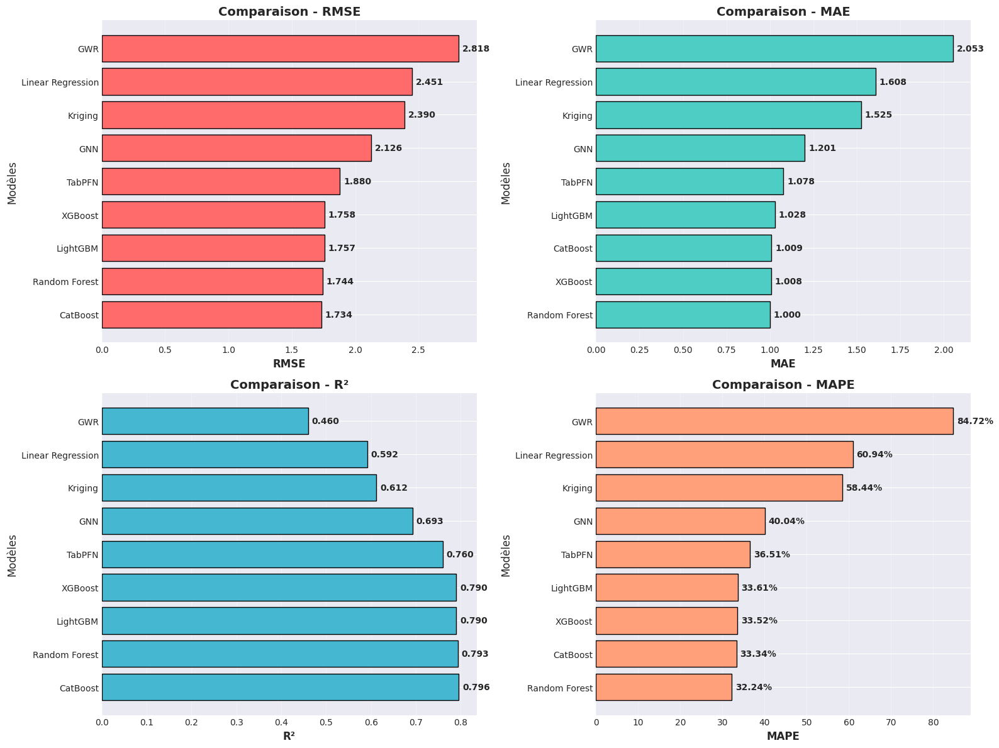

In [ ]:
# Visualisation comparative des performances
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

metrics = ['RMSE', 'MAE', 'R²', 'MAPE']
colors_palette = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A']

for idx, metric in enumerate(metrics):
    ax = axes[idx // 2, idx % 2]

    # Inverser l'ordre pour RMSE, MAE, MAPE (plus petit = meilleur)
    if metric in ['RMSE', 'MAE', 'MAPE']:
        data = test_results.sort_values(metric, ascending=True)
    else:
        data = test_results.sort_values(metric, ascending=False)

    ax.barh(data.index, data[metric], color=colors_palette[idx], edgecolor='black')
    ax.set_xlabel(metric, fontsize=12, fontweight='bold')
    ax.set_ylabel('Modèles', fontsize=12)
    ax.set_title(f'Comparaison - {metric}', fontsize=14, fontweight='bold')
    ax.grid(axis='x', alpha=0.3)

    # Ajouter les valeurs sur les barres
    for i, v in enumerate(data[metric]):
        if metric == 'MAPE':
            ax.text(v + 0.01 * data[metric].max(), i, f'{v:.2f}%',
                   va='center', fontsize=10, fontweight='bold')
        else:
            ax.text(v + 0.01 * data[metric].max(), i, f'{v:.3f}',
                   va='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

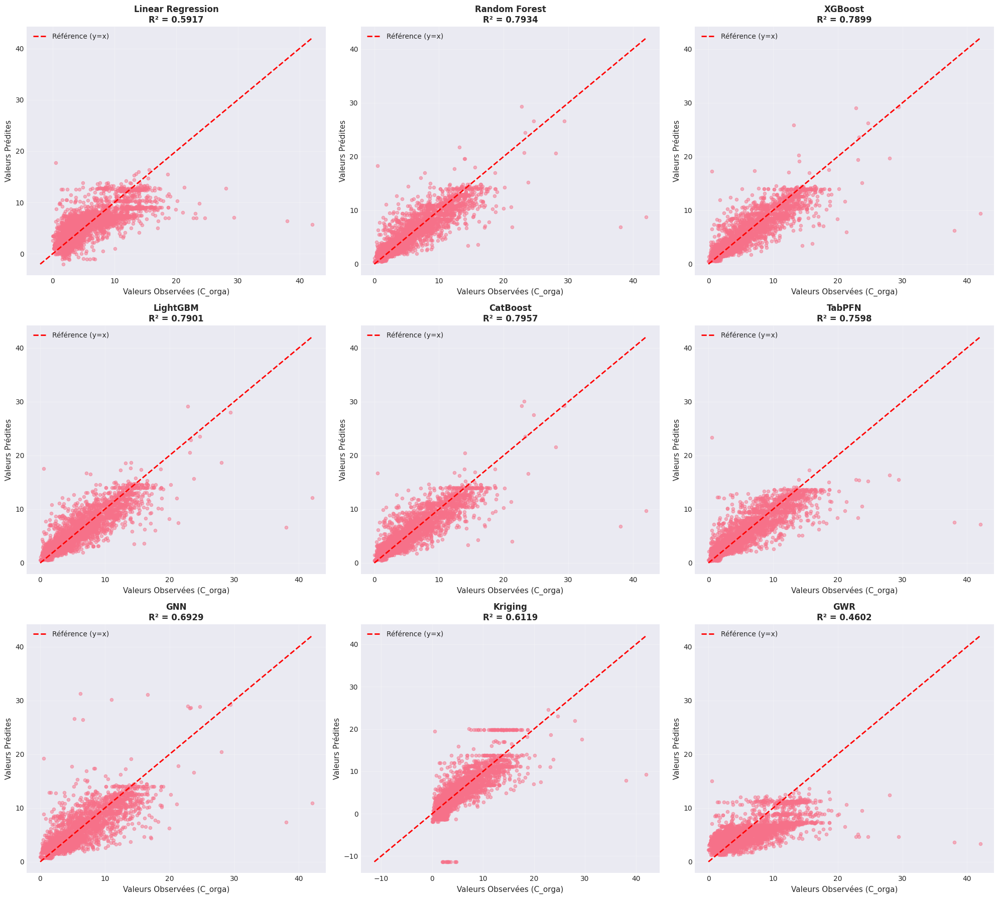

In [ ]:
# Graphiques Prédictions vs Observations pour chaque modèle
fig, axes = plt.subplots(3, 3, figsize=(20, 18))
axes = axes.flatten()

models_data = [
    ('Linear Regression', y_pred_test_lr),
    ('Random Forest', y_pred_test_rf),
]

# Ajouter les modèles avancés s'ils sont disponibles
if xgb_available:
    models_data.append(('XGBoost', y_pred_test_xgb))
if lgbm_available:
    models_data.append(('LightGBM', y_pred_test_lgb))
if catboost_available:
    models_data.append(('CatBoost', y_pred_test_catboost))
if tabpfn_trained:
    models_data.append(('TabPFN', y_pred_test_tabpfn))
if gnn_trained:
    models_data.append(('GNN', y_pred_test_gnn))
if kriging_available:
    models_data.append(('Kriging', y_pred_test_krig))
if gwr_available:
    models_data.append(('GWR', y_pred_test_gwr))

for idx, (model_name, y_pred) in enumerate(models_data):
    if idx < len(axes):
        ax = axes[idx]

        # Scatter plot
        ax.scatter(y_test, y_pred, alpha=0.5, s=20)

        # Ligne de référence (y = x)
        min_val = min(y_test.min(), y_pred.min())
        max_val = max(y_test.max(), y_pred.max())
        ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='Référence (y=x)')

        # Calculer R²
        r2 = r2_score(y_test, y_pred)

        ax.set_xlabel('Valeurs Observées (C_orga)', fontsize=11)
        ax.set_ylabel('Valeurs Prédites', fontsize=11)
        ax.set_title(f'{model_name}\nR² = {r2:.4f}', fontsize=12, fontweight='bold')
        ax.legend()
        ax.grid(alpha=0.3)

# Masquer les axes inutilisés
for idx in range(len(models_data), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

## Phase 8 : Analyse Spatiale des Résidus

Vérification de l'autocorrélation spatiale des erreurs de prédiction.

In [ ]:
# Analyse spatiale des résidus avec Moran's I
try:
    from libpysal.weights import DistanceBand
    from esda.moran import Moran

    print("=" * 80)
    print("ANALYSE SPATIALE DES RÉSIDUS (Test de Moran's I)")
    print("=" * 80)

    if all(col in X_test.columns for col in ['LONGITUDE', 'LATITUDE']):
        # Calculer les résidus pour chaque modèle
        residuals_data = {
            'Linear Regression': y_test - y_pred_test_lr,
            'Random Forest': y_test - y_pred_test_rf,
        }

        if xgb_available:
            residuals_data['XGBoost'] = y_test - y_pred_test_xgb
        if lgbm_available:
            residuals_data['LightGBM'] = y_test - y_pred_test_lgb
        if catboost_available:
            residuals_data['CatBoost'] = y_test - y_pred_test_catboost
        if tabpfn_trained:
            residuals_data['TabPFN'] = y_test - y_pred_test_tabpfn
        if gnn_trained:
            residuals_data['GNN'] = y_test - y_pred_test_gnn
        if kriging_available:
            residuals_data['Kriging'] = y_test - y_pred_test_krig
        if gwr_available:
            residuals_data['GWR'] = y_test - y_pred_test_gwr

        # Créer une matrice de poids spatiaux (distance band)
        coords_test_array = X_test[['LONGITUDE', 'LATITUDE']].values

        # Calculer une distance threshold appropriée
        # Utiliser une distance qui capture environ 8 voisins en moyenne
        print("\n> Création de la matrice de poids spatiaux...")

        # Échantillonner si trop de points (pour accélérer)
        max_points_moran = 1000
        if len(coords_test_array) > max_points_moran:
            print(f"! Sous-échantillonnage à {max_points_moran} points pour Moran's I...")
            sample_idx_moran = np.random.choice(range(len(X_test)), size=max_points_moran, replace=False)
            coords_sample = coords_test_array[sample_idx_moran]
            y_test_sample = y_test.iloc[sample_idx_moran]
        else:
            coords_sample = coords_test_array
            y_test_sample = y_test
            sample_idx_moran = range(len(X_test))

        # Créer la matrice de poids (k-nearest neighbors avec k=8)
        from libpysal.weights import KNN
        w = KNN.from_array(coords_sample, k=8)

        # Calculer Moran's I pour chaque modèle
        moran_results = {}

        for model_name, residuals in residuals_data.items():
            residuals_sample = residuals.iloc[sample_idx_moran].values

            # Calculer Moran's I
            moran = Moran(residuals_sample, w)

            moran_results[model_name] = {
                "Moran's I": moran.I,
                "p-value": moran.p_sim,
                "Expected I": moran.EI,
                "Z-score": moran.z_sim
            }

            print(f"\n> {model_name} :")
            print(f"   Moran's I : {moran.I:.4f}")
            print(f"   Expected I : {moran.EI:.4f}")
            print(f"   Z-score : {moran.z_sim:.4f}")
            print(f"   p-value : {moran.p_sim:.4f}")

            if moran.p_sim < 0.05:
                if moran.I > moran.EI:
                    print(f"   ! Autocorrélation spatiale POSITIVE significative (clustering)")
                else:
                    print(f"   ! Autocorrélation spatiale NÉGATIVE significative (dispersion)")
            else:
                print(f"   Pas d'autocorrélation spatiale significative")

        moran_available = True

    else:
        print("! Colonnes LONGITUDE et LATITUDE nécessaires")
        moran_available = False

except ImportError:
    print("! PySAL n'est pas installé. Installez-le avec : pip install libpysal esda")
    moran_available = False
except Exception as e:
    print(f"! Erreur lors du test de Moran : {str(e)}")
    moran_available = False

ANALYSE SPATIALE DES RÉSIDUS (Test de Moran's I)

> Création de la matrice de poids spatiaux...
! Sous-échantillonnage à 1000 points pour Moran's I...

> Linear Regression :
   Moran's I : 0.3447
   Expected I : -0.0010
   Z-score : 24.9584
   p-value : 0.0010
   ! Autocorrélation spatiale POSITIVE significative (clustering)

> Random Forest :
   Moran's I : 0.0010
   Expected I : -0.0010
   Z-score : 0.1511
   p-value : 0.4260
   Pas d'autocorrélation spatiale significative

> XGBoost :
   Moran's I : -0.0114
   Expected I : -0.0010
   Z-score : -0.7383
   p-value : 0.2200
   Pas d'autocorrélation spatiale significative

> LightGBM :
   Moran's I : -0.0040
   Expected I : -0.0010
   Z-score : -0.2231
   p-value : 0.4230
   Pas d'autocorrélation spatiale significative

> CatBoost :
   Moran's I : -0.0011
   Expected I : -0.0010
   Z-score : -0.0130
   p-value : 0.4990
   Pas d'autocorrélation spatiale significative

> TabPFN :
   Moran's I : 0.0574
   Expected I : -0.0010
   Z-score : 

CARTES DES RÉSIDUS


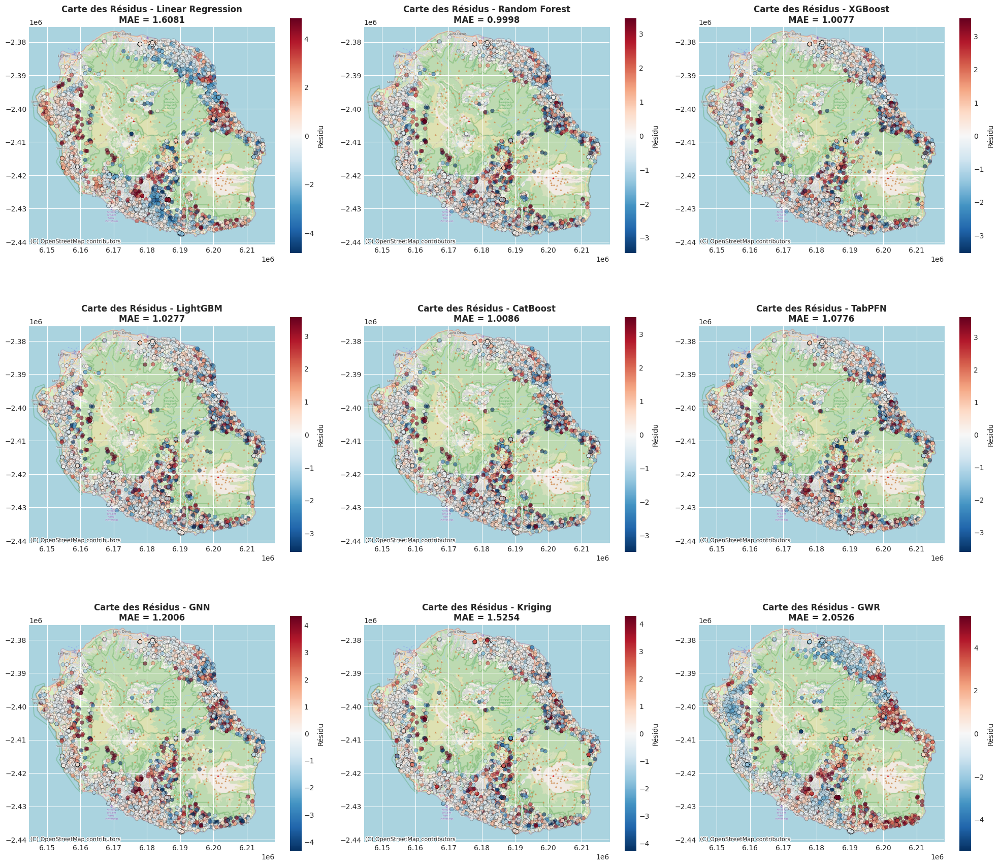

Rouge = Sur-prédiction (modèle prédit trop haut)
Bleu = Sous-prédiction (modèle prédit trop bas)


In [ ]:
# Cartes des résidus pour visualiser les patterns spatiaux avec fond de carte
if all(col in X_test.columns for col in ['LONGITUDE', 'LATITUDE']):
    import contextily as ctx
    from geopandas import GeoDataFrame, points_from_xy

    print("=" * 80)
    print("CARTES DES RÉSIDUS")
    print("=" * 80)

    # Sélectionner les meilleurs modèles pour la visualisation
    models_to_plot = [
        ('Linear Regression', y_pred_test_lr),
        ('Random Forest', y_pred_test_rf),
    ]

    if xgb_available:
        models_to_plot.append(('XGBoost', y_pred_test_xgb))
    if lgbm_available:
        models_to_plot.append(('LightGBM', y_pred_test_lgb))
    if catboost_available:
        models_to_plot.append(('CatBoost', y_pred_test_catboost))
    if tabpfn_trained:
        models_to_plot.append(('TabPFN', y_pred_test_tabpfn))
    if gnn_trained:
        models_to_plot.append(('GNN', y_pred_test_gnn))
    if kriging_available:
        models_to_plot.append(('Kriging', y_pred_test_krig))
    if gwr_available:
        models_to_plot.append(('GWR', y_pred_test_gwr))

    # Limiter à 9 modèles pour la visualisation (3x3 grid)
    models_to_plot = models_to_plot[:9]

    fig, axes = plt.subplots(3, 3, figsize=(20, 18))
    axes = axes.flatten()

    for idx, (model_name, y_pred) in enumerate(models_to_plot):
        residuals = y_test - y_pred

        # Créer un GeoDataFrame avec les résidus
        gdf_residuals = GeoDataFrame(
            X_test.copy(),
            geometry=points_from_xy(X_test['LONGITUDE'], X_test['LATITUDE']),
            crs='EPSG:32740'  # UTM Zone 40S pour La Réunion
        ).to_crs(epsg=3857)

        gdf_residuals['residuals'] = residuals.values

        # Plot avec fond de carte
        gdf_residuals.plot(
            column='residuals',
            ax=axes[idx],
            cmap='RdBu_r',  # Rouge = sur-prédiction, Bleu = sous-prédiction
            markersize=30,
            alpha=0.6,
            edgecolor='black',
            linewidth=0.3,
            vmin=-residuals.abs().quantile(0.95),
            vmax=residuals.abs().quantile(0.95),
            legend=True,
            legend_kwds={'label': 'Résidu', 'shrink': 0.8}
        )

        ctx.add_basemap(axes[idx], source=ctx.providers.OpenStreetMap.Mapnik)
        axes[idx].set_title(f'Carte des Résidus - {model_name}\nMAE = {np.abs(residuals).mean():.4f}',
                           fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()

    print("Rouge = Sur-prédiction (modèle prédit trop haut)")
    print("Bleu = Sous-prédiction (modèle prédit trop bas)")

## Phase 9 : Modèle Ensemble (Stacking naïf)

Combinaison des meilleurs modèles pour améliorer les prédictions.

MODÈLE ENSEMBLE : STACKING MANUEL AVEC TOUS LES MODÈLES

> Construction de la matrice de meta-features...
Modèles avec OOF complet:
   - LinearRegression
   - RandomForest
   - XGBoost
   - LightGBM
   - CatBoost
   - TabPFN (with OOF from CV on subsets)
   - GNN (with true OOF from CV)
   - Kriging (with true OOF from CV)
   - GWR (with true OOF from CV)

Prédictions collectées
   Nombre de modèles: 9
   Modèles: CatBoost, GNN, GWR, Kriging, LightGBM, LinearRegression, RandomForest, TabPFN, XGBoost

Matrice de meta-features construite
   Train shape: (18814, 9)
   Test shape: (4704, 9)
   Modèles utilisés: ['LinearRegression', 'RandomForest', 'XGBoost', 'LightGBM', 'CatBoost', 'TabPFN', 'GNN', 'Kriging', 'GWR']

> Corrélation entre les prédictions des modèles de base (train OOF):


,LinearRegression,RandomForest,XGBoost,LightGBM,CatBoost,TabPFN,GNN,Kriging,GWR
LinearRegression,1.000000,0.857411,0.853486,0.850961,0.852092,0.882707,0.809810,0.746739,0.892538
RandomForest,0.857411,1.000000,0.994512,0.989533,0.990662,0.970603,0.908282,0.872048,0.779908
XGBoost,0.853486,0.994512,1.000000,0.991007,0.991351,0.967353,0.904812,0.869256,0.776817
LightGBM,0.850961,0.989533,0.991007,1.000000,0.988872,0.965957,0.904820,0.865307,0.774879
CatBoost,0.852092,0.990662,0.991351,0.988872,1.000000,0.965554,0.908082,0.865053,0.776293
TabPFN,0.882707,0.970603,0.967353,0.965957,0.965554,1.000000,0.902250,0.856679,0.802772
GNN,0.809810,0.908282,0.904812,0.904820,0.908082,0.902250,1.000000,0.787070,0.715269
Kriging,0.746739,0.872048,0.869256,0.865307,0.865053,0.856679,0.787070,1.000000,0.649425
GWR,0.892538,0.779908,0.776817,0.774879,0.776293,0.802772,0.715269,0.649425,1.000000


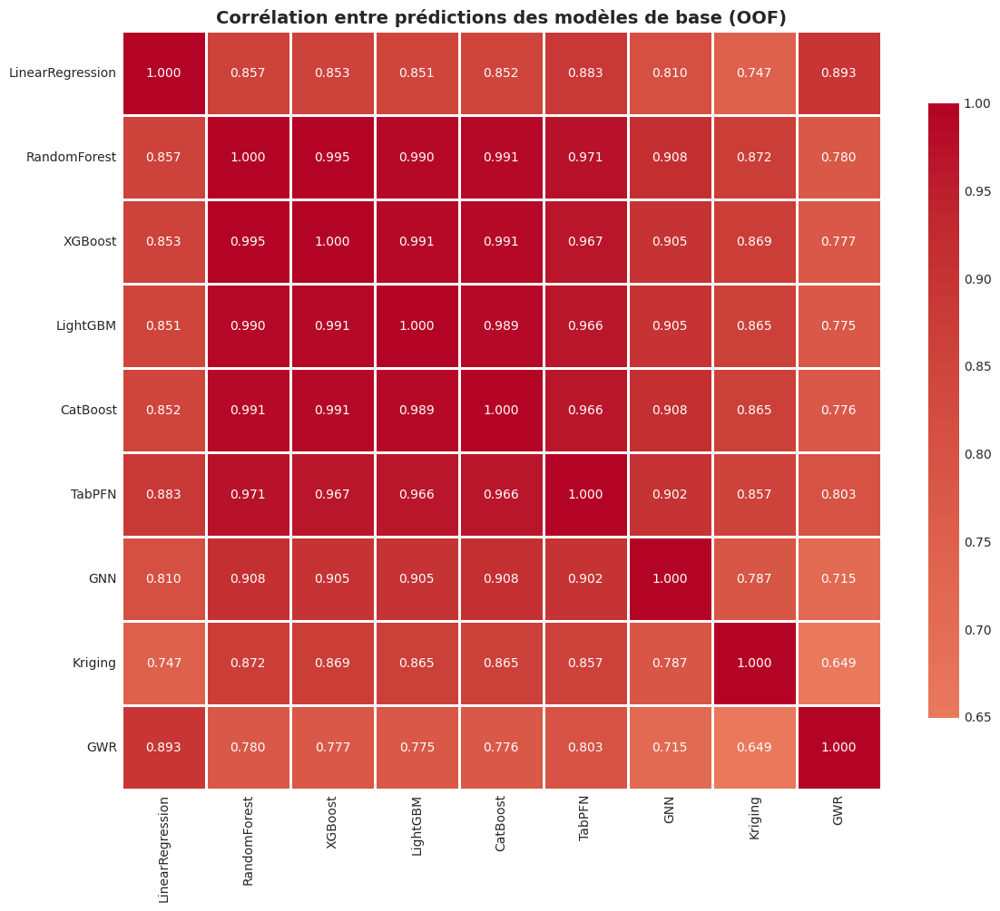


🔬 Définition des meta-learners...
9 meta-learners définis:
   - LinearRegression
   - RidgeCV
   - ElasticNetCV
   - NNLS
   - HuberRegressor
   - RandomForest
   - GradientBoosting
   - LightGBM_Meta
   - CatBoost_Meta

> Loading meta-learners from checkpoint...
✓ Loaded 9 meta-learners from checkpoint

> COMPARAISON DES META-LEARNERS

> Classement des meta-learners :


,RMSE,MAE,R²,MAPE
ElasticNetCV,1.729377,1.001679,0.796750,33.682455
RidgeCV,1.730228,1.003206,0.796550,33.736221
NNLS,1.731276,0.997735,0.796303,33.083293
LinearRegression,1.731292,0.996950,0.796299,32.906872
HuberRegressor,1.737687,1.001313,0.794792,32.830918
LightGBM_Meta,1.792098,1.072836,0.781739,44.521713
CatBoost_Meta,1.815309,1.156457,0.776049,51.556536
RandomForest,1.917112,1.161406,0.750226,39.433145
GradientBoosting,2.324313,1.410803,0.632852,42.888019



>>> Meilleur meta-learner : ElasticNetCV
   R² = 0.7967
   RMSE = 1.7294


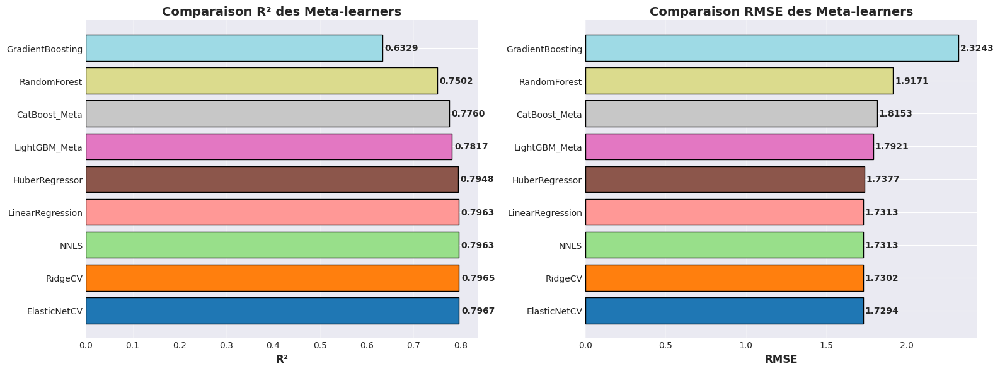


STACKING AVEC TOUS LES MODÈLES DISPONIBLES TERMINÉ


In [ ]:
# Modèle Ensemble : Stacking manuel avec prédictions OOF
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import RidgeCV, ElasticNetCV, HuberRegressor
from scipy.optimize import nnls
import lightgbm as lgb
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV

print("=" * 80)
print("MODÈLE ENSEMBLE : STACKING MANUEL AVEC TOUS LES MODÈLES")
print("=" * 80)

# Define checkpoint path for meta-learners
meta_learners_checkpoint = CHECKPOINT_DIR / 'meta_learners.pkl'

# Créer la matrice des meta-features à partir des prédictions OOF
print("\n> Construction de la matrice de meta-features...")

# Collecter toutes les prédictions OOF disponibles (pour train)
# et les prédictions test pour tous les modèles

oof_predictions_dict = {}
test_predictions_dict = {}

# Modèles avec prédictions OOF complètes via K-Fold CV
print("Modèles avec OOF complet:")
oof_predictions_dict['LinearRegression'] = oof_preds_lr
test_predictions_dict['LinearRegression'] = y_pred_test_lr
print("   - LinearRegression")

oof_predictions_dict['RandomForest'] = oof_preds_rf
test_predictions_dict['RandomForest'] = y_pred_test_rf
print("   - RandomForest")

# Ajouter les modèles gradient boosting si disponibles
if xgb_available:
    oof_predictions_dict['XGBoost'] = oof_preds_xgb
    test_predictions_dict['XGBoost'] = y_pred_test_xgb
    print("   - XGBoost")

if lgbm_available:
    oof_predictions_dict['LightGBM'] = oof_preds_lgb
    test_predictions_dict['LightGBM'] = y_pred_test_lgb
    print("   - LightGBM")

if catboost_available:
    oof_predictions_dict['CatBoost'] = oof_preds_catboost
    test_predictions_dict['CatBoost'] = y_pred_test_catboost
    print("   - CatBoost")

# Ajouter TabPFN si disponible (maintenant avec OOF complet)
if tabpfn_trained and 'oof_preds_tabpfn' in locals():
    oof_predictions_dict['TabPFN'] = oof_preds_tabpfn
    test_predictions_dict['TabPFN'] = test_preds_tabpfn
    print("   - TabPFN (with OOF from CV on subsets)")

# Ajouter GNN si disponible (avec véritable OOF depuis CV)
if gnn_trained and 'oof_preds_gnn' in locals() and 'y_pred_test_gnn' in locals():
    try:
        oof_predictions_dict['GNN'] = oof_preds_gnn
        test_predictions_dict['GNN'] = y_pred_test_gnn
        print("   - GNN (with true OOF from CV)")
    except Exception as e:
        print(f"   ! Erreur GNN: {e}")

# Ajouter Kriging si disponible (avec véritable OOF depuis CV)
if kriging_available and 'oof_preds_kriging' in locals() and 'y_pred_test_krig' in locals():
    try:
        oof_predictions_dict['Kriging'] = oof_preds_kriging
        test_predictions_dict['Kriging'] = y_pred_test_krig
        print("   - Kriging (with true OOF from CV)")
    except Exception as e:
        print(f"   ! Erreur Kriging: {e}")

# Ajouter GWR si disponible (avec véritable OOF depuis CV)
if gwr_available and 'oof_preds_gwr' in locals() and 'y_pred_test_gwr' in locals():
    try:
        oof_predictions_dict['GWR'] = oof_preds_gwr
        test_predictions_dict['GWR'] = y_pred_test_gwr
        print("   - GWR (with true OOF from CV)")
    except Exception as e:
        print(f"   ! Erreur GWR: {e}")

print(f"\nPrédictions collectées")
print(f"   Nombre de modèles: {len(oof_predictions_dict)}")
print(f"   Modèles: {', '.join(sorted(oof_predictions_dict.keys()))}")

# Construire les matrices de meta-features
# IMPORTANT: Train et Test doivent avoir exactement les mêmes colonnes
X_train_meta = pd.DataFrame(oof_predictions_dict, index=y_train.index)

# Pour test, utiliser SEULEMENT les modèles qui sont dans train
X_test_meta = pd.DataFrame({col: test_predictions_dict[col] for col in X_train_meta.columns},
                           index=y_test.index)

print(f"\nMatrice de meta-features construite")
print(f"   Train shape: {X_train_meta.shape}")
print(f"   Test shape: {X_test_meta.shape}")
print(f"   Modèles utilisés: {list(X_train_meta.columns)}")

# Afficher les corrélations entre modèles de base
print(f"\n> Corrélation entre les prédictions des modèles de base (train OOF):")
corr_matrix = X_train_meta.corr()
display(corr_matrix)

# Visualisation de la matrice de corrélation
plt.figure(figsize=(12, 10))
import seaborn as sns
sns.heatmap(corr_matrix, annot=True, fmt='.3f', cmap='coolwarm', center=0,
            square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Corrélation entre prédictions des modèles de base (OOF)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Classe wrapper pour NNLS (Non-Negative Least Squares)
class NNLSRegressor:
    """Non-negative least squares regressor with sklearn interface"""
    def __init__(self):
        self.coef_ = None
        self.intercept_ = 0

    def fit(self, X, y):
        # NNLS requires numpy arrays
        X_np = X.values if hasattr(X, 'values') else X
        y_np = y.values if hasattr(y, 'values') else y

        # Solve NNLS: min ||y - X @ coef||^2 s.t. coef >= 0
        self.coef_, _ = nnls(X_np, y_np)
        return self

    def predict(self, X):
        X_np = X.values if hasattr(X, 'values') else X
        return X_np @ self.coef_ + self.intercept_

# Définir différents meta-learners à comparer
print(f"\n🔬 Définition des meta-learners...")

meta_learners = {
    'LinearRegression': LinearRegression(),
    'RidgeCV': RidgeCV(alphas=np.logspace(-3, 3, 20), cv=5),
    'ElasticNetCV': ElasticNetCV(l1_ratio=[.1, .5, .7, .9, .95, .99, 1],
                                  alphas=np.logspace(-3, 1, 20),
                                  cv=5, max_iter=5000),
    'NNLS': NNLSRegressor(),
    'HuberRegressor': HuberRegressor(epsilon=1.35, max_iter=200),
    'RandomForest': RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42, n_jobs=-1),
    'GradientBoosting': GradientBoostingRegressor(n_estimators=100, max_depth=5, learning_rate=0.1, random_state=42)
}

# Ajouter shallow GBDT (LightGBM et CatBoost avec régularisation forte)
if lgbm_available:
    meta_learners['LightGBM_Meta'] = lgb.LGBMRegressor(
        n_estimators=50,
        max_depth=2,
        learning_rate=0.05,
        reg_alpha=1.0,
        reg_lambda=1.0,
        min_child_samples=20,
        random_state=42,
        n_jobs=-1,
        verbose=-1
    )

if catboost_available:
    meta_learners['CatBoost_Meta'] = CatBoostRegressor(
        iterations=50,
        depth=3,
        learning_rate=0.05,
        l2_leaf_reg=5.0,
        random_state=42,
        verbose=False,
        task_type="CPU",  # Changed from GPU to CPU to avoid hanging
    )

print(f"{len(meta_learners)} meta-learners définis:")
for name in meta_learners.keys():
    print(f"   - {name}")

# Tester chaque meta-learner
stacking_results = {}
stacking_models = {}

# Try to load from checkpoint
if meta_learners_checkpoint.exists():
    print("\n> Loading meta-learners from checkpoint...")

    with open(meta_learners_checkpoint, 'rb') as f:
        checkpoint_data = pickle.load(f)

    stacking_models = checkpoint_data['models']
    stacking_results = checkpoint_data['results']

    # Recreate predictions for visualization
    for meta_name, meta_model in stacking_models.items():
        y_pred_train_meta = meta_model.predict(X_train_meta)
        y_pred_test_meta = meta_model.predict(X_test_meta)

        if meta_name == 'LinearRegression':
            y_pred_train_ensemble = y_pred_train_meta
            y_pred_test_ensemble = y_pred_test_meta

    print(f"✓ Loaded {len(stacking_models)} meta-learners from checkpoint")

else:
    print("\n> Training all meta-learners from scratch...")

    for meta_name, meta_model in meta_learners.items():
        print(f"\n{'='*80}")
        print(f"> Entraînement du meta-learner: {meta_name}")
        print(f"{'='*80}")

        # Entraînement sur les prédictions OOF
        print(f"> Entraînement sur les prédictions out-of-fold...")
        start_time = time.time()
        meta_model.fit(X_train_meta, y_train)
        train_time = time.time() - start_time

        print(f">Temps d'entraînement : {train_time:.2f} secondes")

        # Prédictions
        y_pred_train_meta = meta_model.predict(X_train_meta)
        y_pred_test_meta = meta_model.predict(X_test_meta)

        # Évaluation
        print("\n> Performance sur le Train Set (OOF-based) :")
        train_metrics = evaluate_model(y_train, y_pred_train_meta, f"Stacking-{meta_name} - Train")

        print("\n>Performance sur le Test Set :")
        test_metrics = evaluate_model(y_test, y_pred_test_meta, f"Stacking-{meta_name} - Test")

        # Sauvegarder les résultats
        results[f'Stacking-{meta_name} (Train)'] = train_metrics
        results[f'Stacking-{meta_name} (Test)'] = test_metrics
        stacking_results[meta_name] = test_metrics
        stacking_models[meta_name] = meta_model

        # Sauvegarder les prédictions du meilleur modèle pour les visualisations
        if meta_name == 'LinearRegression':
            y_pred_train_ensemble = y_pred_train_meta
            y_pred_test_ensemble = y_pred_test_meta

        # Afficher les poids du meta-learner si disponible
        if hasattr(meta_model, 'coef_'):
            print(f"\n> Poids du meta-learner {meta_name}:")
            weights_df = pd.DataFrame({
                'Modèle': X_train_meta.columns,
                'Poids': meta_model.coef_
            }).sort_values('Poids', ascending=False)
            display(weights_df)

    # Save checkpoint after all meta-learners are trained
    print("\n> Saving meta-learners checkpoint...")
    with open(meta_learners_checkpoint, 'wb') as f:
        pickle.dump({
            'models': stacking_models,
            'results': stacking_results
        }, f)
    print("✓ Checkpoint saved successfully")

# Comparaison des meta-learners (commune que les modèles soient chargés ou entraînés)
print(f"\n{'='*80}")
print("> COMPARAISON DES META-LEARNERS")
print(f"{'='*80}")

meta_comparison = pd.DataFrame(stacking_results).T
meta_comparison = meta_comparison.sort_values('R²', ascending=False)

print("\n> Classement des meta-learners :")
display(meta_comparison)

best_meta = meta_comparison.index[0]
print(f"\n>>> Meilleur meta-learner : {best_meta}")
print(f"   R² = {meta_comparison.loc[best_meta, 'R²']:.4f}")
print(f"   RMSE = {meta_comparison.loc[best_meta, 'RMSE']:.4f}")

# Visualisation comparative des meta-learners
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Graphique 1 : R² comparison
ax = axes[0]
colors_meta = plt.cm.tab20(np.linspace(0, 1, len(meta_comparison)))
ax.barh(meta_comparison.index, meta_comparison['R²'], color=colors_meta, edgecolor='black')
ax.set_xlabel('R²', fontsize=12, fontweight='bold')
ax.set_title('Comparaison R² des Meta-learners', fontsize=14, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
for i, v in enumerate(meta_comparison['R²']):
    ax.text(v + 0.005, i, f'{v:.4f}', va='center', fontsize=10, fontweight='bold')

# Graphique 2 : RMSE comparison
ax = axes[1]
ax.barh(meta_comparison.sort_values('RMSE').index,
        meta_comparison.sort_values('RMSE')['RMSE'],
        color=colors_meta, edgecolor='black')
ax.set_xlabel('RMSE', fontsize=12, fontweight='bold')
ax.set_title('Comparaison RMSE des Meta-learners', fontsize=14, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
for i, (idx, v) in enumerate(meta_comparison.sort_values('RMSE')['RMSE'].items()):
    ax.text(v + 0.01, i, f'{v:.4f}', va='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n" + "="*80)
print("STACKING AVEC TOUS LES MODÈLES DISPONIBLES TERMINÉ")
print("="*80)

In [ ]:
# Finetuning de TOUS les meta-learners avec Optuna
import optuna
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler

print("=" * 80)
print("FINETUNING DE TOUS LES META-LEARNERS")
print("=" * 80)

# Define checkpoint paths for finetuned models
finetuned_checkpoint = CHECKPOINT_DIR / 'finetuned_meta_learners.pkl'
finetuned_studies_checkpoint = CHECKPOINT_DIR / 'finetuned_studies.pkl'
scaler_meta_checkpoint = CHECKPOINT_DIR / 'scaler_meta.pkl'

# Try to load from checkpoint
if finetuned_checkpoint.exists() and finetuned_studies_checkpoint.exists() and scaler_meta_checkpoint.exists():
    print("\n> Loading finetuned meta-learners from checkpoint...")

    with open(finetuned_checkpoint, 'rb') as f:
        checkpoint_data = pickle.load(f)
        finetuned_models = checkpoint_data['models']
        finetuned_results = checkpoint_data['results']

    with open(finetuned_studies_checkpoint, 'rb') as f:
        all_studies = pickle.load(f)

    with open(scaler_meta_checkpoint, 'rb') as f:
        scaler_meta = pickle.load(f)

    # Transform meta-features with loaded scaler
    X_train_meta_scaled = pd.DataFrame(
        scaler_meta.transform(X_train_meta),
        columns=X_train_meta.columns,
        index=X_train_meta.index
    )
    X_test_meta_scaled = pd.DataFrame(
        scaler_meta.transform(X_test_meta),
        columns=X_test_meta.columns,
        index=X_test_meta.index
    )

    # Add results to main results dict
    for model_name, metrics in checkpoint_data['train_results'].items():
        results[model_name] = metrics
    for model_name, metrics in checkpoint_data['test_results'].items():
        results[model_name] = metrics

    print("✓ Finetuned meta-learners loaded successfully from checkpoint")
    print(f"   Loaded {len(finetuned_models)} finetuned models")

else:
    print("\n> Training finetuned meta-learners from scratch...")

    # Scaler pour les meta-features (important pour HuberRegressor)
    scaler_meta = StandardScaler()
    X_train_meta_scaled = pd.DataFrame(
        scaler_meta.fit_transform(X_train_meta),
        columns=X_train_meta.columns,
        index=X_train_meta.index
    )
    X_test_meta_scaled = pd.DataFrame(
        scaler_meta.transform(X_test_meta),
        columns=X_test_meta.columns,
        index=X_test_meta.index
    )

    print(f"\n> Meta-features scaled for robust optimization")
    print(f"   Train shape: {X_train_meta_scaled.shape}")
    print(f"   Test shape: {X_test_meta_scaled.shape}")

    # Optuna callback pour verbose modéré
    optuna.logging.set_verbosity(optuna.logging.WARNING)

    finetuned_results = {}
    finetuned_models = {}
    all_studies = {}

    # Finetuner tous les meta-learners (pas seulement les top 3)
    for meta_name in meta_learners.keys():
        print(f"\n{'='*80}")
        print(f"> Finetuning: {meta_name}")
        print(f"{'='*80}")

        # Décider si on utilise les features scalées ou non
        use_scaled = meta_name in ['HuberRegressor', 'ElasticNetCV', 'RidgeCV']
        X_train_opt = X_train_meta_scaled if use_scaled else X_train_meta
        X_test_opt = X_test_meta_scaled if use_scaled else X_test_meta

        if use_scaled:
            print(f"✓ Using scaled features for {meta_name}")

        # Définir la fonction objectif pour chaque type de modèle
        def objective(trial):
            try:
                if meta_name == 'RandomForest':
                    params = {
                        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
                        'max_depth': trial.suggest_int('max_depth', 3, 20),
                        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
                        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
                        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
                        'random_state': 42,
                        'n_jobs': -1
                    }
                    model = RandomForestRegressor(**params)

                elif meta_name == 'GradientBoosting':
                    params = {
                        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
                        'max_depth': trial.suggest_int('max_depth', 2, 10),
                        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
                        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
                        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
                        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
                        'random_state': 42
                    }
                    model = GradientBoostingRegressor(**params)

                elif meta_name == 'LightGBM_Meta' and lgbm_available:
                    params = {
                        'n_estimators': trial.suggest_int('n_estimators', 30, 200),
                        'max_depth': trial.suggest_int('max_depth', 2, 8),
                        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
                        'reg_alpha': trial.suggest_float('reg_alpha', 0.1, 5.0),
                        'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 5.0),
                        'min_child_samples': trial.suggest_int('min_child_samples', 5, 50),
                        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
                        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
                        'random_state': 42,
                        'n_jobs': 1,
                        'verbose': -1
                    }
                    model = lgb.LGBMRegressor(**params)

                elif meta_name == 'CatBoost_Meta' and catboost_available:
                    params = {
                        'iterations': trial.suggest_int('iterations', 30, 200),
                        'depth': trial.suggest_int('depth', 2, 8),
                        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
                        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1.0, 10.0),
                        'random_state': 42,
                        'verbose': False,
                        'task_type': 'CPU',
                    }
                    model = CatBoostRegressor(**params)

                elif meta_name == 'HuberRegressor':
                    params = {
                        'epsilon': trial.suggest_float('epsilon', 1.1, 3.0),
                        'alpha': trial.suggest_float('alpha', 1e-5, 0.1, log=True),
                        'max_iter': trial.suggest_int('max_iter', 500, 2000),
                        'tol': trial.suggest_float('tol', 1e-6, 1e-3, log=True)
                    }
                    model = HuberRegressor(**params)

                elif meta_name == 'RidgeCV':
                    # RidgeCV already has built-in CV, optimize alphas range
                    alphas = np.logspace(
                        trial.suggest_float('log_alpha_min', -4, 0),
                        trial.suggest_float('log_alpha_max', 0, 4),
                        20
                    )
                    model = RidgeCV(alphas=alphas, cv=META_CV_FOLDS)

                elif meta_name == 'ElasticNetCV':
                    # ElasticNetCV already has built-in CV
                    l1_ratio = [0.1, 0.3, 0.5, 0.7, 0.9, 0.95, 0.99]
                    alphas = np.logspace(
                        trial.suggest_float('log_alpha_min', -4, 1),
                        trial.suggest_float('log_alpha_max', -1, 2),
                        20
                    )
                    model = ElasticNetCV(
                        l1_ratio=l1_ratio,
                        alphas=alphas,
                        cv=META_CV_FOLDS,
                        max_iter=trial.suggest_int('max_iter', 2000, 10000)
                    )

                elif meta_name == 'NNLS':
                    # NNLS has no hyperparameters, skip optimization
                    return None

                elif meta_name == 'LinearRegression':
                    # LinearRegression has no hyperparameters, skip optimization
                    return None

                else:
                    return None
            # Cross-validation score
                scores = cross_val_score(
                    model, X_train_opt, y_train,
                    cv=META_CV_FOLDS,
                    scoring='r2',
                    n_jobs=-1
                )
                return scores.mean()

            except Exception as e:
                print(f"   ! Trial failed: {str(e)[:100]}")
                return -999  # Return very bad score for failed trials

        # Skip optimization for models without hyperparameters
        if meta_name in ['LinearRegression', 'NNLS']:
            print(f"> {meta_name} has no hyperparameters, using original model")
            best_model = stacking_models[meta_name]
            optim_time = 0
            all_studies[meta_name] = None

        # Skip optimization for models with built-in CV that are already optimal
        elif meta_name in ['RidgeCV', 'ElasticNetCV']:
            print(f"> Optimizing CV parameters for {meta_name}...")

            study = optuna.create_study(
                direction='maximize',
                study_name=f'meta_{meta_name}',
                sampler=optuna.samplers.TPESampler(seed=42)
            )

            start_time = time.time()
            study.optimize(
                objective,
                n_trials=N_TRIALS_META_LEARNERS,
                show_progress_bar=True,
                n_jobs=1  # Sequential to avoid conflicts
            )
            optim_time = time.time() - start_time

            all_studies[meta_name] = study

            # Rebuild best model
            if meta_name == 'RidgeCV':
                best_params = study.best_params
                alphas = np.logspace(best_params['log_alpha_min'], best_params['log_alpha_max'], 20)
                best_model = RidgeCV(alphas=alphas, cv=META_CV_FOLDS)
            else:  # ElasticNetCV
                best_params = study.best_params
                alphas = np.logspace(best_params['log_alpha_min'], best_params['log_alpha_max'], 20)
                l1_ratio = [0.1, 0.3, 0.5, 0.7, 0.9, 0.95, 0.99]
                best_model = ElasticNetCV(
                    l1_ratio=l1_ratio,
                    alphas=alphas,
                    cv=META_CV_FOLDS,
                    max_iter=best_params['max_iter']
                )

            best_model.fit(X_train_opt, y_train)
            print(f"\nBest CV R² score: {study.best_value:.4f}")
            print(f">Optimization time: {optim_time:.2f}s")

        else:
            # Full Optuna optimization for other models
            print(f"> Optuna optimization for {meta_name}...")

            study = optuna.create_study(
                direction='maximize',
                study_name=f'meta_{meta_name}',
                sampler=optuna.samplers.TPESampler(seed=42)
            )

            start_time = time.time()
            study.optimize(
                objective,
                n_trials=N_TRIALS_META_LEARNERS,
                show_progress_bar=True,
                n_jobs=1  # Sequential to avoid conflicts
            )
            optim_time = time.time() - start_time

            all_studies[meta_name] = study

            print(f"\nBest CV R² score: {study.best_value:.4f}")
            print(f"   Best parameters: {study.best_params}")
            print(f">Optimization time: {optim_time:.2f}s")

            # Train best model on full training data
            best_params = study.best_params

            if meta_name == 'RandomForest':
                best_model = RandomForestRegressor(**best_params, random_state=42, n_jobs=-1)
            elif meta_name == 'GradientBoosting':
                best_model = GradientBoostingRegressor(**best_params, random_state=42)
            elif meta_name == 'LightGBM_Meta':
                best_model = lgb.LGBMRegressor(**best_params, random_state=42, n_jobs=-1, verbose=-1)
            elif meta_name == 'CatBoost_Meta':
                best_model = CatBoostRegressor(**best_params, random_state=42, verbose=False)
            elif meta_name == 'HuberRegressor':
                best_model = HuberRegressor(**best_params)

            best_model.fit(X_train_opt, y_train)

        # Évaluation du modèle finetuné
        y_pred_train_tuned = best_model.predict(X_train_opt)
        y_pred_test_tuned = best_model.predict(X_test_opt)

        print("\n> Performance après finetuning (Train):")
        train_metrics = evaluate_model(y_train, y_pred_train_tuned, f"{meta_name}-Tuned - Train")

        print("\n>Performance après finetuning (Test):")
        test_metrics = evaluate_model(y_test, y_pred_test_tuned, f"{meta_name}-Tuned - Test")

        # Sauvegarder
        finetuned_results[f'{meta_name}-Tuned'] = test_metrics
        finetuned_models[f'{meta_name}-Tuned'] = best_model
        results[f'Stacking-{meta_name}-Tuned (Train)'] = train_metrics
        results[f'Stacking-{meta_name}-Tuned (Test)'] = test_metrics

        # Comparaison avant/après
        original_r2 = stacking_results[meta_name]['R²']
        tuned_r2 = test_metrics['R²']
        improvement = ((tuned_r2 - original_r2) / original_r2) * 100

        print(f"\n> Amélioration:")
        print(f"   Original R²: {original_r2:.4f}")
        print(f"   Tuned R²: {tuned_r2:.4f}")
        print(f"   Changement: {improvement:+.2f}%")

        # Save checkpoint after each model
        print(f"\n> Saving checkpoint for {meta_name}...")
        with open(finetuned_checkpoint, 'wb') as f:
            pickle.dump({
                'models': finetuned_models,
                'results': finetuned_results,
                'train_results': {k: v for k, v in results.items() if 'Tuned (Train)' in k},
                'test_results': {k: v for k, v in results.items() if 'Tuned (Test)' in k}
            }, f)

        with open(finetuned_studies_checkpoint, 'wb') as f:
            pickle.dump(all_studies, f)

        with open(scaler_meta_checkpoint, 'wb') as f:
            pickle.dump(scaler_meta, f)

        print(f"✓ Checkpoint saved after training {meta_name}")

# Comparaison finale
print(f"\n{'='*80}")
print("> COMPARAISON FINALE : ORIGINAL VS FINETUNED (TOUS LES MODÈLES)")
print(f"{'='*80}")

final_comparison = pd.DataFrame({**stacking_results, **finetuned_results}).T
final_comparison = final_comparison.sort_values('R²', ascending=False)

print(f"\n>Classement final (tous les {len(final_comparison)} meta-learners):")
display(final_comparison)

best_model_final = final_comparison.index[0]
best_r2_final = final_comparison.loc[best_model_final, 'R²']
best_rmse_final = final_comparison.loc[best_model_final, 'RMSE']

print(f"\n> MEILLEUR META-LEARNER FINAL: {best_model_final}")
print(f"   R² = {best_r2_final:.4f}")
print(f"   RMSE = {best_rmse_final:.4f}")

print("\n" + "="*80)
print("FINETUNING AVEC OPTUNA TERMINÉ POUR TOUS LES META-LEARNERS")
print("="*80)
print(f"\n> Modèles optimisés: {len([k for k in all_studies.keys() if all_studies[k] is not None])}")
print(f"> Trials par modèle: {N_TRIALS_META_LEARNERS}")
print(f"> CV folds: {META_CV_FOLDS}")

FINETUNING DE TOUS LES META-LEARNERS

> Loading finetuned meta-learners from checkpoint...


✓ Finetuned meta-learners loaded successfully from checkpoint
   Loaded 9 finetuned models

> COMPARAISON FINALE : ORIGINAL VS FINETUNED (TOUS LES MODÈLES)

>Classement final (tous les 18 meta-learners):


,RMSE,MAE,R²,MAPE
ElasticNetCV,1.729377,1.001679,0.796750,33.682455
RandomForest-Tuned,1.729590,1.005671,0.796700,34.462349
RidgeCV-Tuned,1.730186,0.997029,0.796559,32.917036
RidgeCV,1.730228,1.003206,0.796550,33.736221
NNLS-Tuned,1.731276,0.997735,0.796303,33.083293
NNLS,1.731276,0.997735,0.796303,33.083293
LinearRegression,1.731292,0.996950,0.796299,32.906872
LinearRegression-Tuned,1.731304,0.996953,0.796297,32.906547
ElasticNetCV-Tuned,1.733425,1.013352,0.795797,34.738460
HuberRegressor,1.737687,1.001313,0.794792,32.830918



> MEILLEUR META-LEARNER FINAL: ElasticNetCV
   R² = 0.7967
   RMSE = 1.7294

FINETUNING AVEC OPTUNA TERMINÉ POUR TOUS LES META-LEARNERS

> Modèles optimisés: 7
> Trials par modèle: 50
> CV folds: 3


## Dataviz

> VISUALISATION 1: COMPARAISON ORIGINAL VS FINETUNED


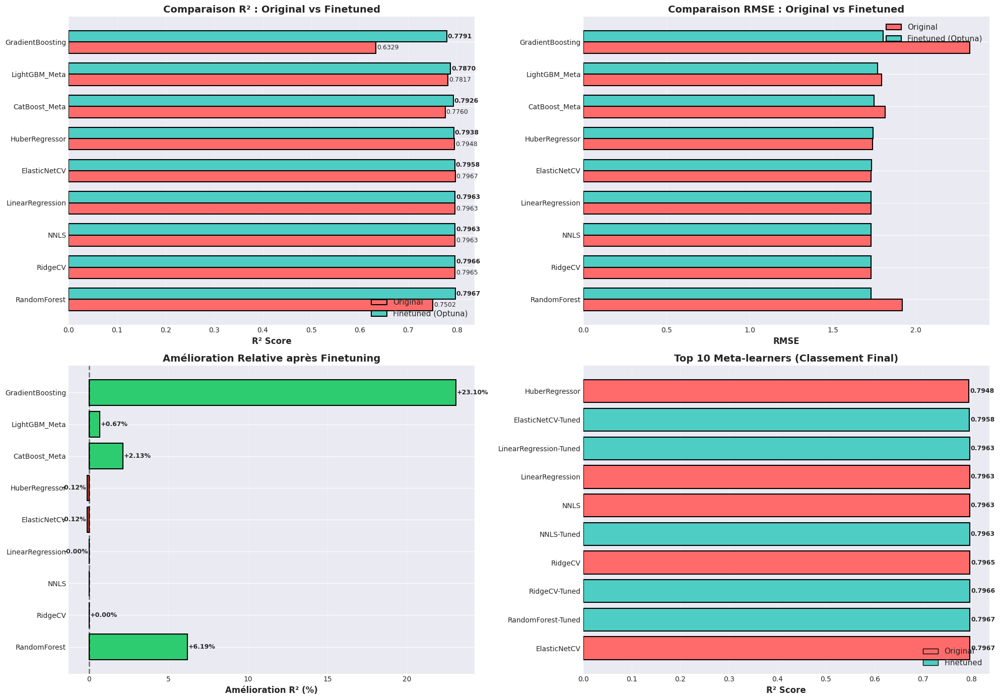


Visualisation 1 terminée
   9 modèles comparés
   Meilleure amélioration: 23.10%
   Amélioration moyenne: 3.54%


In [ ]:
# Visualisation 1: Comparaison Original vs Tuned (barplot interactif)
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("=" * 80)
print("> VISUALISATION 1: COMPARAISON ORIGINAL VS FINETUNED")
print("=" * 80)

# Préparer les données pour la visualisation
original_models = sorted([k for k in stacking_results.keys()])
tuned_models = sorted([k for k in finetuned_results.keys()])

# Créer un DataFrame pour la comparaison
comparison_data = []
for model_name in original_models:
    original_r2 = stacking_results[model_name]['R²']
    original_rmse = stacking_results[model_name]['RMSE']

    tuned_name = f"{model_name}-Tuned"
    if tuned_name in finetuned_results:
        tuned_r2 = finetuned_results[tuned_name]['R²']
        tuned_rmse = finetuned_results[tuned_name]['RMSE']
        improvement = ((tuned_r2 - original_r2) / original_r2) * 100
    else:
        tuned_r2 = original_r2
        tuned_rmse = original_rmse
        improvement = 0

    comparison_data.append({
        'Model': model_name,
        'Original_R2': original_r2,
        'Tuned_R2': tuned_r2,
        'Original_RMSE': original_rmse,
        'Tuned_RMSE': tuned_rmse,
        'Improvement_%': improvement
    })

comparison_df = pd.DataFrame(comparison_data).sort_values('Tuned_R2', ascending=False)

# Graphique 1: Comparaison R² (horizontal bars)
fig, axes = plt.subplots(2, 2, figsize=(20, 14))

# Subplot 1: R² Comparison
ax = axes[0, 0]
x = np.arange(len(comparison_df))
width = 0.35

bars1 = ax.barh(x - width/2, comparison_df['Original_R2'], width,
                label='Original', color='#FF6B6B', edgecolor='black', linewidth=1.5)
bars2 = ax.barh(x + width/2, comparison_df['Tuned_R2'], width,
                label='Finetuned (Optuna)', color='#4ECDC4', edgecolor='black', linewidth=1.5)

ax.set_yticks(x)
ax.set_yticklabels(comparison_df['Model'])
ax.set_xlabel('R² Score', fontsize=12, fontweight='bold')
ax.set_title('Comparaison R² : Original vs Finetuned', fontsize=14, fontweight='bold')
ax.legend(loc='lower right', fontsize=11)
ax.grid(axis='x', alpha=0.3)

# Ajouter les valeurs sur les barres
for i, (orig, tuned) in enumerate(zip(comparison_df['Original_R2'], comparison_df['Tuned_R2'])):
    ax.text(orig + 0.002, i - width/2, f'{orig:.4f}', va='center', fontsize=9)
    ax.text(tuned + 0.002, i + width/2, f'{tuned:.4f}', va='center', fontsize=9, fontweight='bold')

# Subplot 2: RMSE Comparison
ax = axes[0, 1]
bars1 = ax.barh(x - width/2, comparison_df['Original_RMSE'], width,
                label='Original', color='#FF6B6B', edgecolor='black', linewidth=1.5)
bars2 = ax.barh(x + width/2, comparison_df['Tuned_RMSE'], width,
                label='Finetuned (Optuna)', color='#4ECDC4', edgecolor='black', linewidth=1.5)

ax.set_yticks(x)
ax.set_yticklabels(comparison_df['Model'])
ax.set_xlabel('RMSE', fontsize=12, fontweight='bold')
ax.set_title('Comparaison RMSE : Original vs Finetuned', fontsize=14, fontweight='bold')
ax.legend(loc='upper right', fontsize=11)
ax.grid(axis='x', alpha=0.3)

# Subplot 3: Improvement Percentage
ax = axes[1, 0]
colors_improvement = ['#2ECC71' if x > 0 else '#E74C3C' if x < 0 else '#95A5A6'
                      for x in comparison_df['Improvement_%']]
bars = ax.barh(comparison_df['Model'], comparison_df['Improvement_%'],
               color=colors_improvement, edgecolor='black', linewidth=1.5)
ax.set_xlabel('Amélioration R² (%)', fontsize=12, fontweight='bold')
ax.set_title('Amélioration Relative après Finetuning', fontsize=14, fontweight='bold')
ax.axvline(x=0, color='black', linestyle='--', linewidth=2, alpha=0.5)
ax.grid(axis='x', alpha=0.3)

for i, v in enumerate(comparison_df['Improvement_%']):
    if v != 0:
        ax.text(v + (0.05 if v > 0 else -0.05), i, f'{v:+.2f}%',
                va='center', ha='left' if v > 0 else 'right', fontsize=9, fontweight='bold')

# Subplot 4: Final Ranking (Top 10)
ax = axes[1, 1]
top_10 = final_comparison.head(10)
colors_rank = ['#4ECDC4' if '-Tuned' in name else '#FF6B6B' for name in top_10.index]
bars = ax.barh(range(len(top_10)), top_10['R²'], color=colors_rank,
               edgecolor='black', linewidth=1.5)
ax.set_yticks(range(len(top_10)))
ax.set_yticklabels(top_10.index)
ax.set_xlabel('R² Score', fontsize=12, fontweight='bold')
ax.set_title('Top 10 Meta-learners (Classement Final)', fontsize=14, fontweight='bold')
ax.grid(axis='x', alpha=0.3)

# Ajouter les valeurs
for i, (name, r2) in enumerate(zip(top_10.index, top_10['R²'])):
    ax.text(r2 + 0.002, i, f'{r2:.4f}', va='center', fontsize=9, fontweight='bold')

# Légende
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#FF6B6B', edgecolor='black', label='Original'),
    Patch(facecolor='#4ECDC4', edgecolor='black', label='Finetuned')
]
ax.legend(handles=legend_elements, loc='lower right', fontsize=11)

plt.tight_layout()
plt.show()

print("\nVisualisation 1 terminée")
print(f"   {len(comparison_df)} modèles comparés")
print(f"   Meilleure amélioration: {comparison_df['Improvement_%'].max():.2f}%")
print(f"   Amélioration moyenne: {comparison_df['Improvement_%'].mean():.2f}%")

> VISUALISATION 2: HISTORIQUE D'OPTIMISATION OPTUNA


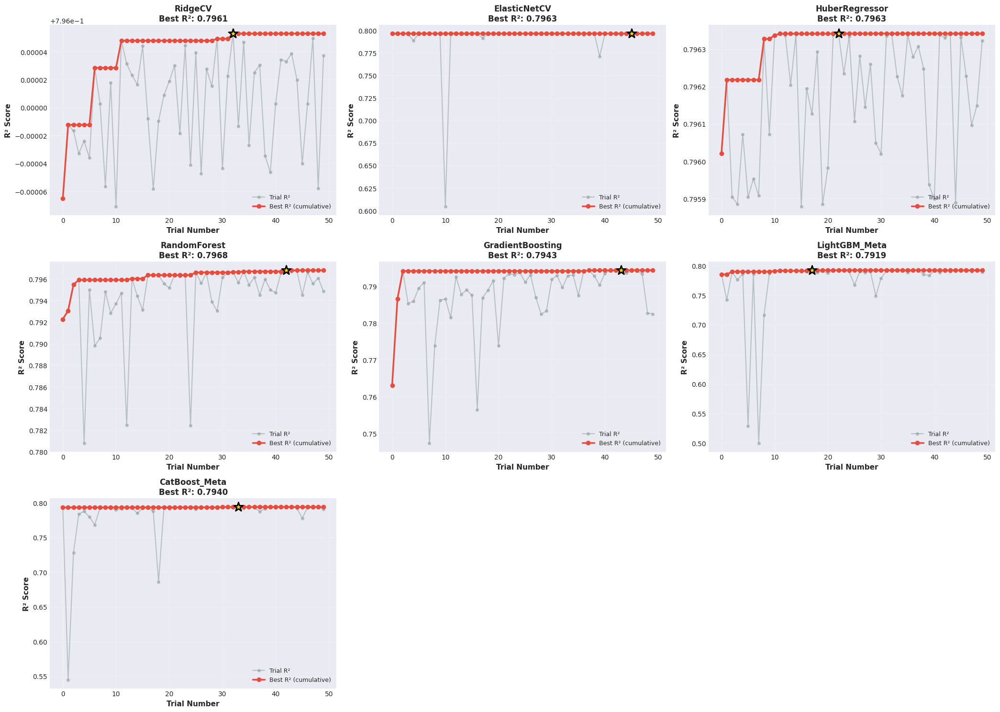


Visualisation 2 terminée
   7 études Optuna visualisées
   Trials par étude: 50


In [ ]:
# Visualisation 2: Historique d'optimisation Optuna pour chaque modèle
print("=" * 80)
print("> VISUALISATION 2: HISTORIQUE D'OPTIMISATION OPTUNA")
print("=" * 80)

# Créer une grille de subplots pour les études Optuna
studies_with_data = {k: v for k, v in all_studies.items() if v is not None}
n_studies = len(studies_with_data)

if n_studies > 0:
    # Calculer la grille optimale
    n_cols = min(3, n_studies)
    n_rows = (n_studies + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(7*n_cols, 5*n_rows))
    if n_studies == 1:
        axes = np.array([axes])
    axes = axes.flatten() if n_studies > 1 else axes

    for idx, (model_name, study) in enumerate(studies_with_data.items()):
        ax = axes[idx]

        # Extraire les valeurs des trials
        trials_values = [trial.value for trial in study.trials if trial.value is not None]
        trials_numbers = [trial.number for trial in study.trials if trial.value is not None]

        # Calculer le meilleur score cumulatif
        best_so_far = []
        current_best = -float('inf')
        for val in trials_values:
            current_best = max(current_best, val)
            best_so_far.append(current_best)

        # Plot
        ax.plot(trials_numbers, trials_values, 'o-', alpha=0.6, label='Trial R²',
                color='#95A5A6', markersize=4)
        ax.plot(trials_numbers, best_so_far, 'o-', linewidth=2.5, label='Best R² (cumulative)',
                color='#E74C3C', markersize=6)

        ax.set_xlabel('Trial Number', fontsize=11, fontweight='bold')
        ax.set_ylabel('R² Score', fontsize=11, fontweight='bold')
        ax.set_title(f'{model_name}\nBest R²: {study.best_value:.4f}',
                     fontsize=12, fontweight='bold')
        ax.legend(loc='lower right', fontsize=9)
        ax.grid(alpha=0.3)

        # Highlight best trial
        best_trial_number = study.best_trial.number
        best_value = study.best_value
        ax.scatter([best_trial_number], [best_value], color='gold', s=200,
                   marker='*', edgecolors='black', linewidths=2, zorder=5,
                   label='Best Trial')

    # Masquer les axes vides
    for idx in range(n_studies, len(axes)):
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

    print(f"\nVisualisation 2 terminée")
    print(f"   {n_studies} études Optuna visualisées")
    print(f"   Trials par étude: {N_TRIALS_META_LEARNERS}")
else:
    print("ℹ> Aucune étude Optuna à visualiser")

> VISUALISATION 3: IMPORTANCE DES HYPERPARAMÈTRES


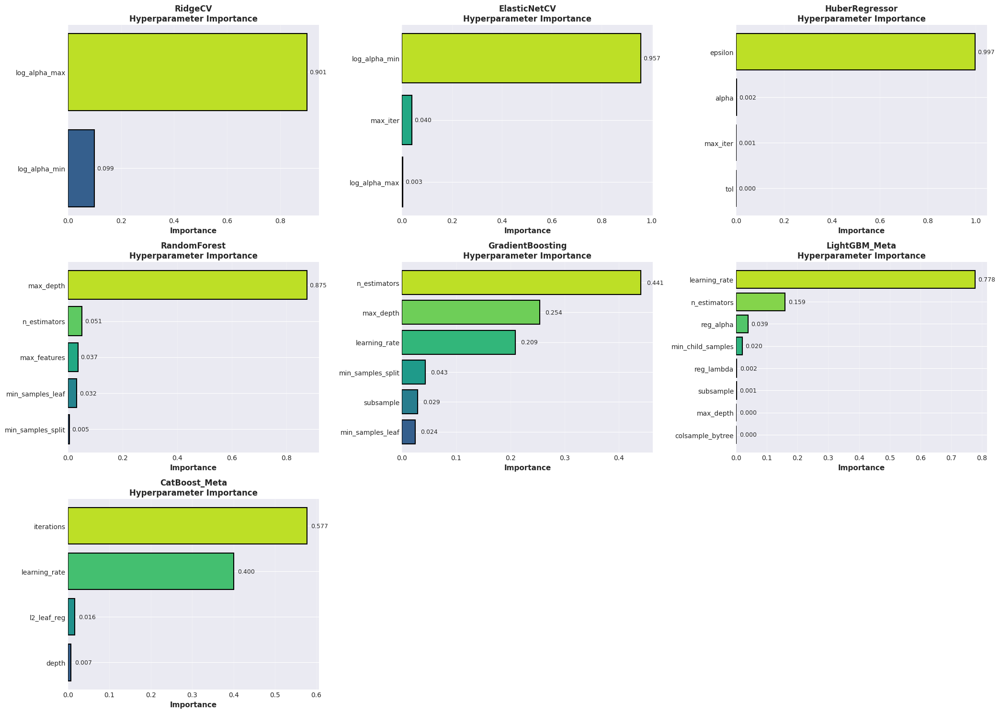

In [ ]:
# Visualisation 3: Importance des hyperparamètres (Optuna)
print("=" * 80)
print("> VISUALISATION 3: IMPORTANCE DES HYPERPARAMÈTRES")
print("=" * 80)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(7*n_cols, 5*n_rows))
if n_studies == 1:
    axes = np.array([axes])
axes = axes.flatten() if n_studies > 1 else axes

for idx, (model_name, study) in enumerate(studies_with_data.items()):
    ax = axes[idx]

    try:
        # Calculer l'importance des hyperparamètres
        importance = optuna.importance.get_param_importances(study)

        if len(importance) > 0:
            params = list(importance.keys())
            values = list(importance.values())

            # Trier par importance
            sorted_idx = np.argsort(values)
            params = [params[i] for i in sorted_idx]
            values = [values[i] for i in sorted_idx]

            # Plot
            colors_imp = plt.cm.viridis(np.linspace(0.3, 0.9, len(params)))
            ax.barh(params, values, color=colors_imp, edgecolor='black', linewidth=1.5)
            ax.set_xlabel('Importance', fontsize=11, fontweight='bold')
            ax.set_title(f'{model_name}\nHyperparameter Importance',
                            fontsize=12, fontweight='bold')
            ax.grid(axis='x', alpha=0.3)

            # Ajouter les valeurs
            for i, v in enumerate(values):
                ax.text(v + 0.01, i, f'{v:.3f}', va='center', fontsize=9)
        else:
            ax.text(0.5, 0.5, 'No importance data', ha='center', va='center',
                    transform=ax.transAxes, fontsize=12)
            ax.axis('off')

    except Exception as e:
        ax.text(0.5, 0.5, f'Error: {str(e)[:30]}', ha='center', va='center',
                transform=ax.transAxes, fontsize=10)
        ax.axis('off')

# Masquer les axes vides
for idx in range(n_studies, len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()



> VISUALISATION 4: CORRÉLATION DES PRÉDICTIONS


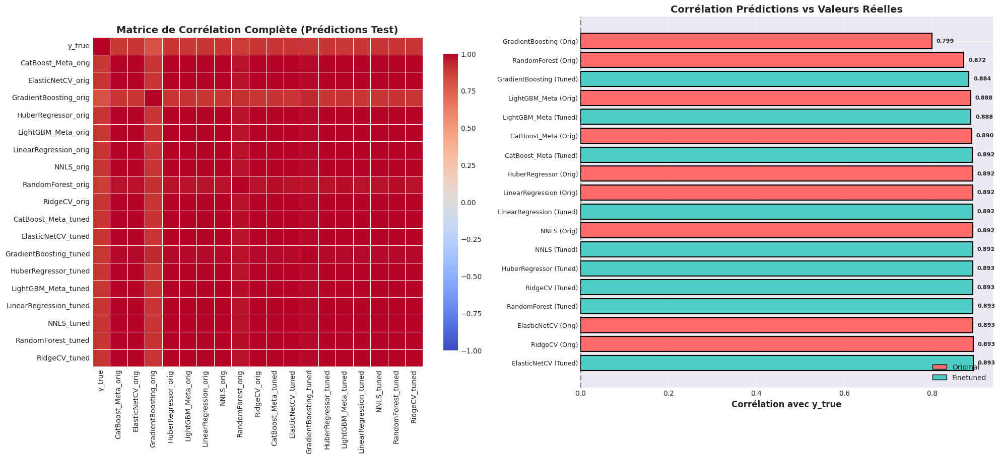


Visualisation 4 terminée
   18 prédictions analysées
   Meilleure corrélation: 0.8935 (ElasticNetCV_tuned)


In [ ]:
# Visualisation 4: Matrice de corrélation des prédictions (Original vs Tuned)
print("=" * 80)
print("> VISUALISATION 4: CORRÉLATION DES PRÉDICTIONS")
print("=" * 80)

# Créer un DataFrame avec toutes les prédictions
all_predictions = pd.DataFrame({'y_true': y_test})

# Ajouter les prédictions originales
for model_name in original_models:
    model_obj = stacking_models[model_name]
    use_scaled = model_name in ['HuberRegressor', 'ElasticNetCV', 'RidgeCV']
    X_pred = X_test_meta_scaled if use_scaled else X_test_meta
    preds = model_obj.predict(X_pred)
    all_predictions[f'{model_name}_orig'] = preds

# Ajouter les prédictions finetuned
for model_name in original_models:
    tuned_name = f'{model_name}-Tuned'
    if tuned_name in finetuned_models:
        model_obj = finetuned_models[tuned_name]
        use_scaled = model_name in ['HuberRegressor', 'ElasticNetCV', 'RidgeCV']
        X_pred = X_test_meta_scaled if use_scaled else X_test_meta
        preds = model_obj.predict(X_pred)
        all_predictions[f'{model_name}_tuned'] = preds

# Calculer la matrice de corrélation
corr_matrix = all_predictions.corr()

# Visualisation
fig, axes = plt.subplots(1, 2, figsize=(20, 9))

# Subplot 1: Corrélation complète
ax = axes[0]
sns.heatmap(corr_matrix, annot=False, fmt='.2f', cmap='coolwarm', center=0,
            square=True, linewidths=0.5, cbar_kws={"shrink": 0.8},
            vmin=-1, vmax=1, ax=ax)
ax.set_title('Matrice de Corrélation Complète (Prédictions Test)',
             fontsize=14, fontweight='bold')

# Subplot 2: Corrélation avec y_true uniquement
ax = axes[1]
corr_with_true = corr_matrix['y_true'].drop('y_true').sort_values(ascending=False)
colors_corr = ['#4ECDC4' if 'tuned' in name else '#FF6B6B' for name in corr_with_true.index]
bars = ax.barh(range(len(corr_with_true)), corr_with_true.values,
               color=colors_corr, edgecolor='black', linewidth=1.5)
ax.set_yticks(range(len(corr_with_true)))
ax.set_yticklabels([name.replace('_orig', ' (Orig)').replace('_tuned', ' (Tuned)')
                     for name in corr_with_true.index], fontsize=9)
ax.set_xlabel('Corrélation avec y_true', fontsize=12, fontweight='bold')
ax.set_title('Corrélation Prédictions vs Valeurs Réelles', fontsize=14, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
ax.axvline(x=0, color='black', linestyle='--', linewidth=2, alpha=0.5)

# Ajouter les valeurs
for i, v in enumerate(corr_with_true.values):
    ax.text(v + 0.01, i, f'{v:.3f}', va='center', fontsize=8, fontweight='bold')

# Légende
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#FF6B6B', edgecolor='black', label='Original'),
    Patch(facecolor='#4ECDC4', edgecolor='black', label='Finetuned')
]
ax.legend(handles=legend_elements, loc='lower right', fontsize=10)

plt.tight_layout()
plt.show()

print(f"\nVisualisation 4 terminée")
print(f"   {len(all_predictions.columns)-1} prédictions analysées")
print(f"   Meilleure corrélation: {corr_with_true.max():.4f} ({corr_with_true.idxmax()})")

In [ ]:
# Comparaison finale incluant le modèle ensemble
print("=" * 80)
print("COMPARAISON FINALE (INCLUANT ENSEMBLE)")
print("=" * 80)

# Créer un DataFrame avec tous les résultats
final_results_df = pd.DataFrame(results).T

# Filtrer uniquement les résultats sur le test set
final_test_results = final_results_df[final_results_df.index.str.contains('Test')]
final_test_results.index = final_test_results.index.str.replace(' (Test)', '')

# Trier par R² décroissant
final_test_results = final_test_results.sort_values('R²', ascending=False)

print("\n> Classement final des modèles (par R²) :")
display(final_test_results)

# Identifier le meilleur modèle
best_model_final = final_test_results.index[0]
best_r2_final = final_test_results.loc[best_model_final, 'R²']
best_rmse_final = final_test_results.loc[best_model_final, 'RMSE']

print(f"\n> Meilleur modèle : {best_model_final}")
print(f"   R² = {best_r2_final:.4f}")
print(f"   RMSE = {best_rmse_final:.4f}")

# Amélioration par rapport au baseline
baseline_r2 = final_test_results.loc['Linear Regression', 'R²']
improvement = ((best_r2_final - baseline_r2) / baseline_r2) * 100

print(f"\n> Amélioration par rapport au baseline (Linear Regression) :")
print(f"   +{improvement:.2f}% de R²")

COMPARAISON FINALE (INCLUANT ENSEMBLE)

> Classement final des modèles (par R²) :


,RMSE,MAE,R²,MAPE
Stacking-RandomForest-Tuned,1.729590,1.005671,0.796700,34.462349
Stacking-RidgeCV-Tuned,1.730186,0.997029,0.796559,32.917036
Stacking-NNLS-Tuned,1.731276,0.997735,0.796303,33.083293
Stacking-LinearRegression-Tuned,1.731304,0.996953,0.796297,32.906547
Stacking-ElasticNetCV-Tuned,1.733425,1.013352,0.795797,34.738460
CatBoost,1.733754,1.008618,0.795719,33.340776
Stacking-HuberRegressor-Tuned,1.741763,1.005633,0.793828,33.217411
Random Forest,1.743657,0.999779,0.793379,32.238679
Stacking-CatBoost_Meta-Tuned,1.746988,1.036719,0.792589,38.134517
LightGBM,1.757375,1.027697,0.790115,33.612670



> Meilleur modèle : Stacking-RandomForest-Tuned
   R² = 0.7967
   RMSE = 1.7296

> Amélioration par rapport au baseline (Linear Regression) :
   +34.65% de R²


> VISUALISATION RADAR DES PERFORMANCES

> Nombre total de modèles à comparer : 18


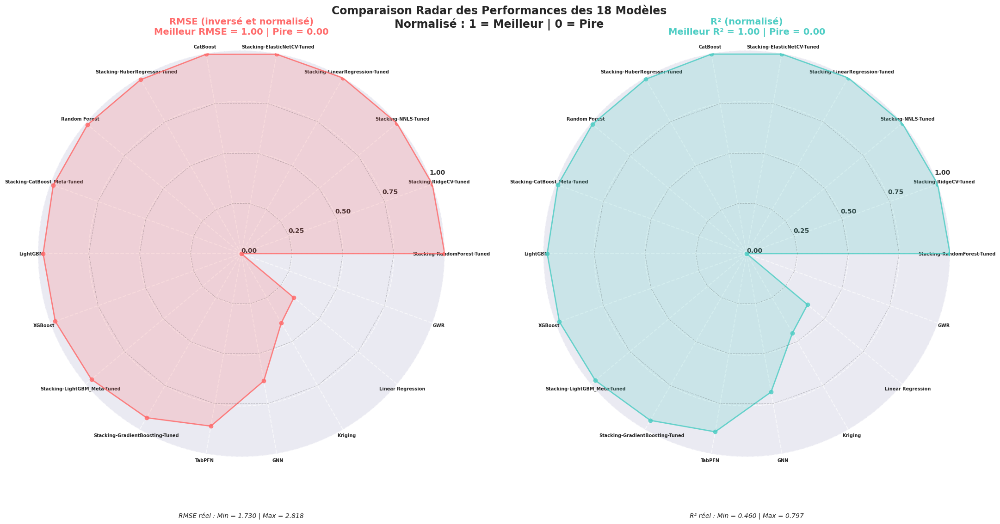

> 18 modèles affichés sur chaque radar
> Top 3 modèles (R²) : Stacking-RandomForest-Tuned, Stacking-RidgeCV-Tuned, Stacking-NNLS-Tuned


In [ ]:
# Visualisation finale : 2 Graphiques radar comparant tous les modèles
from math import pi

print("=" * 80)
print("> VISUALISATION RADAR DES PERFORMANCES")
print("=" * 80)

# Préparer les données pour le radar
radar_data = final_test_results.copy()

# Utiliser TOUS les modèles pour une comparaison complète
models_list = radar_data.index.tolist()
n_models = len(models_list)

print(f"\n> Nombre total de modèles à comparer : {n_models}")

# Angles pour les modèles sur le radar
angles = [n / float(n_models) * 2 * pi for n in range(n_models)]
angles += angles[:1]

# Créer 2 sous-graphiques pour les 2 radars
fig = plt.figure(figsize=(22, 11))

# ===== RADAR 1 : RMSE (inversé pour avoir meilleur = plus grand) =====
ax = fig.add_subplot(121, projection='polar')

# Pour RMSE : inverser (plus petit RMSE = meilleur = plus proche de 1)
rmse_values = radar_data['RMSE'].values
min_rmse = rmse_values.min()
max_rmse = rmse_values.max()

# Normalisation inversée : meilleur RMSE (min) = 1, pire RMSE (max) = 0
if max_rmse > min_rmse:
    rmse_inv_norm = 1 - (rmse_values - min_rmse) / (max_rmse - min_rmse)
else:
    rmse_inv_norm = np.ones(len(rmse_values))

rmse_inv_norm = rmse_inv_norm.tolist()
rmse_inv_norm += rmse_inv_norm[:1]

# Tracer avec gradient de couleur
ax.plot(angles, rmse_inv_norm, 'o-', linewidth=2, color='#FF6B6B', markersize=6, alpha=0.8)
ax.fill(angles, rmse_inv_norm, alpha=0.2, color='#FF6B6B')

# Configuration
ax.set_xticks(angles[:-1])
ax.set_xticklabels(models_list, size=7, fontweight='bold')
ax.set_ylim(0, 1)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_yticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], size=10, fontweight='bold')
ax.grid(True, linestyle='--', alpha=0.6, linewidth=1.5)

# Ajouter des anneaux de référence colorés
for ytick in [0.25, 0.5, 0.75]:
    ax.plot(angles, [ytick] * len(angles), 'k--', alpha=0.2, linewidth=0.8)

ax.set_title('RMSE (inversé et normalisé)\nMeilleur RMSE = 1.00 | Pire = 0.00',
             size=14, fontweight='bold', pad=25, color='#FF6B6B')

# Ajouter les valeurs RMSE réelles en annotation
ax.text(0.5, -0.15, f'RMSE réel : Min = {min_rmse:.3f} | Max = {max_rmse:.3f}',
        transform=ax.transAxes, ha='center', size=10, style='italic')

# ===== RADAR 2 : R² (normalisé) =====
ax2 = fig.add_subplot(122, projection='polar')

# Pour R² : normaliser entre 0 et 1 (gérer les valeurs négatives)
r2_values = radar_data['R²'].values
min_r2 = r2_values.min()
max_r2 = r2_values.max()

# Normalisation adaptée (gérer R² négatif)
if max_r2 > min_r2:
    r2_norm = (r2_values - min_r2) / (max_r2 - min_r2)
else:
    r2_norm = np.ones(len(r2_values)) * 0.5

r2_norm = r2_norm.tolist()
r2_norm += r2_norm[:1]

# Tracer avec gradient de couleur
ax2.plot(angles, r2_norm, 'o-', linewidth=2, color='#4ECDC4', markersize=6, alpha=0.8)
ax2.fill(angles, r2_norm, alpha=0.2, color='#4ECDC4')

# Configuration
ax2.set_xticks(angles[:-1])
ax2.set_xticklabels(models_list, size=7, fontweight='bold')
ax2.set_ylim(0, 1)
ax2.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
ax2.set_yticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], size=10, fontweight='bold')
ax2.grid(True, linestyle='--', alpha=0.6, linewidth=1.5)

# Ajouter des anneaux de référence colorés
for ytick in [0.25, 0.5, 0.75]:
    ax2.plot(angles, [ytick] * len(angles), 'k--', alpha=0.2, linewidth=0.8)

ax2.set_title('R² (normalisé)\nMeilleur R² = 1.00 | Pire = 0.00',
              size=14, fontweight='bold', pad=25, color='#4ECDC4')

# Ajouter les valeurs R² réelles en annotation
ax2.text(0.5, -0.15, f'R² réel : Min = {min_r2:.3f} | Max = {max_r2:.3f}',
         transform=ax2.transAxes, ha='center', size=10, style='italic')

plt.suptitle(f'Comparaison Radar des Performances des {n_models} Modèles\nNormalisé : 1 = Meilleur | 0 = Pire',
             size=17, fontweight='bold', y=0.98)

plt.tight_layout()
plt.show()

print(f"> {n_models} modèles affichés sur chaque radar")
print(f"> Top 3 modèles (R²) : {', '.join(radar_data.head(3).index.tolist())}")


> ANALYSE DES ERREURS DU MEILLEUR MODÈLE GLOBAL

Meilleur modèle: Stacking-RandomForest-Tuned
R² = 0.7967, RMSE = 1.7296
> Génération des prédictions pour Stacking-RandomForest-Tuned...
   ✓ Prédictions générées depuis le modèle


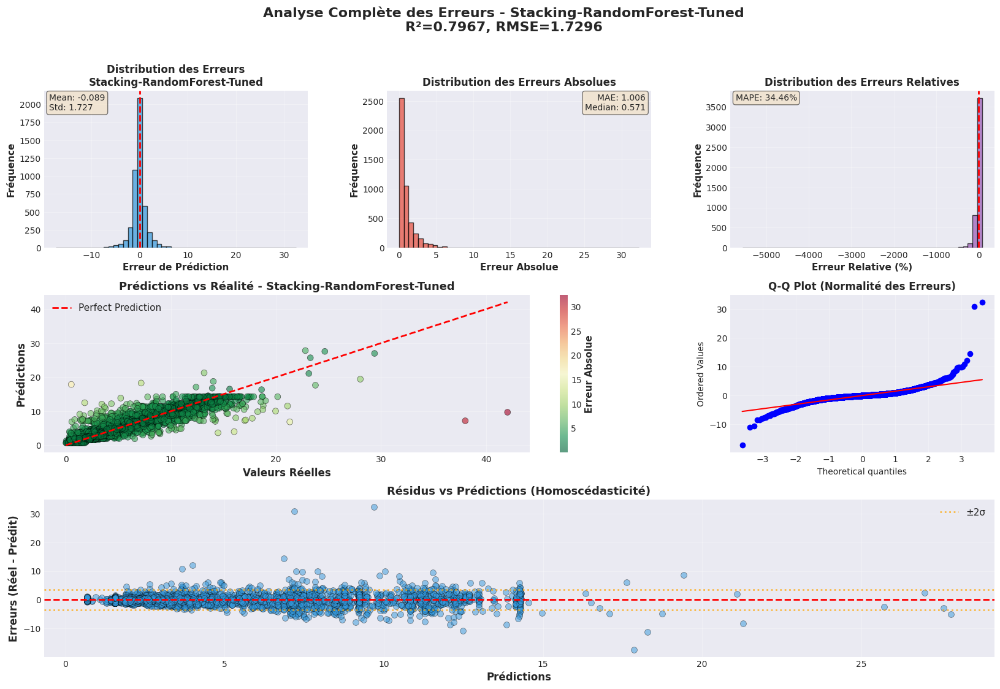


✓ Analyse des erreurs terminée
   Modèle analysé: Stacking-RandomForest-Tuned
   Erreur moyenne: -0.0895
   Erreur absolue moyenne: 1.0057
   MAPE: 34.46%


In [ ]:
# Analyse détaillée des erreurs du meilleur modèle global
print("=" * 80)
print("> ANALYSE DES ERREURS DU MEILLEUR MODÈLE GLOBAL")
print("=" * 80)

# Obtenir le meilleur modèle global (utiliser final_test_results qui contient TOUS les modèles)
if 'final_test_results' in dir() and len(final_test_results) > 0:
    best_model_name = final_test_results.index[0]
    best_r2 = final_test_results.iloc[0]['R²']
    best_rmse = final_test_results.iloc[0]['RMSE']

    print(f"\nMeilleur modèle: {best_model_name}")
    print(f"R² = {best_r2:.4f}, RMSE = {best_rmse:.4f}")

    # Obtenir les prédictions du meilleur modèle
    y_pred_best = None

    # Pour les modèles stackés et tunés, on doit les régénérer
    if 'Stacking' in best_model_name and '-Tuned' in best_model_name:
        print(f"> Génération des prédictions pour {best_model_name}...")

        # Extraire le nom du modèle depuis "Stacking-ModelName-Tuned"
        # Le nom dans finetuned_models est "ModelName-Tuned" (sans le préfixe "Stacking-")
        meta_name_tuned = best_model_name.replace('Stacking-', '')
        meta_name = meta_name_tuned.replace('-Tuned', '')

        if meta_name_tuned in finetuned_models:
            best_model = finetuned_models[meta_name_tuned]

            # Déterminer si on doit utiliser les données scaled
            use_scaled = meta_name in ['HuberRegressor', 'ElasticNetCV', 'RidgeCV']
            X_pred = X_test_meta_scaled if use_scaled else X_test_meta

            y_pred_best = best_model.predict(X_pred)
            print(f"   ✓ Prédictions générées depuis le modèle")
        else:
            print(f"   ! Modèle {meta_name_tuned} non trouvé dans finetuned_models")
            print(f"   ! Modèles disponibles: {list(finetuned_models.keys())}")

    # Pour les modèles de base, utiliser les variables existantes
    elif best_model_name == 'Linear Regression' and 'y_pred_test_lr' in dir():
        y_pred_best = y_pred_test_lr
    elif best_model_name == 'Random Forest' and 'y_pred_test_rf' in dir():
        y_pred_best = y_pred_test_rf
    elif best_model_name == 'XGBoost' and 'y_pred_test_xgb' in dir():
        y_pred_best = y_pred_test_xgb
    elif best_model_name == 'LightGBM' and 'y_pred_test_lgb' in dir():
        y_pred_best = y_pred_test_lgb
    elif best_model_name == 'CatBoost' and 'y_pred_test_catboost' in dir():
        y_pred_best = y_pred_test_catboost
    elif best_model_name == 'TabPFN' and 'y_pred_test_tabpfn' in dir():
        y_pred_best = y_pred_test_tabpfn
    elif best_model_name == 'GNN' and 'y_pred_test_gnn' in dir():
        y_pred_best = y_pred_test_gnn
    elif best_model_name == 'Kriging' and 'y_pred_test_krig' in dir():
        y_pred_best = y_pred_test_krig
    elif best_model_name == 'GWR' and 'y_pred_test_gwr' in dir():
        y_pred_best = y_pred_best_gwr

    # Fallback: essayer de trouver dans les modèles stacking non-tunés
    elif 'Stacking' in best_model_name and best_model_name in stacking_models:
        best_model = stacking_models[best_model_name]
        meta_name = best_model_name.replace('Stacking-', '')
        use_scaled = meta_name in ['HuberRegressor', 'ElasticNetCV', 'RidgeCV']
        X_pred = X_test_meta_scaled if use_scaled else X_test_meta
        y_pred_best = best_model.predict(X_pred)

    if y_pred_best is not None:
        # Calculer les erreurs
        errors = y_test.values - y_pred_best
        abs_errors = np.abs(errors)
        pct_errors = (errors / y_test.values) * 100

        # Créer la figure
        fig = plt.figure(figsize=(20, 12))
        gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

        # Subplot 1: Distribution des erreurs
        ax1 = fig.add_subplot(gs[0, 0])
        ax1.hist(errors, bins=50, color='#3498DB', edgecolor='black', alpha=0.7)
        ax1.axvline(x=0, color='red', linestyle='--', linewidth=2)
        ax1.set_xlabel('Erreur de Prédiction', fontsize=11, fontweight='bold')
        ax1.set_ylabel('Fréquence', fontsize=11, fontweight='bold')
        ax1.set_title(f'Distribution des Erreurs\n{best_model_name}', fontsize=12, fontweight='bold')
        ax1.grid(alpha=0.3)
        ax1.text(0.02, 0.98, f'Mean: {errors.mean():.3f}\nStd: {errors.std():.3f}',
                 transform=ax1.transAxes, verticalalignment='top', fontsize=10,
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

        # Subplot 2: Distribution des erreurs absolues
        ax2 = fig.add_subplot(gs[0, 1])
        ax2.hist(abs_errors, bins=50, color='#E74C3C', edgecolor='black', alpha=0.7)
        ax2.set_xlabel('Erreur Absolue', fontsize=11, fontweight='bold')
        ax2.set_ylabel('Fréquence', fontsize=11, fontweight='bold')
        ax2.set_title('Distribution des Erreurs Absolues', fontsize=12, fontweight='bold')
        ax2.grid(alpha=0.3)
        ax2.text(0.98, 0.98, f'MAE: {abs_errors.mean():.3f}\nMedian: {np.median(abs_errors):.3f}',
                 transform=ax2.transAxes, verticalalignment='top', horizontalalignment='right',
                 fontsize=10, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

        # Subplot 3: Distribution des erreurs en pourcentage
        ax3 = fig.add_subplot(gs[0, 2])
        ax3.hist(pct_errors, bins=50, color='#9B59B6', edgecolor='black', alpha=0.7)
        ax3.axvline(x=0, color='red', linestyle='--', linewidth=2)
        ax3.set_xlabel('Erreur Relative (%)', fontsize=11, fontweight='bold')
        ax3.set_ylabel('Fréquence', fontsize=11, fontweight='bold')
        ax3.set_title('Distribution des Erreurs Relatives', fontsize=12, fontweight='bold')
        ax3.grid(alpha=0.3)
        ax3.text(0.02, 0.98, f'MAPE: {np.abs(pct_errors).mean():.2f}%',
                 transform=ax3.transAxes, verticalalignment='top', fontsize=10,
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

        # Subplot 4: Prédictions vs Vraies valeurs
        ax4 = fig.add_subplot(gs[1, :2])
        scatter = ax4.scatter(y_test, y_pred_best, c=abs_errors, cmap='RdYlGn_r',
                              s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
        ax4.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
                 'r--', linewidth=2, label='Perfect Prediction')
        ax4.set_xlabel('Valeurs Réelles', fontsize=12, fontweight='bold')
        ax4.set_ylabel('Prédictions', fontsize=12, fontweight='bold')
        ax4.set_title(f'Prédictions vs Réalité - {best_model_name}', fontsize=13, fontweight='bold')
        ax4.legend(fontsize=11)
        ax4.grid(alpha=0.3)
        cbar = plt.colorbar(scatter, ax=ax4)
        cbar.set_label('Erreur Absolue', fontsize=11, fontweight='bold')

        # Subplot 5: Q-Q Plot
        ax5 = fig.add_subplot(gs[1, 2])
        from scipy import stats
        stats.probplot(errors, dist="norm", plot=ax5)
        ax5.set_title('Q-Q Plot (Normalité des Erreurs)', fontsize=12, fontweight='bold')
        ax5.grid(alpha=0.3)

        # Subplot 6: Erreurs vs Prédictions
        ax6 = fig.add_subplot(gs[2, :])
        ax6.scatter(y_pred_best, errors, alpha=0.5, s=50, c='#3498DB', edgecolors='black', linewidth=0.5)
        ax6.axhline(y=0, color='red', linestyle='--', linewidth=2)
        ax6.set_xlabel('Prédictions', fontsize=12, fontweight='bold')
        ax6.set_ylabel('Erreurs (Réel - Prédit)', fontsize=12, fontweight='bold')
        ax6.set_title('Résidus vs Prédictions (Homoscédasticité)', fontsize=13, fontweight='bold')
        ax6.grid(alpha=0.3)

        # Ajouter bandes de confiance
        std_error = errors.std()
        ax6.axhline(y=2*std_error, color='orange', linestyle=':', linewidth=2, alpha=0.7, label='±2σ')
        ax6.axhline(y=-2*std_error, color='orange', linestyle=':', linewidth=2, alpha=0.7)
        ax6.legend(fontsize=11)

        plt.suptitle(f'Analyse Complète des Erreurs - {best_model_name}\nR²={best_r2:.4f}, RMSE={best_rmse:.4f}',
                     fontsize=16, fontweight='bold', y=0.995)

        plt.show()

        print(f"\n✓ Analyse des erreurs terminée")
        print(f"   Modèle analysé: {best_model_name}")
        print(f"   Erreur moyenne: {errors.mean():.4f}")
        print(f"   Erreur absolue moyenne: {abs_errors.mean():.4f}")
        print(f"   MAPE: {np.abs(pct_errors).mean():.2f}%")
    else:
        print(f"\n! Impossible de générer les prédictions pour {best_model_name}")

else:
    print("\n! final_test_results non disponible, impossible d'analyser le meilleur modèle")

## Heatmap des Métriques de Performance

Visualisation complète de toutes les métriques de performance pour chaque modèle sous forme de heatmap.

> HEATMAP DES MÉTRIQUES DE PERFORMANCE

Utilisation de final_test_results avec 18 modèles

> Nombre de modèles à évaluer : 18
  Traitement: Stacking-RandomForest-Tuned... ✓
  Traitement: Stacking-RidgeCV-Tuned... ✓
  Traitement: Stacking-NNLS-Tuned... ✓
  Traitement: Stacking-LinearRegression-Tuned... ✓
  Traitement: Stacking-ElasticNetCV-Tuned... ✓
  Traitement: CatBoost... ✓
  Traitement: Stacking-HuberRegressor-Tuned... ✓
  Traitement: Random Forest... ✓
  Traitement: Stacking-CatBoost_Meta-Tuned... ✓
  Traitement: LightGBM... ✓
  Traitement: XGBoost... ✓
  Traitement: Stacking-LightGBM_Meta-Tuned... ✓
  Traitement: Stacking-GradientBoosting-Tuned... ✓
  Traitement: TabPFN... ✓
  Traitement: GNN... ✓
  Traitement: Kriging... ✓
  Traitement: Linear Regression... ✓
  Traitement: GWR... ✓

> Métriques calculées pour 18 modèles
   Nombre de métriques : 11


,R²,Explained Variance,RMSE,MAE,Median AE,MAPE (%),Max Error,Std Residuals,Mean Residuals,Q95 Error,CV Error
Model,,,,,,,,,,,
Stacking-RandomForest-Tuned,0.796700,0.797244,1.729590,1.005671,0.570838,34.462349,32.359696,1.727273,-0.089499,3.477865,1.717532
Stacking-RidgeCV-Tuned,0.796559,0.796612,1.730186,0.997029,0.550399,32.917036,32.652071,1.729961,-0.027911,3.433810,1.735117
Stacking-NNLS-Tuned,0.796303,0.796385,1.731276,0.997735,0.551069,33.083293,32.703475,1.730928,-0.034733,3.440646,1.734858
Stacking-LinearRegression-Tuned,0.796297,0.796357,1.731304,0.996953,0.551645,32.906547,32.732729,1.731045,-0.029909,3.432697,1.736336
Stacking-ElasticNetCV-Tuned,0.795797,0.797694,1.733425,1.013352,0.585552,34.738460,32.225814,1.725353,-0.167093,3.410717,1.702620
CatBoost,0.795719,0.795790,1.733754,1.008618,0.567659,33.340776,32.333513,1.733455,0.032208,3.496902,1.718644
Stacking-HuberRegressor-Tuned,0.793828,0.795083,1.741763,1.005633,0.564576,33.217411,32.694001,1.736454,-0.135888,3.407826,1.726728
Random Forest,0.793379,0.793451,1.743657,0.999779,0.543164,32.238679,33.255142,1.743355,0.032447,3.454903,1.743740
Stacking-CatBoost_Meta-Tuned,0.792589,0.795128,1.746988,1.036719,0.620008,38.134517,32.505988,1.736261,-0.193299,3.395650,1.674765


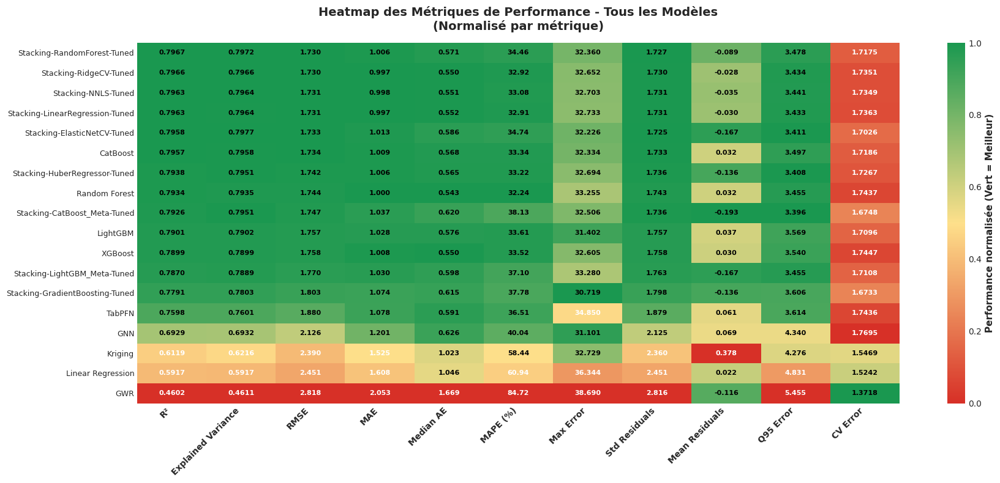


✓ Heatmap générée avec succès
   Top 3 modèles (R²) : Stacking-RandomForest-Tuned, Stacking-RidgeCV-Tuned, Stacking-NNLS-Tuned


In [ ]:
# Heatmap avec toutes les métriques de performance
from sklearn.metrics import (mean_squared_error, mean_absolute_error, r2_score,
                              mean_absolute_percentage_error, max_error,
                              explained_variance_score, median_absolute_error)
import matplotlib.colors as mcolors

print("=" * 80)
print("> HEATMAP DES MÉTRIQUES DE PERFORMANCE")
print("=" * 80)

# Utiliser final_test_results qui contient tous les modèles
if 'final_test_results' in dir():
    print(f"\nUtilisation de final_test_results avec {len(final_test_results)} modèles")
    models_list = final_test_results.index.tolist()
else:
    print("\n! final_test_results non trouvé")
    models_list = []

print(f"\n> Nombre de modèles à évaluer : {len(models_list)}")

# Calculer toutes les métriques pour chaque modèle
metrics_data = []

for model_name in models_list:
    print(f"  Traitement: {model_name}...", end="")

    # Récupérer les prédictions
    y_pred = None

    # Pour les modèles Stacking-*-Tuned, régénérer les prédictions
    if 'Stacking' in model_name and '-Tuned' in model_name:
        # Le nom dans finetuned_models est "ModelName-Tuned" (sans le préfixe "Stacking-")
        meta_name_tuned = model_name.replace('Stacking-', '')
        meta_name = meta_name_tuned.replace('-Tuned', '')

        if meta_name_tuned in finetuned_models:
            best_model = finetuned_models[meta_name_tuned]
            use_scaled = meta_name in ['HuberRegressor', 'ElasticNetCV', 'RidgeCV']
            X_pred = X_test_meta_scaled if use_scaled else X_test_meta
            y_pred = best_model.predict(X_pred)

    # Pour les modèles Stacking-* (non tunés)
    elif 'Stacking' in model_name and model_name in stacking_models:
        meta_name = model_name.replace('Stacking-', '')
        best_model = stacking_models[model_name]
        use_scaled = meta_name in ['HuberRegressor', 'ElasticNetCV', 'RidgeCV']
        X_pred = X_test_meta_scaled if use_scaled else X_test_meta
        y_pred = best_model.predict(X_pred)

    # Pour les modèles de base, utiliser les variables existantes
    elif model_name == 'Linear Regression' and 'y_pred_test_lr' in dir():
        y_pred = y_pred_test_lr
    elif model_name == 'Random Forest' and 'y_pred_test_rf' in dir():
        y_pred = y_pred_test_rf
    elif model_name == 'XGBoost' and 'y_pred_test_xgb' in dir():
        y_pred = y_pred_test_xgb
    elif model_name == 'LightGBM' and 'y_pred_test_lgb' in dir():
        y_pred = y_pred_test_lgb
    elif model_name == 'CatBoost' and 'y_pred_test_catboost' in dir():
        y_pred = y_pred_test_catboost
    elif model_name == 'TabPFN' and 'y_pred_test_tabpfn' in dir():
        y_pred = y_pred_test_tabpfn
    elif model_name == 'GNN' and 'y_pred_test_gnn' in dir():
        y_pred = y_pred_test_gnn
    elif model_name == 'Kriging' and 'y_pred_test_krig' in dir():
        y_pred = y_pred_test_krig
    elif model_name == 'GWR' and 'y_pred_test_gwr' in dir():
        y_pred = y_pred_test_gwr

    if y_pred is not None:
        # Calcul de toutes les métriques
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred) * 100
        max_err = max_error(y_test, y_pred)
        explained_var = explained_variance_score(y_test, y_pred)
        median_ae = median_absolute_error(y_test, y_pred)

        residuals = y_test.values - y_pred
        std_residuals = np.std(residuals)
        mean_residuals = np.mean(residuals)
        q95_error = np.percentile(np.abs(residuals), 95)
        cv_error = (std_residuals / np.mean(np.abs(residuals))) if np.mean(np.abs(residuals)) > 0 else 0

        metrics_data.append({
            'Model': model_name,
            'R²': r2,
            'Explained Variance': explained_var,
            'RMSE': rmse,
            'MAE': mae,
            'Median AE': median_ae,
            'MAPE (%)': mape,
            'Max Error': max_err,
            'Std Residuals': std_residuals,
            'Mean Residuals': mean_residuals,
            'Q95 Error': q95_error,
            'CV Error': cv_error
        })
        print(" ✓")
    else:
        print(" ✗ (pas de prédictions)")

# Créer le DataFrame
metrics_df = pd.DataFrame(metrics_data)
metrics_df = metrics_df.set_index('Model')

# Trier par R² décroissant
metrics_df = metrics_df.sort_values('R²', ascending=False)

print(f"\n> Métriques calculées pour {len(metrics_df)} modèles")
print(f"   Nombre de métriques : {len(metrics_df.columns)}")

# Afficher le tableau
display(metrics_df)

# Définir les métriques où plus grand = meilleur
higher_is_better = ['R²', 'Explained Variance']

# Créer une matrice de couleurs basée sur la normalisation par ligne (row)
color_matrix = np.zeros_like(metrics_df.values, dtype=float)

for i, metric in enumerate(metrics_df.columns):
    values = metrics_df[metric].values

    # Normaliser entre 0 et 1
    if values.max() > values.min():
        if metric in higher_is_better:
            # Plus grand = meilleur (vert)
            color_matrix[:, i] = (values - values.min()) / (values.max() - values.min())
        else:
            # Plus petit = meilleur (vert)
            color_matrix[:, i] = 1 - (values - values.min()) / (values.max() - values.min())
    else:
        color_matrix[:, i] = 0.5  # Valeurs identiques = couleur moyenne

# Créer la heatmap
fig, ax = plt.subplots(figsize=(18, max(8, len(metrics_df) * 0.4)))

# Créer une colormap divergente (vert = bon, rouge = mauvais)
cmap = mcolors.LinearSegmentedColormap.from_list('performance', ['#d73027', '#fee08b', '#1a9850'])

im = ax.imshow(color_matrix, cmap=cmap, aspect='auto', vmin=0, vmax=1)

# Configuration des axes
ax.set_xticks(np.arange(len(metrics_df.columns)))
ax.set_yticks(np.arange(len(metrics_df.index)))
ax.set_xticklabels(metrics_df.columns, rotation=45, ha='right', fontsize=10, fontweight='bold')
ax.set_yticklabels(metrics_df.index, fontsize=9)

# Désactiver la grille
ax.grid(False)
ax.set_xticks(np.arange(len(metrics_df.columns)) + 0.5, minor=True)
ax.set_yticks(np.arange(len(metrics_df.index)) + 0.5, minor=True)
ax.grid(which='minor', visible=False)

# Ajouter les valeurs dans chaque cellule
for i in range(len(metrics_df.index)):
    for j in range(len(metrics_df.columns)):
        value = metrics_df.iloc[i, j]

        # Formater selon la métrique
        if metrics_df.columns[j] in ['R²', 'Explained Variance', 'CV Error']:
            text = f'{value:.4f}'
        elif metrics_df.columns[j] == 'MAPE (%)':
            text = f'{value:.2f}'
        else:
            text = f'{value:.3f}'

        # Couleur du texte (noir ou blanc selon le fond)
        text_color = 'white' if color_matrix[i, j] < 0.5 else 'black'
        ax.text(j, i, text, ha='center', va='center', color=text_color,
                fontsize=8, fontweight='bold')

# Colorbar
cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Performance normalisée (Vert = Meilleur)', fontsize=11, fontweight='bold')

# Titre
ax.set_title('Heatmap des Métriques de Performance - Tous les Modèles\n(Normalisé par métrique)',
             fontsize=14, fontweight='bold', pad=15)

plt.tight_layout()
plt.show()

print(f"\n✓ Heatmap générée avec succès")
print(f"   Top 3 modèles (R²) : {', '.join(metrics_df.head(3).index.tolist())}")


## Phase 10 : Comparaison des Feature Importances

Analyse comparative de l'importance des features à travers les modèles.

> COMPARAISON DES FEATURE IMPORTANCES

Top 15 features les plus importantes (moyenne) :


,Random Forest,XGBoost,LightGBM,CatBoost,Linear Regression,Mean
Feature,,,,,,
LONGITUDE,0.292766,0.084592,13569,26.049057,0.307888,2719.146861
LATITUDE,0.170116,0.038436,13327,22.797828,0.019827,2670.005241
ALTITUDE,0.339427,0.127656,13048,31.312768,0.377858,2616.031542
YEAR,0.042597,0.014387,10266,11.269885,0.040691,2055.473512
SOIL_Hydric Andosols,0.065633,0.259658,628,3.595219,0.018901,126.387882
SOIL_Andosols,0.039173,0.243709,490,3.123276,0.031748,98.687581
SOIL_Andic Cambisols,0.008029,0.023090,297,0.654992,0.027166,59.542655
SOIL_Cambisols,0.012916,0.094685,285,0.874851,0.058796,57.208250
SOIL_Nitisols and Ferralsols,0.029203,0.108581,92,0.314918,0.087068,18.507954


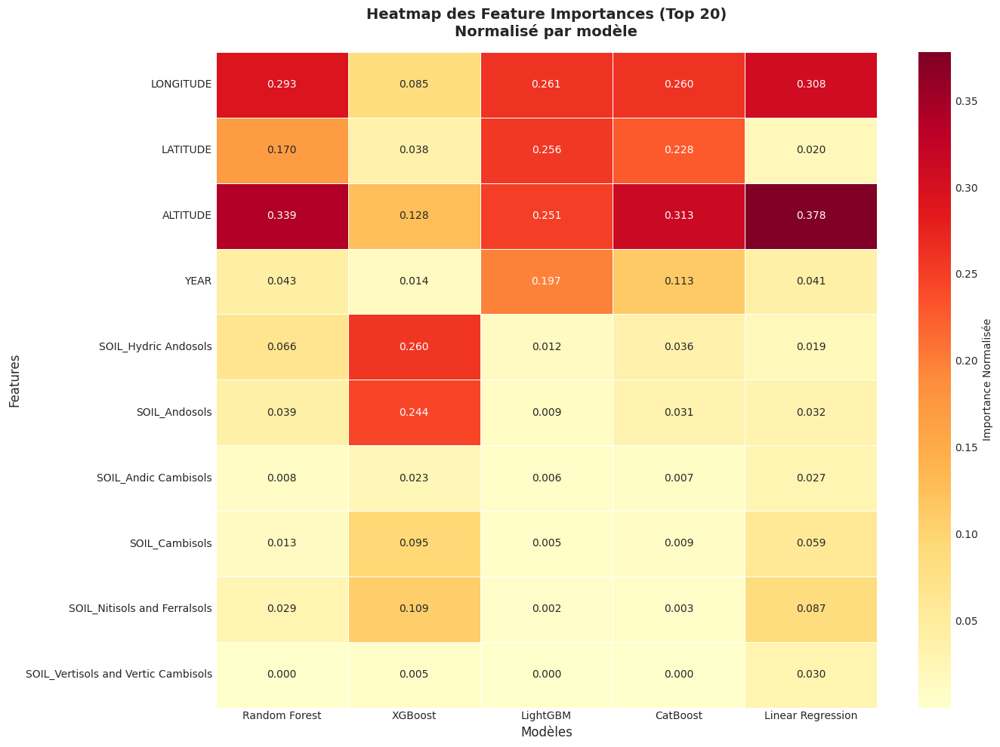


>Features consensuelles (importance > 0.01 dans tous les modèles) :
   - LONGITUDE
   - LATITUDE
   - ALTITUDE
   - YEAR
   - SOIL_Hydric Andosols
   - SOIL_Andosols
   - SOIL_Cambisols
   - SOIL_Nitisols and Ferralsols


In [ ]:
# Comparaison des Feature Importances entre modèles
print("=" * 80)
print("> COMPARAISON DES FEATURE IMPORTANCES")
print("=" * 80)

# Collecter toutes les importances
all_importances = {}

# Random Forest
if 'importances_rf' in locals():
    all_importances['Random Forest'] = importances_rf.set_index('Feature')['Importance']

# XGBoost
if xgb_available and 'importances_xgb' in locals():
    all_importances['XGBoost'] = importances_xgb.set_index('Feature')['Importance']

# LightGBM
if lgbm_available and 'importances_lgb' in locals():
    all_importances['LightGBM'] = importances_lgb.set_index('Feature')['Importance']

# CatBoost
if catboost_available and 'importances_catboost' in locals():
    all_importances['CatBoost'] = importances_catboost.set_index('Feature')['Importance']

# Linear Regression (utiliser les valeurs absolues des coefficients)
if 'coef_df' in locals():
    coef_normalized = coef_df.set_index('Feature')['Abs_Coefficient']
    coef_normalized = coef_normalized / coef_normalized.sum()  # Normaliser
    all_importances['Linear Regression'] = coef_normalized

# Créer un DataFrame avec toutes les importances
if len(all_importances) > 0:
    importances_comparison = pd.DataFrame(all_importances)

    # Remplir les valeurs manquantes par 0
    importances_comparison = importances_comparison.fillna(0)

    # Calculer la moyenne des importances
    importances_comparison['Mean'] = importances_comparison.mean(axis=1)

    # Trier par importance moyenne
    importances_comparison = importances_comparison.sort_values('Mean', ascending=False)

    # Afficher le top 15
    print("\nTop 15 features les plus importantes (moyenne) :")
    display(importances_comparison.head(15))

    # Visualisation : Heatmap des importances
    plt.figure(figsize=(14, 10))

    # Sélectionner le top 20 pour la visualisation
    top_features_comp = importances_comparison.head(20).drop('Mean', axis=1)

    # Normaliser chaque colonne (modèle) entre 0 et 1 pour la comparaison
    top_features_norm = top_features_comp.div(top_features_comp.sum(axis=0), axis=1)

    sns.heatmap(top_features_norm, annot=True, fmt='.3f', cmap='YlOrRd',
                cbar_kws={'label': 'Importance Normalisée'}, linewidths=0.5)

    plt.title('Heatmap des Feature Importances (Top 20)\nNormalisé par modèle',
              fontsize=14, fontweight='bold', pad=15)
    plt.xlabel('Modèles', fontsize=12)
    plt.ylabel('Features', fontsize=12)
    plt.tight_layout()
    plt.show()

    # Identifier les features consensuelles (importantes dans tous les modèles)
    print("\n>Features consensuelles (importance > 0.01 dans tous les modèles) :")
    consensus_features = top_features_comp[(top_features_comp > 0.01).all(axis=1)]
    if len(consensus_features) > 0:
        for feature in consensus_features.index:
            print(f"   - {feature}")
    else:
        print("   Aucune feature consensuelle avec ce seuil")

else:
    print("! Aucune importance de features disponible")

## Phase 11 : Cartes de Prédiction Spatiale

Visualisation des surfaces de prédiction à travers l'espace géographique.

CARTES DE PRÉDICTION SPATIALE

> Top 3 modèles sélectionnés pour la visualisation:
   1. Stacking-RandomForest-Tuned (R²=0.7967, RMSE=1.7296)
   2. Stacking-RidgeCV-Tuned (R²=0.7966, RMSE=1.7302)
   3. Stacking-NNLS-Tuned (R²=0.7963, RMSE=1.7313)

> 4 cartes à générer (Observations + 3 modèles)


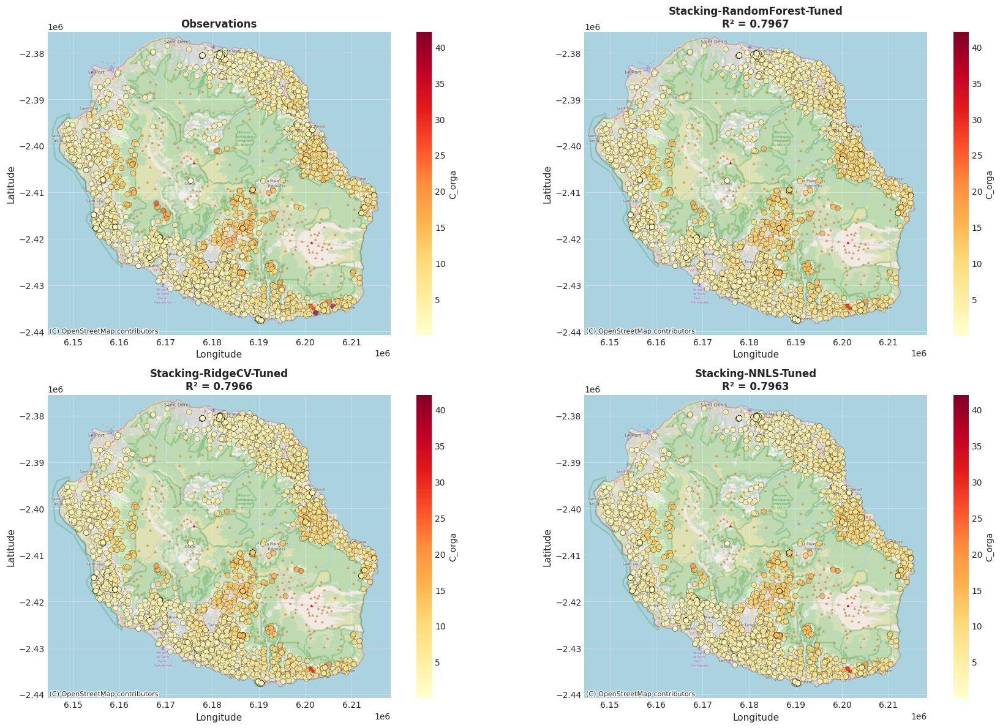


✓ Visualisation terminée - 4 cartes générées


In [64]:
# Cartes de prédiction spatiale : Observations vs Prédictions
if all(col in X_test.columns for col in ['LONGITUDE', 'LATITUDE']):
    import contextily as ctx
    from geopandas import GeoDataFrame, points_from_xy

    print("=" * 80)
    print("CARTES DE PRÉDICTION SPATIALE")
    print("=" * 80)

    # Obtenir les 3 meilleurs modèles du classement final
    top_3_models = final_test_results.head(3).index.tolist()
    print(f"\n> Top 3 modèles sélectionnés pour la visualisation:")
    for idx, model_name in enumerate(top_3_models, 1):
        r2 = final_test_results.loc[model_name, 'R²']
        rmse = final_test_results.loc[model_name, 'RMSE']
        print(f"   {idx}. {model_name} (R²={r2:.4f}, RMSE={rmse:.4f})")

    # Préparer les prédictions pour chaque modèle
    models_for_maps = [('Observations', y_test.values)]

    for model_name in top_3_models:
        # Récupérer les prédictions selon le type de modèle
        if 'Stacking-' in model_name:
            # C'est un meta-learner
            meta_name = model_name.replace('Stacking-', '')

            if '-Tuned' in meta_name:
                # Modèle finetuné
                base_meta_name = meta_name.replace('-Tuned', '')
                if meta_name in finetuned_models:
                    model_obj = finetuned_models[meta_name]
                    use_scaled = base_meta_name in ['HuberRegressor', 'ElasticNetCV', 'RidgeCV']
                    X_pred = X_test_meta_scaled if use_scaled else X_test_meta
                    predictions = model_obj.predict(X_pred)
                    models_for_maps.append((model_name, predictions))
            else:
                # Modèle original
                if meta_name in stacking_models:
                    model_obj = stacking_models[meta_name]
                    use_scaled = meta_name in ['HuberRegressor', 'ElasticNetCV', 'RidgeCV']
                    X_pred = X_test_meta_scaled if use_scaled else X_test_meta
                    predictions = model_obj.predict(X_pred)
                    models_for_maps.append((model_name, predictions))
        else:
            # Modèles de base - utiliser test_predictions_dict si disponible
            if model_name in test_predictions_dict:
                predictions = test_predictions_dict[model_name]
                models_for_maps.append((model_name, predictions))

    print(f"\n> {len(models_for_maps)} cartes à générer (Observations + {len(models_for_maps)-1} modèles)")

    # Créer les cartes
    n_models = len(models_for_maps)
    n_cols = 2
    n_rows = (n_models + 1) // 2

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
    axes = axes.flatten() if n_models > 1 else [axes]

    # Définir les limites de couleur communes pour toutes les cartes
    vmin = y_test.min()
    vmax = y_test.max()

    for idx, (model_name, predictions) in enumerate(models_for_maps):
        if idx < len(axes):
            # Créer un GeoDataFrame avec les données de test
            gdf_viz = GeoDataFrame(
                X_test.copy(),
                geometry=points_from_xy(X_test['LONGITUDE'], X_test['LATITUDE']),
                crs='EPSG:32740'  # UTM Zone 40S pour La Réunion
            ).to_crs(epsg=3857)  # Convertir en Web Mercator pour contextily

            # Ajouter les prédictions au GeoDataFrame
            gdf_viz['predictions'] = predictions

            # Créer le scatter plot
            scatter = gdf_viz.plot(
                ax=axes[idx],
                column='predictions',
                cmap='YlOrRd',
                markersize=40,
                alpha=0.7,
                edgecolor='black',
                linewidth=0.3,
                vmin=vmin,
                vmax=vmax,
                legend=False
            )

            # Ajouter le fond de carte
            ctx.add_basemap(axes[idx], source=ctx.providers.OpenStreetMap.Mapnik)

            axes[idx].set_xlabel('Longitude', fontsize=11)
            axes[idx].set_ylabel('Latitude', fontsize=11)

            if model_name == 'Observations':
                axes[idx].set_title(f'{model_name}', fontsize=12, fontweight='bold')
            else:
                r2 = r2_score(y_test, predictions)
                axes[idx].set_title(f'{model_name}\nR² = {r2:.4f}',
                                   fontsize=12, fontweight='bold')

            axes[idx].grid(alpha=0.3)

            # Colorbar
            sm = plt.cm.ScalarMappable(cmap='YlOrRd', norm=plt.Normalize(vmin=vmin, vmax=vmax))
            sm.set_array([])
            cbar = plt.colorbar(sm, ax=axes[idx])
            cbar.set_label('C_orga', fontsize=10)

    # Masquer les axes inutilisés
    for idx in range(len(models_for_maps), len(axes)):
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

    print(f"\n✓ Visualisation terminée - {len(models_for_maps)} cartes générées")


## Phase 12 : Summary

In [65]:
print("\n" + "=" * 80)
print("RÉSUMÉ FINAL - ANALYSE COMPLÈTE DES PERFORMANCES")
print("=" * 80)

print("\n> DATASET :")
print(f"   - Échantillons totaux : {len(df_processed)}")
print(f"   - Features utilisées : {X_train.shape[1]}")
print(f"   - Train/Test split : {len(X_train)}/{len(X_test)} ({len(X_train)/len(X)*100:.0f}%/{len(X_test)/len(X)*100:.0f}%)")

# Top 5 meilleurs modèles (tous types confondus)
print("\n> TOP 5 MEILLEURS MODÈLES :")
for idx, (model_name, row) in enumerate(final_test_results.head(5).iterrows(), 1):
    print(f"   {idx}. {model_name}")
    print(f"      R² = {row['R²']:.4f} | RMSE = {row['RMSE']:.4f} | MAE = {row['MAE']:.4f}")

# Top 5 meilleurs modèles de base (sans ensemble/meta-learner/stacking)
print("\n> TOP 5 MEILLEURS MODÈLES DE BASE :")
base_model_keywords = ['Linear', 'Random Forest', 'XGBoost', 'LightGBM', 'CatBoost', 'TabPFN', 'GNN', 'Kriging', 'GWR']
base_models = final_test_results[final_test_results.index.str.contains('|'.join(base_model_keywords))]
# Exclure les modèles qui contiennent 'Ensemble', 'Stacking', 'Meta', 'Tuned', 'Finetuned'
exclude_keywords = ['Ensemble', 'Stacking', 'Meta', 'Tuned', 'Finetuned']
for keyword in exclude_keywords:
    base_models = base_models[~base_models.index.str.contains(keyword, case=False)]

for idx, (model_name, row) in enumerate(base_models.head(5).iterrows(), 1):
    print(f"   {idx}. {model_name}")
    print(f"      R² = {row['R²']:.4f} | RMSE = {row['RMSE']:.4f} | MAE = {row['MAE']:.4f}")

# Amélioration des métriques entre baseline et meilleur modèle
print("\n> AMÉLIORATION BASELINE → MEILLEUR MODÈLE :")
baseline_model = 'Linear Regression'
if baseline_model in final_test_results.index:
    baseline = final_test_results.loc[baseline_model]
    best_model = final_test_results.iloc[0]
    best_model_name = final_test_results.index[0]

    print(f"   Baseline : {baseline_model}")
    print(f"   Meilleur : {best_model_name}")
    print()

    # Métriques où plus grand = meilleur
    higher_is_better = ['R²', 'Explained Variance']

    # Toutes les métriques disponibles
    metrics_to_compare = ['R²', 'Explained Variance', 'RMSE', 'MAE', 'Median AE',
                          'MAPE (%)', 'Max Error', 'Std Residuals', 'Q95 Error']

    for metric in metrics_to_compare:
        if metric in baseline.index and metric in best_model.index:
            baseline_val = baseline[metric]
            best_val = best_model[metric]

            if metric in higher_is_better:
                # Pour R², Explained Variance : augmentation = amélioration
                improvement = ((best_val - baseline_val) / abs(baseline_val)) * 100 if baseline_val != 0 else 0
                symbol = "↑" if improvement > 0 else "↓"
                print(f"   {metric:20s} : {baseline_val:8.4f} → {best_val:8.4f}  ({symbol} {abs(improvement):6.1f}%)")
            else:
                # Pour RMSE, MAE, etc. : diminution = amélioration
                improvement = ((baseline_val - best_val) / abs(baseline_val)) * 100 if baseline_val != 0 else 0
                symbol = "↓" if improvement > 0 else "↑"
                print(f"   {metric:20s} : {baseline_val:8.4f} → {best_val:8.4f}  ({symbol} {abs(improvement):6.1f}%)")

# Meilleures améliorations par métrique
print("\n> MEILLEURES AMÉLIORATIONS PAR MÉTRIQUE (vs baseline) :")
if baseline_model in final_test_results.index:
    baseline = final_test_results.loc[baseline_model]

    for metric in metrics_to_compare:
        if metric in final_test_results.columns:
            best_improvement = None
            best_improvement_model = None

            for model_name, row in final_test_results.iterrows():
                if model_name == baseline_model:
                    continue

                baseline_val = baseline[metric]
                model_val = row[metric]

                if metric in higher_is_better:
                    # Plus grand = meilleur
                    improvement = ((model_val - baseline_val) / abs(baseline_val)) * 100 if baseline_val != 0 else 0
                else:
                    # Plus petit = meilleur
                    improvement = ((baseline_val - model_val) / abs(baseline_val)) * 100 if baseline_val != 0 else 0

                if best_improvement is None or improvement > best_improvement:
                    best_improvement = improvement
                    best_improvement_model = model_name
                    best_improvement_val = model_val

            if best_improvement_model:
                symbol = "↑" if metric in higher_is_better else "↓"
                print(f"   {metric:20s} : {best_improvement_model:30s} ({symbol} {abs(best_improvement):6.1f}%  | {best_improvement_val:.4f})")

# Features importantes
print("\n> FEATURES LES PLUS IMPORTANTES :")
if 'importances_comparison' in locals():
    top_features = importances_comparison.head(5)
    for idx, (feature, row) in enumerate(top_features.iterrows(), 1):
        mean_importance = row['Mean']
        print(f"   {idx}. {feature:40s} (importance moyenne : {mean_importance:.4f})")

# Autocorrélation spatiale
print("\n> AUTOCORRÉLATION SPATIALE (Moran's I sur les résidus) :")
if moran_available and 'moran_results' in locals() and len(moran_results) > 0:
    print("   Test de Moran's I - Détection d'autocorrélation spatiale dans les résidus :")
    print("   (I > 0 = clustering spatial, I < 0 = dispersion, I ≈ 0 = aléatoire)")
    print()
    for model_name, moran_stats in moran_results.items():
        if isinstance(moran_stats, dict):
            moran_i = moran_stats.get("Moran's I", 'N/A')
            p_value = moran_stats.get('p-value', 'N/A')
            if moran_i != 'N/A' and p_value != 'N/A':
                significance = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else "ns"
                print(f"   - {model_name:30s} : I = {moran_i:7.4f}  (p = {p_value:.4f}) {significance}")
else:
    print("   ! Analyse de l'autocorrélation spatiale non disponible")

print("\n" + "=" * 80)
print("PIPELINE COMPLET TERMINÉ !")
print("=" * 80)


RÉSUMÉ FINAL - ANALYSE COMPLÈTE DES PERFORMANCES

> DATASET :
   - Échantillons totaux : 23518
   - Features utilisées : 10
   - Train/Test split : 18814/4704 (80%/20%)

> TOP 5 MEILLEURS MODÈLES :
   1. Stacking-RandomForest-Tuned
      R² = 0.7967 | RMSE = 1.7296 | MAE = 1.0057
   2. Stacking-RidgeCV-Tuned
      R² = 0.7966 | RMSE = 1.7302 | MAE = 0.9970
   3. Stacking-NNLS-Tuned
      R² = 0.7963 | RMSE = 1.7313 | MAE = 0.9977
   4. Stacking-LinearRegression-Tuned
      R² = 0.7963 | RMSE = 1.7313 | MAE = 0.9970
   5. Stacking-ElasticNetCV-Tuned
      R² = 0.7958 | RMSE = 1.7334 | MAE = 1.0134

> TOP 5 MEILLEURS MODÈLES DE BASE :
   1. CatBoost
      R² = 0.7957 | RMSE = 1.7338 | MAE = 1.0086
   2. Random Forest
      R² = 0.7934 | RMSE = 1.7437 | MAE = 0.9998
   3. LightGBM
      R² = 0.7901 | RMSE = 1.7574 | MAE = 1.0277
   4. XGBoost
      R² = 0.7899 | RMSE = 1.7583 | MAE = 1.0077
   5. TabPFN
      R² = 0.7598 | RMSE = 1.8798 | MAE = 1.0776

> AMÉLIORATION BASELINE → MEILLEUR 

<!-- ## 📦 Annexe : Installation des Bibliothèques

Si certains modèles n'ont pas pu être exécutés, installez les bibliothèques manquantes :

```bash
# Bibliothèques de base (normalement déjà installées)
pip install pandas numpy matplotlib seaborn scikit-learn scipy

# Optimisation des hyperparamètres
pip install optuna

# Modèles avancés
pip install xgboost lightgbm

# Modèles spatiaux
pip install pykrige mgwr libpysal esda geopandas
```

**Notes importantes :**
- Ce notebook utilise **Optuna** pour l'optimisation des hyperparamètres (plus efficace que GridSearchCV/RandomizedSearchCV)
- Seules **5 features** sont autorisées : LONGITUDE, LATITUDE, ALTITUDE, YEAR, SOIL
- Certains modèles spatiaux peuvent nécessiter beaucoup de mémoire sur de gros datasets -->